# import packages

In [1]:
import pandas as pd 
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import spearmanr
from scipy.spatial.distance import cosine
from scipy.stats import zscore

C:\Users\jymbc\Anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\jymbc\Anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib.ticker as mticker

In [3]:
# 按行进行标准归一化
def standardscaler_row(df):
    scaler=StandardScaler()
    proname=df.T.columns
    k=df.T
    dfdf_pro=scaler.fit_transform(k)
    # 按行进行标准化后的 dataframe
    dfpro_stdbyrow=pd.DataFrame(dfdf_pro.T,index=df.index,columns=df.columns)
    return dfpro_stdbyrow

# data path and save path

In [4]:
file_read_path = r'F:\SMAD PROJECT\new_druganalysis\multi\files'

In [5]:
figure_save_path = r'F:\SMAD PROJECT\new_druganalysis\multi\figures'
file_save_path = r'F:\SMAD PROJECT\new_druganalysis\multi\files'

In [6]:
pro_file_read_path   = r'F:\SMAD PROJECT\new_druganalysis\proteome\test\files'
meta_file_read_path = r'F:\SMAD PROJECT\new_druganalysis\metabolome\test\files'

In [7]:
dfpro_p = pd.read_csv(f'{pro_file_read_path}\proteome_Pvalues.csv',index_col = 0)
dfpro_pbh = pd.read_csv(f'{pro_file_read_path}\proteome_Pvalues_afterBH.csv',index_col = 0)

dfmeta_p = pd.read_csv(f'{meta_file_read_path}\metabolome_Pvalues.csv',index_col = 0)
dfmeta_pbh = pd.read_csv(f'{meta_file_read_path}\metabolome_Pvalues_afterBH.csv',index_col = 0)


In [8]:
df_drug_cato = pd.read_excel(f'{file_read_path}\drugs0506.xlsx', sheet_name = 'Sheet6')

# multiome matrix preparation 

In [9]:
df_meta = pd.read_csv(f'{meta_file_read_path}\metabolome_after_Normalization and imputation and BC2.csv',index_col = 0)
df_pro =  pd.read_csv(f'{pro_file_read_path}\proteome_after_Normalization and imputation and BC.csv',index_col = 0)

In [12]:
df_meta

,Acamprosate1,Acamprosate2,Acamprosate3,Acamprosate4,Acamprosate5,Acamprosate6,Acenocoumarol1,Acenocoumarol2,Acenocoumarol3,Acenocoumarol4,...,Yohimbine3,Yohimbine4,Yohimbine5,Yohimbine6,Zaltoprofen1,Zaltoprofen2,Zaltoprofen3,Zaltoprofen4,Zaltoprofen5,Zaltoprofen6
1-aminocyclopropane-1-carboxylic acid,30.238189,77.729241,109.390346,161.000547,150.943392,219.139219,109.160753,109.968554,32.842835,193.893377,...,140.805501,18.191467,96.911310,44.370248,223.123793,161.844534,514.645059,197.949100,92.698688,180.739586
1-aminocyclopropanecarboxylate,703.264660,1460.639760,1908.852175,1927.939641,1267.418135,1849.953082,1767.001262,1445.904120,320.787436,1865.822959,...,1664.548972,3198.090398,2402.488936,362.679486,3497.169964,2068.970559,5155.007688,1704.320640,277.255175,2513.346210
proline,1.847848,4.112062,3.474573,2.115076,1.933426,1.319928,3.338037,2.192576,0.012150,1.889972,...,0.864362,1.495488,2.106504,1.199964,3.919690,2.436559,0.738803,2.359870,2.277147,1.018378
indoline,425.114013,358.140157,274.900299,382.948945,316.093520,257.949743,266.423993,359.562375,497.329818,251.568633,...,281.816732,260.855220,314.975283,213.766683,334.507321,359.433823,274.951166,338.837577,319.499873,229.277104
"2,6-xylidine",3.506244,3.402972,3.265070,3.875707,3.244120,2.892618,1.891235,2.747135,6.693901,3.231565,...,3.177663,1.899199,2.446216,3.018264,2.489955,3.638001,1.341072,3.056428,2.437630,2.440163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n1-acetylspermine,2.633097,4.008525,2.313439,3.104038,2.804082,2.474601,2.239186,2.686830,4.031828,2.496820,...,2.540155,2.637722,2.613033,2.129159,1.962929,2.780742,2.335141,2.541290,2.506221,2.899455
"""4-hydroxy-5,7-dimethyl-3-benzylhydroquinolin-2-one",2.502606,2.228423,2.360205,1.984810,2.310306,1.082248,1.589894,1.767797,1.270994,1.522726,...,1.908009,1.305527,1.879912,1.286435,1.464654,1.779324,1.167060,1.598283,1.798053,1.096656
2-amino-2-methylpropanoic acid,32.772621,30.601714,66.958015,41.160671,32.092716,59.367537,48.190060,43.401198,26.522818,48.373752,...,28.229865,25.858861,49.190295,91.778337,39.712844,24.475872,171.993336,38.164417,59.230051,46.629395
3-aminoisobutanoic acid,28.634521,30.811244,67.311662,41.662404,32.574439,59.895412,43.233229,43.937167,27.250198,48.869905,...,28.941467,26.372430,49.678776,92.279628,35.206189,24.529167,171.376168,38.668467,59.722500,47.167719


In [26]:
# df_meta

In [25]:
# df_pro

In [13]:
# calculate mean values of 6 duplicates 
mean_meta = pd.read_csv(f'{meta_file_read_path}\metabolome_mean2.csv',index_col = 0)
mean_pro  = pd.read_csv(f'{pro_file_read_path}\proteome_mean.csv',index_col = 0)

In [14]:
# take log2 to the mean dataset to make it more normal distributed
log_meta  = np.log2(mean_meta*100) 
log_pro   = np.log2(mean_pro*1000) 

In [15]:
#  up and down calculation by all drugs subtract DMSO column 
heatmap_meta = pd.read_csv(f'{meta_file_read_path}\metabolome_up_down.csv',index_col = 0)
heatmap_pro  = pd.read_csv(f'{pro_file_read_path}\proteome_up_down.csv',index_col = 0)
# heatmap_meta = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_up_down_scaled.csv',index_col = 0)
# heatmap_pro  = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_up_down_scaled.csv',index_col = 0)

In [16]:
# DatasetNormalizeDf.standardscaler(heatmap_pro.T).T

In [17]:
# heatmap_meta.index = [str(item) for item in range(len(heatmap_meta))]

In [18]:
heatmap_multi = pd.concat([heatmap_meta, heatmap_pro], axis=0)
mean_multi    = pd.concat([mean_meta, mean_pro], axis=0)
log_multi     = pd.concat([log_meta, log_pro], axis=0)

In [19]:
mean_multi

,DMSO,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
1-aminocyclopropane-1-carboxylic acid,81.949082,97.223242,124.529929,92.939666,99.758016,119.330539,97.756028,60.035062,130.403599,120.493014,...,121.905177,106.497508,109.045239,93.863114,73.789769,123.386732,80.454171,141.415441,80.639363,229.138801
1-aminocyclopropanecarboxylate,1454.082706,1353.490034,1522.691408,1779.428276,844.255563,1620.375934,1856.195807,2437.075305,1963.938155,1599.672524,...,2089.416083,1556.303102,1559.866061,1103.506994,1199.522998,1480.706129,1915.784760,1686.228697,1805.085848,2561.853069
proline,2.734191,4.876923,2.475658,2.933988,4.093722,2.361773,3.738542,2.621414,3.133315,2.547030,...,2.399635,3.430050,3.286197,2.029437,2.843644,2.001909,2.531897,2.456745,1.817891,2.142764
indoline,363.779396,499.414263,337.291987,340.976255,443.257627,319.411918,345.681086,332.329510,327.386074,384.151434,...,295.769501,353.549823,336.327437,355.690110,375.848576,308.244011,287.942382,306.731595,290.272266,310.478266
"2,6-xylidine",3.087942,5.219785,3.367875,3.561733,4.323636,3.313032,3.480617,3.167073,2.396744,3.282082,...,2.535103,2.733973,3.310504,3.035641,2.684158,2.847219,2.417468,2.904989,2.393713,2.576704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,7.362597,7.294430,7.621795,7.177537,7.692605,7.007858,7.719789,7.483407,7.330240,6.889868,...,6.997212,7.623899,7.731100,7.468900,7.295605,7.219755,7.177011,7.380208,7.523869,7.296822
SRSF6,26.899866,23.633851,25.099893,26.086000,26.192279,24.543674,26.593315,27.735426,26.484725,26.120190,...,25.192671,25.341963,26.218824,27.681309,27.329055,22.924691,26.070994,26.797979,26.858093,24.194763
SEP11,3.808580,3.693349,3.724688,3.579285,3.828887,3.621633,3.854679,4.030079,3.810611,3.714236,...,3.860443,3.821220,3.633133,3.555290,3.815822,3.613072,3.542208,3.745129,3.472612,3.589171
HBG2,14.052624,14.833818,15.541209,12.710227,12.990026,12.241146,12.709871,14.995860,14.606491,14.234092,...,13.956009,12.601600,11.976412,12.512416,10.671021,12.160030,14.057797,12.141321,13.068631,15.294154


In [20]:
# standardscaler_row(mean_multi).to_csv(f'{file_read_path}\drugs_mean_multi_ss_by_row.csv')

In [21]:
# log_multi.iloc[:,2].hist() 

In [22]:
# log_multi.iloc[35,:].hist() 

In [23]:
mean_multi_updown = mean_multi.sub(mean_multi.iloc[:, 0], axis=0).iloc[:,1:]
mean_multi_updown

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
1-aminocyclopropane-1-carboxylic acid,15.274160,42.580847,10.990584,17.808934,37.381457,15.806946,-21.914020,48.454517,38.543932,-6.342463,...,39.956095,24.548426,27.096157,11.914032,-8.159313,41.437650,-1.494911,59.466359,-1.309719,147.189719
1-aminocyclopropanecarboxylate,-100.592672,68.608702,325.345570,-609.827143,166.293228,402.113101,982.992599,509.855449,145.589818,163.222068,...,635.333377,102.220396,105.783355,-350.575712,-254.559708,26.623423,461.702054,232.145991,351.003142,1107.770363
proline,2.142732,-0.258532,0.199797,1.359531,-0.372418,1.004351,-0.112777,0.399125,-0.187161,-0.067621,...,-0.334556,0.695859,0.552006,-0.704754,0.109454,-0.732282,-0.202294,-0.277446,-0.916299,-0.591427
indoline,135.634867,-26.487409,-22.803141,79.478232,-44.367478,-18.098310,-31.449886,-36.393321,20.372038,-10.913879,...,-68.009895,-10.229573,-27.451958,-8.089286,12.069180,-55.535384,-75.837014,-57.047800,-73.507129,-53.301129
"2,6-xylidine",2.131843,0.279933,0.473791,1.235694,0.225090,0.392674,0.079131,-0.691198,0.194140,0.905290,...,-0.552839,-0.353969,0.222562,-0.052301,-0.403784,-0.240723,-0.670474,-0.182953,-0.694229,-0.511238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,-0.068167,0.259198,-0.185060,0.330008,-0.354739,0.357191,0.120810,-0.032357,-0.472729,0.302245,...,-0.365385,0.261302,0.368503,0.106303,-0.066992,-0.142842,-0.185586,0.017611,0.161272,-0.065775
SRSF6,-3.266015,-1.799973,-0.813866,-0.707587,-2.356193,-0.306551,0.835560,-0.415141,-0.779676,-0.270564,...,-1.707196,-1.557903,-0.681042,0.781443,0.429189,-3.975175,-0.828872,-0.101888,-0.041773,-2.705103
SEP11,-0.115231,-0.083892,-0.229295,0.020307,-0.186947,0.046099,0.221499,0.002031,-0.094344,0.084949,...,0.051863,0.012640,-0.175447,-0.253289,0.007242,-0.195508,-0.266371,-0.063451,-0.335967,-0.219409
HBG2,0.781194,1.488586,-1.342397,-1.062597,-1.811478,-1.342753,0.943237,0.553867,0.181468,-0.986931,...,-0.096614,-1.451024,-2.076211,-1.540208,-3.381602,-1.892594,0.005173,-1.911302,-0.983992,1.241530


In [102]:
log_meta_updown = log_meta.sub(log_meta.iloc[:, 0], axis=0).iloc[:,1:]
log_pro_updown  = log_pro.sub(log_pro.iloc[:, 0], axis=0).iloc[:,1:]
log_pro_updown


,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
genes,,,,,,,,,,,,,,,,,,,,,
TRYP,-0.049935,0.122946,0.096148,-0.068889,0.208124,0.067476,-0.016654,-0.017516,0.126157,0.076143,...,-0.044369,0.141937,0.102967,0.102424,-0.073710,-0.009736,0.182561,0.095974,0.102985,-0.110833
ALBU,0.170880,0.103058,-0.034592,0.031960,-0.016178,-0.100433,0.104168,0.278802,-0.111590,0.054957,...,-0.084335,0.059774,-0.237383,-0.033397,-0.244012,-0.042343,-0.043906,-0.301392,-0.030496,0.049111
FBLL1,-0.155739,-0.085904,-0.122852,-0.172935,-0.399566,-0.207003,-0.322480,-0.039157,-0.353680,-0.176875,...,-0.113859,-0.047367,-0.019708,0.021226,-0.052155,-0.363439,-0.110322,-0.135367,0.173425,-0.417809
DX39A,0.096354,-0.066602,-0.030855,-0.025423,-0.016886,-0.074995,-0.078738,-0.025652,-0.018935,0.024417,...,-0.019976,-0.008861,0.003854,-0.106789,-0.012450,-0.034561,0.018215,-0.020054,-0.016052,0.110695
BACH,-0.222540,-0.076801,0.025027,-0.061165,-0.023546,-0.047117,0.005625,-0.065445,-0.113515,-0.035583,...,-0.000964,-0.069489,-0.018613,-0.037877,-0.139818,-0.006484,0.037919,-0.035765,-0.034686,-0.052316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,-0.013419,0.049916,-0.036726,0.063257,-0.071241,0.068347,0.023480,-0.006354,-0.095738,0.058041,...,-0.073435,0.050314,0.070459,0.020681,-0.013187,-0.028265,-0.036832,0.003447,0.031260,-0.012946
SRSF6,-0.186744,-0.099918,-0.044323,-0.038457,-0.132248,-0.016535,0.044131,-0.022438,-0.042434,-0.014584,...,-0.094595,-0.086071,-0.036996,0.041313,0.022837,-0.230697,-0.045153,-0.005475,-0.002242,-0.152904
SEP11,-0.044324,-0.032134,-0.089582,0.007672,-0.072613,0.017357,0.081555,0.000769,-0.036188,0.031825,...,0.019513,0.004780,-0.068039,-0.099286,0.002741,-0.076027,-0.104604,-0.024238,-0.133232,-0.085603


In [103]:
#  up and down calculation by all drugs subtract DMSO column to the dataset after take log2
dfe = log_multi.copy() 
updown_multi = dfe.sub(dfe.iloc[:, 0], axis=0).iloc[:,1:]
# updown_multi = dfe.div(dfe.iloc[:, 0], axis=0).iloc[:,1:]

In [131]:
updown_multi

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
1-aminocyclopropane-1-carboxylic acid,0.246573,0.603693,0.181567,0.283705,0.542164,0.254458,-0.448922,0.670184,0.556150,-0.116215,...,0.572960,0.378020,0.412127,0.195831,-0.151307,0.590388,-0.026561,0.787140,-0.023244,1.483422
1-aminocyclopropanecarboxylate,-0.103425,0.066514,0.291304,-0.784358,0.156219,0.352240,0.745042,0.433640,0.137667,0.153482,...,0.522990,0.098014,0.101313,-0.398014,-0.277649,0.026176,0.397826,0.213691,0.311958,0.817078
proline,0.834857,-0.143302,0.101749,0.582299,-0.211243,0.451362,-0.060769,0.196576,-0.102298,-0.036129,...,-0.188299,0.327116,0.265305,-0.430034,0.056627,-0.449737,-0.110895,-0.154366,-0.588848,-0.351641
indoline,0.457173,-0.109066,-0.093393,0.285082,-0.187646,-0.073622,-0.130449,-0.152071,0.078611,-0.043945,...,-0.298591,-0.041150,-0.113197,-0.032443,0.047088,-0.238991,-0.337284,-0.246087,-0.325657,-0.228572
"2,6-xylidine",0.757345,0.125193,0.205934,0.485600,0.101506,0.172697,0.036505,-0.365570,0.087966,0.370911,...,-0.284601,-0.175647,0.100405,-0.024644,-0.202176,-0.117092,-0.353149,-0.088113,-0.367396,-0.261119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,-0.013419,0.049916,-0.036726,0.063257,-0.071241,0.068347,0.023480,-0.006354,-0.095738,0.058041,...,-0.073435,0.050314,0.070459,0.020681,-0.013187,-0.028265,-0.036832,0.003447,0.031260,-0.012946
SRSF6,-0.186744,-0.099918,-0.044323,-0.038457,-0.132248,-0.016535,0.044131,-0.022438,-0.042434,-0.014584,...,-0.094595,-0.086071,-0.036996,0.041313,0.022837,-0.230697,-0.045153,-0.005475,-0.002242,-0.152904
SEP11,-0.044324,-0.032134,-0.089582,0.007672,-0.072613,0.017357,0.081555,0.000769,-0.036188,0.031825,...,0.019513,0.004780,-0.068039,-0.099286,0.002741,-0.076027,-0.104604,-0.024238,-0.133232,-0.085603
HBG2,0.078050,0.145259,-0.144850,-0.113435,-0.199101,-0.144890,0.093725,0.055770,0.018511,-0.105056,...,-0.009953,-0.157233,-0.230644,-0.167479,-0.397141,-0.208693,0.000531,-0.210914,-0.104731,0.122141


In [117]:
updown_multi.to_csv(f'{file_read_path}\drugs_mean_multi_updown_log.csv')

In [105]:
#  normalization class

from sklearn.preprocessing import StandardScaler

class DatasetNormalizeDf:
    
    @staticmethod 
    def divided_by_a_protein(df, row_index = '2/sp|Q16777|H2A2C_HUMAN/sp|Q6FI13|H2A2A_HUMAN'):
        '''Divides the DataFrame by a specific protein row index,
        columns as treatments and rows as proteins'''
        
        # Dividing the entire DataFrame by the chosen row
        normalized_df = df.div(df.loc[row_index], axis=1)
                               
        return normalized_df  
    
    @staticmethod      
    def divided_by_total_counts(df):
        '''Divides each column in the DataFrame by the total sum of that column,
        columns as treatments and rows as proteins'''
               
        column_sums = df.sum()
        normalized_df = df.div(column_sums, axis=1)
        
        return normalized_df
    
    def standardscaler(df):     
        '''apply standard normalization to a dataframe, 
        columns as treatments and rows as proteins'''
        # # Initialize the StandardScaler
        scaler = StandardScaler()
        # Fit and transform the data according to rows
        scaled_data = scaler.fit_transform(df)
        normalized_df = pd.DataFrame(scaled_data, index=df.index, columns=df.columns)
        return normalized_df
        
# abs max normalize to the rows in a dataframe
def max_abs_normalize(row):
    max_abs = row.abs().max()
    if max_abs == 0:
        return row
    return row / max_abs

In [106]:
# function to plot UMAP
# Function to determine label
def get_label(index):
    for name in namestrings:
        if name in index:
            return name
    return 'Others'

# function to plot UMAP, Z-score normalization applied in the function 
import umap 
def plot_umap(df, namestring = ['1'], figuretitle = 'UMAP'):
    plt.rcParams['font.family'] = 'Arial'
    reducer = umap.UMAP(n_neighbors=15, n_components=2, random_state=42)
    scaler = StandardScaler()
    # Fit and transform the data according to rows
    df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
    embedding = reducer.fit_transform(df_scaled)   
    # Step 3: Create a new DataFrame for UMAP results
    umap_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'], index=df.index)
    
    # Step 4: Add non-numeric labels to the new DataFrame
#     umap_df['Label'] = df.index.map(lambda x: namestring1 if namestring1 in x else
#                                               namestring2 if namestring2 in x else
#                                               namestring3 if namestring3 in x else 'others')
    umap_df['Label'] = df.index.map(get_label)

    # Step 5: Plot using the new DataFrame
    #palette = {namestring: 'red', 'others': 'grey'}
    #palette = color_dict
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue='Label', data=umap_df, s=60, alpha=0.8, legend=True)
    plt.title(figuretitle,fontsize=20)
    plt.xlabel('UMAP 1',fontsize=20)
    plt.ylabel('UMAP 2',fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    # plt.savefig(f'{figure_save_path}/{figuretitle}.svg',dpi=800,bbox_inches='tight')
    plt.show()

# plot heatmap for whole dataset

In [13]:
dual_raw_multiome = pd.concat([df_pro, df_meta], axis=0)    # stitch raw values with replicates together for multiome 

In [15]:
dual_raw_multiome.to_csv(f'{file_read_path}\dual_raw_multiome.csv')

In [16]:
dual_raw_multiome

,Acamprosate1,Acamprosate2,Acamprosate3,Acamprosate4,Acamprosate5,Acamprosate6,Acenocoumarol1,Acenocoumarol2,Acenocoumarol3,Acenocoumarol4,...,Yohimbine3,Yohimbine4,Yohimbine5,Yohimbine6,Zaltoprofen1,Zaltoprofen2,Zaltoprofen3,Zaltoprofen4,Zaltoprofen5,Zaltoprofen6
1/contam_sp|P00761|TRYP_PIG,125.991396,133.107707,108.751144,116.453052,109.468314,126.893530,115.643407,104.805719,123.291487,88.672599,...,110.777190,136.440074,144.963472,86.650160,102.533341,117.369796,79.679171,107.067307,87.701389,118.506032
1/contam_sp|P02769|ALBU_BOVIN,99.745318,95.948386,104.395786,105.960974,133.955275,137.618259,113.903938,91.840000,117.396238,88.649254,...,114.914345,105.639967,97.850435,99.300241,116.415954,114.466779,125.801094,108.064839,90.298852,97.705766
1/sp|A6NHQ2|FBLL1_HUMAN,8.040628,8.161789,6.133581,6.173820,5.606534,5.651277,4.195665,7.879693,8.294884,7.495291,...,7.438408,7.712398,10.714439,8.826348,4.224697,4.207488,4.850984,6.971732,5.679872,5.660090
1/sp|O00148|DX39A_HUMAN,17.387124,16.203218,18.502166,16.800376,15.593527,17.876693,17.039457,18.830061,19.091362,13.682992,...,18.230284,17.272146,19.110754,17.325849,18.641324,19.425617,21.317109,18.972414,18.025276,19.366718
1/sp|O00154|BACH_HUMAN,2.423423,2.282892,2.317733,2.219701,2.000475,2.185573,2.518255,2.232644,2.131480,2.609549,...,2.225497,2.409188,2.373959,1.864807,1.742362,2.304404,2.018579,2.423026,2.443092,2.728205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n1-acetylspermine,2.633097,4.008525,2.313439,3.104038,2.804082,2.474601,2.239186,2.686830,4.031828,2.496820,...,2.540155,2.637722,2.613033,2.129159,1.962929,2.780742,2.335141,2.541290,2.506221,2.899455
"""4-hydroxy-5,7-dimethyl-3-benzylhydroquinolin-2-one",2.502606,2.228423,2.360205,1.984810,2.310306,1.082248,1.589894,1.767797,1.270994,1.522726,...,1.908009,1.305527,1.879912,1.286435,1.464654,1.779324,1.167060,1.598283,1.798053,1.096656
2-amino-2-methylpropanoic acid,32.772621,30.601714,66.958015,41.160671,32.092716,59.367537,48.190060,43.401198,26.522818,48.373752,...,28.229865,25.858861,49.190295,91.778337,39.712844,24.475872,171.993336,38.164417,59.230051,46.629395
3-aminoisobutanoic acid,28.634521,30.811244,67.311662,41.662404,32.574439,59.895412,43.233229,43.937167,27.250198,48.869905,...,28.941467,26.372430,49.678776,92.279628,35.206189,24.529167,171.376168,38.668467,59.722500,47.167719


In [17]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
def normalize_dataframe(df, method='zscore', axis=0):
    """
    Normalize a DataFrame by rows or columns.
    
    Parameters:
    - df (pd.DataFrame): Input DataFrame to normalize.
    - method (str): Normalization method. Options are:
        'zscore' (standardization using z-score)
        'minmax' (normalization to range [0, 1])
    - axis (int): Axis to normalize along. 0 for columns, 1 for rows.
    
    Returns:
    - pd.DataFrame: Normalized DataFrame.
    """
    if method not in ['zscore', 'minmax']:
        raise ValueError("Method must be 'zscore' or 'minmax'")
    
    scaler = StandardScaler() if method == 'zscore' else MinMaxScaler()
    
    if axis == 0:  # Normalize by columns
        normalized = scaler.fit_transform(df)
    elif axis == 1:  # Normalize by rows
        normalized = scaler.fit_transform(df.T).T
    else:
        raise ValueError("Axis must be 0 (columns) or 1 (rows)")
    
    return pd.DataFrame(normalized, index=df.index, columns=df.columns)


In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def plot_clusterheatmap(dfheatmap, low=-2, high=2):
    # Define custom color map
    colors = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998"]
    n_bins = 12  # Number of bins in the color map
    cmap_name = "custom_diverging"
    custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

    # Set font family
    plt.rcParams['font.family'] = 'Arial'

    # Create the heatmap with the custom color map, figure size, and hidden dendrograms
    ax = sns.clustermap(
        dfheatmap,
        annot=False,
        cmap=custom_cmap,
        cbar=True,
        vmin=low,
        vmax=high,
        figsize=(21, 13),  # Set the figure size here
        row_cluster=True,  # Enable row clustering
        col_cluster=True,  # Enable column clustering
        dendrogram_ratio=(.001, .001),  # Minimize the dendrogram size
        tree_kws={'linewidths': 0},  # Make dendrogram lines invisible
        cbar_kws={
            'orientation': 'vertical',  # 'horizontal' or 'vertical'
            # 'shrink': 0.6,  # Adjusts the size of the color bar
            'aspect': 40,  # Adjusts the length-to-width ratio of the color bar
            'pad': 0.05,  # Padding between the heatmap and the color bar
            'label': 'Color Scale'  # Label for the color bar
        },
        cbar_pos=(-0.06, 0.8, 0.03, 0.2)  # (left, bottom, width, height)
    )
    
    # Customize the color bar font
    cbar = ax.ax_cbar  # Access the color bar axis
    cbar.set_ylabel("Color Scale", fontsize=18, fontfamily='Arial')  # Set the label font size and family
    cbar.tick_params(labelsize=18)  # Set tick label size
    for tick_label in cbar.yaxis.get_ticklabels():
        tick_label.set_fontfamily('Arial')  # Set tick label font family
    
    # Hide x and y tick labels
    ax.ax_heatmap.set_xticklabels([])
    ax.ax_heatmap.set_yticklabels([])

    # Hide x-axis ticks
    ax.ax_heatmap.tick_params(axis='both', which='both', length=0)

    # Optional: Uncomment to save the plot
    # plt.savefig('clustered_heatmap.svg', dpi=800, bbox_inches='tight')
    # Show the plot
    plt.show()


In [19]:
df_multiome_duplis_ss  = normalize_dataframe(dual_raw_multiome, method='zscore', axis=1)
heatmap_draw = df_multiome_duplis_ss.copy()

In [20]:
heatmap_draw.index = range(heatmap_draw.shape[0])

In [26]:
heatmap_draw

,Acamprosate1,Acamprosate2,Acamprosate3,Acamprosate4,Acamprosate5,Acamprosate6,Acenocoumarol1,Acenocoumarol2,Acenocoumarol3,Acenocoumarol4,...,Yohimbine3,Yohimbine4,Yohimbine5,Yohimbine6,Zaltoprofen1,Zaltoprofen2,Zaltoprofen3,Zaltoprofen4,Zaltoprofen5,Zaltoprofen6
0,0.749520,1.147500,-0.214640,0.216089,-0.174533,0.799972,0.170809,-0.435288,0.598528,-1.337533,...,-0.101334,1.333863,1.810534,-1.450638,-0.562371,0.267358,-1.840490,-0.308809,-1.391848,0.330902
1,-0.242952,-0.453547,0.014984,0.101796,1.654487,1.857653,0.542349,-0.681417,0.736048,-0.858390,...,0.598391,0.083992,-0.348051,-0.267638,0.681677,0.573567,1.202219,0.218486,-0.766896,-0.356075
2,0.891922,0.961544,-0.203910,-0.180788,-0.506763,-0.481053,-1.317479,0.799445,1.038023,0.578559,...,0.545873,0.703314,2.428353,1.343414,-1.300798,-1.310686,-0.940919,0.277710,-0.464621,-0.475989
3,-0.317086,-1.148390,0.465864,-0.729084,-1.576498,0.026675,-0.561208,0.696102,0.879581,-2.918019,...,0.274957,-0.397820,0.893197,-0.360111,0.563577,1.114284,2.442436,0.796058,0.131006,1.072928
4,0.585557,-0.006577,0.140226,-0.272835,-1.196556,-0.416637,0.985137,-0.218301,-0.644557,1.369806,...,-0.248413,0.525577,0.377140,-1.768197,-2.284126,0.084063,-1.120273,0.583883,0.668434,1.869770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,-0.315570,1.539313,-0.746657,0.319534,-0.084983,-0.529316,-0.846793,-0.243107,1.570739,-0.499351,...,-0.440911,-0.309333,-0.342629,-0.995174,-1.219350,-0.116458,-0.717390,-0.439380,-0.486673,0.043636
1347,0.981685,0.527810,0.745958,0.124540,0.663357,-1.369538,-0.529194,-0.234698,-1.057092,-0.640381,...,-0.002594,-0.999928,-0.049105,-1.031532,-0.736513,-0.215616,-1.229142,-0.515306,-0.184613,-1.345688
1348,-0.360402,-0.421939,0.608629,-0.122631,-0.379674,0.393466,0.076626,-0.059120,-0.537560,0.081833,...,-0.489172,-0.556381,0.104979,1.312193,-0.163672,-0.595584,3.585993,-0.207564,0.389569,0.032387
1349,-0.496088,-0.433948,0.608031,-0.124180,-0.383614,0.396319,-0.079337,-0.059242,-0.535606,0.081573,...,-0.487325,-0.560664,0.104664,1.320793,-0.308486,-0.613283,3.578766,-0.209648,0.391383,0.032981


In [21]:
# col_colors = pd.Series(list_name_types).map(color_dict).tolist()
# colors_transposed = dict(zip(df_multiome_duplis_ss.index, col_colors))

In [24]:
# dfheatmap = normalize_dataframe(dual_raw_multiome, method='zscore', axis=1)
# plot_clusterheatmap(dfheatmap.T, low=-2, high=2)

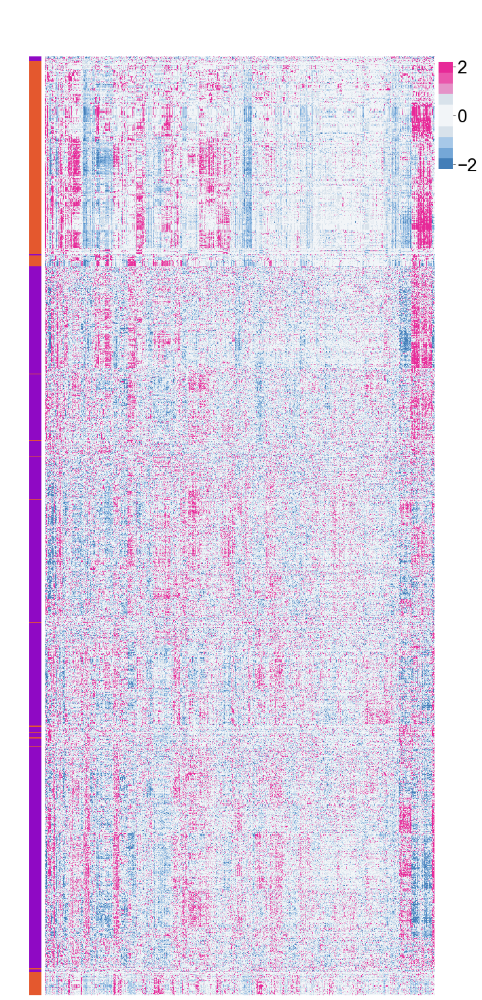

In [80]:
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

# # 1) Path simplification
# mpl.rcParams['path.simplify'] = True
# mpl.rcParams['path.simplify_threshold'] = 0.5

# 1. Build a row-color list matching heatmap_draw.shape[0]
list_name_types = ['yes'] * df_pro.shape[0] + ['no']  * df_meta.shape[0]
assert len(list_name_types) == heatmap_draw.shape[0], "Length mismatch!"

# 2. Build a simple list of colors
row_colors = ['#8F09C4' if flag=='yes' else '#E4582E'
              for flag in list_name_types]

# 3. Custom diverging colormap
colors = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998"]
custom_cmap = LinearSegmentedColormap.from_list("custom_diverging", colors, N=10)

# 4. Set font globally
plt.rcParams['font.family'] = 'Arial'

# 5. Plot
g = sns.clustermap(
    heatmap_draw,
    cmap=custom_cmap, vmin=-2.2, vmax=2.2,
    row_colors=row_colors,
    figsize=(9.5, 22),
    row_cluster=True, col_cluster=True,
    dendrogram_ratio=(0.05, 0.05),      # shrink trees
    tree_kws={'linewidths': 0},
    cbar_kws={'orientation': 'vertical', 'aspect':70, 'pad':0.02, 'label':'Z-score'},
    cbar_pos=(0.95, 0.84, 0.03, 0.10)
)

# 6. Tweak the colorbar
cbar = g.cax
cbar.set_ylabel("", fontsize=24, fontfamily='Arial')
cbar.tick_params(labelsize=26)
for lbl in cbar.get_yticklabels():
    lbl.set_fontfamily('Arial')

# 7. Hide tick labels and ticks on the heatmap itself
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_yticks([])
plt.savefig(f'{figure_save_path}/Multiomic_heatmap_casestudy3.jpg', dpi=1000, bbox_inches='tight')
plt.show()


# define input multiome matrix 
# type1. dysregulated multiome matrix 
# type2. dysregulated multiome matrix with log2
# type3. raw multiome matrix


In [ ]:
# heatmap_multi.apply(max_abs_normalize, axis=1)

In [173]:
# input_multi_df = mean_multi
# input_multi_df = mean_multi_norm
# input_multi_df = log_multi
# input_multi_df = updown_multi.apply(zscore, axis=0)
input_multi_df = updown_multi
# input_multi_df = log_pro_updown
# input_multi_df = mean_multi.apply(zscore, axis=1)
# input_multi_df = fold_multi
# input_multi_df = updown_multi.apply(lambda x: x / np.abs(x).max(), axis=1)
# input_multi_df = heatmap_multi
input_multi_df2 = mean_multi_updown.apply(zscore, axis=0)


In [29]:
input_meta_df = log_meta_updown
input_pro_df  = log_pro_updown

In [30]:
input_mole_df = input_multi_df.T

In [31]:
def cal_cosine_simi(df = input_multi_df):
    similarity_matrix = pd.DataFrame(index=df.columns, columns=df.columns)
    # 对DataFrame的每对列进行两两比较
    for col1 in df.columns:
        for col2 in df.columns:
            similarity_matrix.loc[col1, col2] = 1 - cosine(df[col1], df[col2])
    similarity_matrix = similarity_matrix.astype(float)
    return similarity_matrix

In [26]:
# check distribution of the first column 
# plt.hist(input_multi_df.iloc[:,0], bins=100, edgecolor='black')

In [27]:
# input_multi_df.iloc[:,:20].boxplot()

In [28]:
# input_multi_df.iloc[:20,:].T.boxplot()   

# clustering analysis 

In [29]:
# namestrings = ['DMSO','DFO']
# plot_umap(updown_multi.T, namestring = namestrings)

In [37]:
# namestrings = ['DMSO','DFO']
# plot_umap(heatmap_multi.T, namestring = namestrings)

# K-means clustering 

In [103]:
kmean_df = input_multi_df.T.copy() 
kmeans=KMeans(n_clusters=5,random_state=42)
kmeans.fit(kmean_df)
kmean_df['kmeans']=kmeans.labels_
# kmean_df

In [104]:
# get dfs for each cluster
cluster4=kmean_df.loc[kmean_df['kmeans']==4]
cluster3=kmean_df.loc[kmean_df['kmeans']==3]
cluster2=kmean_df.loc[kmean_df['kmeans']==2]
cluster1=kmean_df.loc[kmean_df['kmeans']==1]
cluster0=kmean_df.loc[kmean_df['kmeans']==0]

In [105]:
def Kmeans_clustered_umap_normal(use_df = heatmap_multi.T):
    '''input is a dataframw, with features as columns and samples as rows ''' 
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(use_df)
    # set best K
    best_K = 5
    kmeans = KMeans(n_clusters=best_K, random_state=42)
    labels = kmeans.fit_predict(data_scaled)
    data['Cluster'] = labels
    
    # use UMAP
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
    embedding = reducer.fit_transform(data_scaled)
    
    umap_df = pd.DataFrame()
    umap_df['UMAP1'] = embedding[:, 0]
    umap_df['UMAP2'] = embedding[:, 1]
    umap_df['Cluster'] = labels
    
    plt.figure(figsize=(7, 6))
    sns.scatterplot(
        x='UMAP1', y='UMAP2',
        hue='Cluster',
        palette='tab10',
        data=umap_df, s=150, alpha=0.8, legend=True)
    plt.xlabel('UMAP 1',fontsize=20)
    plt.ylabel('UMAP 2',fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1),fontsize=16)
    plt.title('UMAP with SS')
    plt.show()
    
def Kmeans_clustered_umap_no_normal(use_df = heatmap_multi.T):
    '''input is a dataframw, with features as columns and samples as rows ''' 
    # scaler = StandardScaler()
    data_scaled = use_df.copy()
    # set best K
    best_K = 5
    kmeans = KMeans(n_clusters=best_K, random_state=42)
    labels = kmeans.fit_predict(data_scaled)
    data['Cluster'] = labels
    
    # use UMAP
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
    embedding = reducer.fit_transform(data_scaled)
    
    umap_df = pd.DataFrame()
    umap_df['UMAP1'] = embedding[:, 0]
    umap_df['UMAP2'] = embedding[:, 1]
    umap_df['Cluster'] = labels
    
    plt.figure(figsize=(7, 6))
    sns.scatterplot(
        x='UMAP1', y='UMAP2',
        hue='Cluster',
        palette='tab10',
        data=umap_df, s=150, alpha=0.8, legend=True)
    plt.xlabel('UMAP 1',fontsize=20)
    plt.ylabel('UMAP 2',fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1),fontsize=16)
    plt.title('UMAP without SS')
    plt.show()

In [106]:
Kmeans_clustered_umap_no_normal(use_df = input_multi_df.T)

NameError: name 'data' is not defined

In [107]:
Kmeans_clustered_umap_normal(use_df = input_multi_df.T)

NameError: name 'data' is not defined

In [109]:
# plot_heatmap

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib.colors import LinearSegmentedColormap
def plot_heatmap(dfheatmap = input_multi_df,low=-4, high=4):
    
    plt.rcParams['font.family'] = 'Arial'
    colors = ["#437EB8","#8EBBE7","#D8E2EB","white", "#D8E2EB","#EB6CB6","#E72998"]
    n_bins =10 # Number of bins in the color map
    cmap_name = "custom_diverging"
    custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

    # Create the heatmap with the custom color map
    plt.figure(figsize=(15, 8))
    ax = sns.heatmap(dfheatmap, annot=False, cmap=custom_cmap, cbar=True, vmin=low, vmax = high,
                     cbar_kws={"shrink": 0.2})
    ax.set_xticks([])
    # # Set the color bar ticks and labels
    # cbar = ax.collections[0].colorbar
    # cbar.set_ticks([-3, -2, -1, 0, 1, 2, 3])
    # cbar.set_ticklabels(['-3', '-2', '-1', '0', '1', '2', '3'])

    # Set the title and labels with custom font size
    # plt.title('Scaled Upregulation and Downregulation Heatmap', fontsize=16)
    plt.xlabel('Proteome', fontsize=16)
    plt.ylabel('Drug Candidates', fontsize=16)
    plt.xticks(rotation=0, fontsize=8)  # Ensure all x-tick labels are shown
    plt.yticks(fontsize=10)
#     plt.savefig(f'{figure_save_path}/heatmap.svg',dpi=800,bbox_inches='tight')
    # Show the plot
    plt.show()


def plot_clusterheatmap(dfheatmap = input_multi_df, low=-2, high=2):
    # Define custom color map
#     colors = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998"]
#     n_bins = 10  # Number of bins in the color map
#     cmap_name = "custom_diverging"
#     custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)
    custom_cmap = "viridis"
    # Create the heatmap with the custom color map
    plt.rcParams['font.family'] = 'Arial'
        # Create the heatmap with the custom color map, figure size, and hidden dendrograms
    ax = sns.clustermap(dfheatmap, annot=False, cmap=custom_cmap, cbar=True, vmin=low, vmax=high,
                        figsize=(21, 9),  # Set the figure size here
                        row_cluster=True,  # Enable row clustering
                        col_cluster=True,  # Enable column clustering
                        dendrogram_ratio=(.001, .001),  # Minimize the dendrogram size
                        tree_kws={'linewidths': 0})  # Make dendrogram lines invisible
#                         cbar_kws={'orientation': 'vertical',  # 'horizontal' or 'vertical'
#                                   'shrink': 20,  # Adjusts the size of the color bar
#                                   'aspect': 50,  # Adjusts the length-to-width ratio of the color bar
#                                   'pad': 0.1,  # Padding between the heatmap and the color bar
#                                   'label': 'Color Scale'  # Label for the color bar
#                                  })
    if ax.cax is not None:
        ax.cax.set_visible(False)
    # ax.ax_heatmap.set_xticklabels([])
    # ax.ax_heatmap.set_yticklabels([])
    ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xticklabels(), rotation=90, fontsize=16)  # Customize x-tick labels
    ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(), fontsize=14)  # Customize y-tick labels
    ax.ax_heatmap.tick_params(axis='x', which='both', length=0)
    # plt.savefig(f'{figure_save_path}/_clustered_heatmap.svg', dpi=800, bbox_inches='tight')
    plt.show()

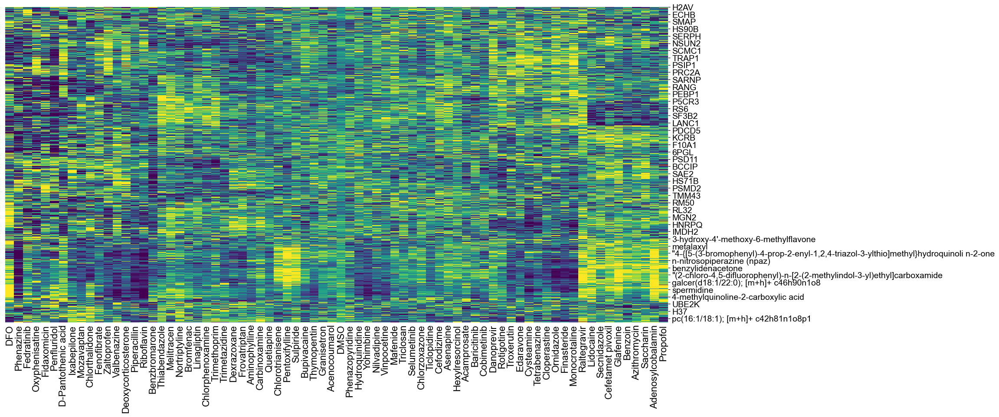

In [110]:
plot_clusterheatmap(dfheatmap = input_multi_df,low=-1.5, high=1.5)

# Correlation analysis

In [32]:
corr_pearson   = input_multi_df.corr(method='pearson')
corr_spearman  = input_multi_df.corr(method='spearman')   # apply spearman-corr can reduce the outliers's affect
cosine_similar = cal_cosine_simi(df = input_multi_df )

In [31]:
corr_pearson_mole   = input_mole_df.corr(method='pearson')
# corr_spearman_mole  = input_mole_df.corr(method='spearman')
# cosine_similar_mole = cal_cosine_simi(df = input_mole_df )

In [32]:
def plot_boxplot_corr_R(df = corr_pearson, title_name = 'spearman_R_layout_dysregulation_without_log2'):
    plt.style.use('ggplot')
    # 创建箱线图
    plt.figure(figsize=(12, 3.5))
    df.boxplot()
    # 添加标题和
    plt.xticks(rotation = 90)
    plt.ylabel('corr_R')
    plt.title(title_name)
    plt.show()

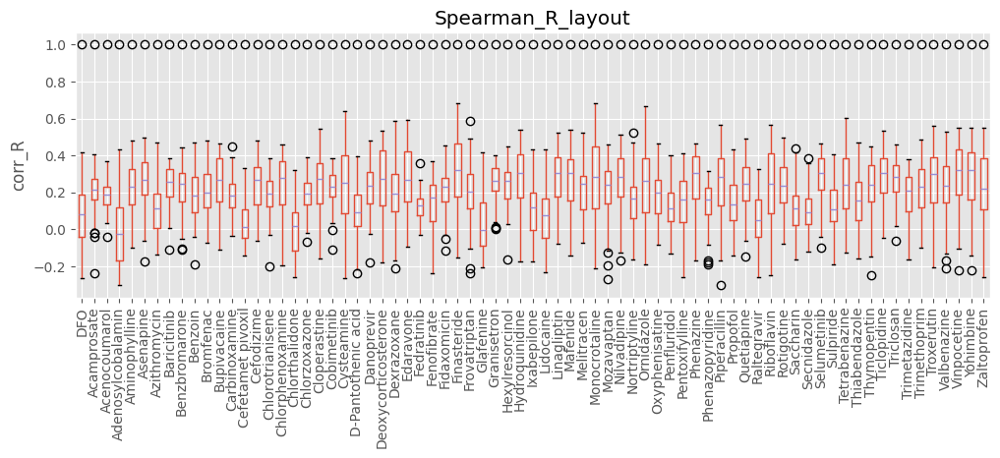

In [33]:
plot_boxplot_corr_R(df = corr_spearman, title_name = 'Spearman_R_layout')

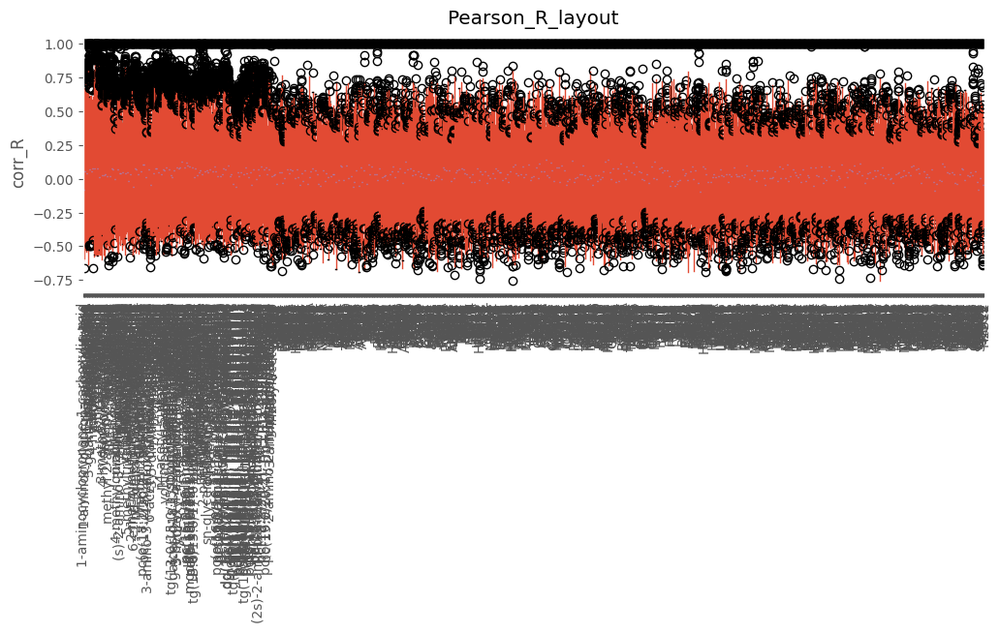

In [30]:
plot_boxplot_corr_R(df = corr_pearson_mole, title_name = 'Pearson_R_layout')

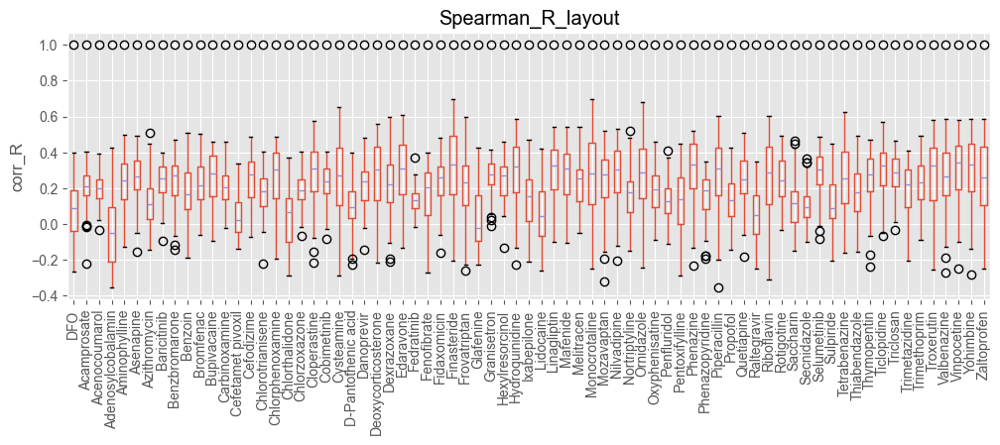

In [169]:
plot_boxplot_corr_R(df = corr_spearman_mole, title_name = 'Spearman_R_layout')

In [390]:
def plot_corr_clustered_heatmap(plot_df = updown_multi.corr(method='pearson'),title_name = "correlation of drugs_pearson"):
    
    ax = sns.clustermap(plot_df, cmap='coolwarm', fmt='.2f', figsize=(12,12),
                            row_cluster=True,  # Enable row clustering
                            col_cluster=True,  # Enable column clustering
                            xticklabels=True, yticklabels=True,
                            dendrogram_ratio=(.08, .08),
                            cbar_pos=(-0.05, 0.88, 0.05, 0.1))      
    ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(),fontsize=10)
    ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xticklabels(), fontsize=10)
    # ax.ax_heatmap.tick_params(axis='both', which='both', length=0)
    # plt.tight_layout() 
    # plt.savefig(f'{figure_save_path}/correlation_drugs_multiomic.svg', dpi=800, bbox_inches='tight')
    plt.title(title_name)
    plt.show()
    
def plot_corr_clustered_heatmap2(plot_df = updown_multi.corr(method='pearson')):
    # Set font family
    plt.rcParams['font.family'] = 'Arial'
    ax = sns.clustermap(plot_df, cmap='coolwarm', fmt='.2f', figsize=(12,12),
                            row_cluster=True,  # Enable row clustering
                            col_cluster=True,  # Enable column clustering
                            xticklabels=False, yticklabels=False,
                            dendrogram_ratio=(.07, .07),
                            tree_kws={'linewidths': 0.5},  # Make dendrogram lines invisible
                            # cbar_kws={
                            #         'orientation': 'vertical',  # 'horizontal' or 'vertical'
                            #         'aspect': 100,  # Adjusts the length-to-width ratio of the color bar
                            #         'pad': 0.1,  # Padding between the heatmap and the color bar
                            #         'label': 'Color Scale'  # Label for the color bar
                            #     },
                            cbar_pos=(-0.1, 0.88, 0.05, 0.1)  # (left, bottom, width, height)
                       )      
    ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(),fontsize=10)
    ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xticklabels(), fontsize=10)
    # ax.ax_heatmap.tick_params(axis='both', which='both', length=0)
    # plt.tight_layout() 
    # plt.savefig(f'{figure_save_path}/correlation_drugs_multiomic.svg', dpi=800, bbox_inches='tight')
    # plt.title(title_name)
    plt.show()

In [313]:
# plot_corr_clustered_heatmap(plot_df = corr_spearman,title_name = "correlation of drugs_spearman")

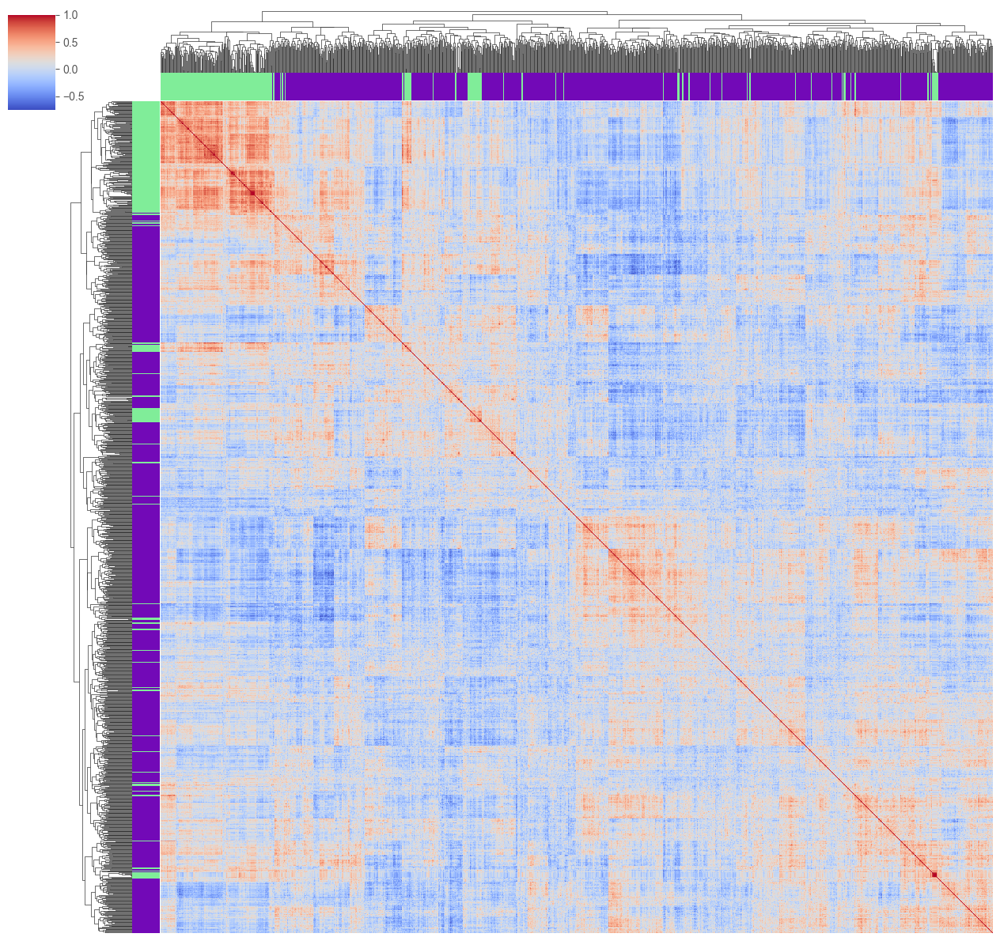

In [141]:

list_name_types = ['yes'] * mean_meta.shape[0] + ['no'] * mean_pro.shape[0]
color_dict = {"yes": '#80ed99', "no": '#7209b7'} 
row_colors = pd.Series(list_name_types).map(color_dict).tolist()
column_colors = pd.Series(list_name_types).map(color_dict).tolist()

plot_df = corr_pearson_mole

row_colors_transposed = dict(zip(plot_df.index, row_colors))
column_colors_transposed = dict(zip(plot_df.T.index, column_colors))
plt.rcParams['font.family'] = 'Arial'
ax = sns.clustermap(plot_df, cmap='coolwarm', fmt='.2f', figsize=(12,12),
                    row_cluster=True,  # Enable row clustering
                    col_cluster=True,  # Enable column clustering
                    xticklabels=False, yticklabels=False,
                    col_colors=plot_df.T.index.map(column_colors_transposed),
                    row_colors= plot_df.index.map(row_colors_transposed),
                    dendrogram_ratio=(.07, .07),
                    tree_kws={'linewidths': 0.5},  # Make dendrogram lines invisible
                            # cbar_kws={
                            #         'orientation': 'vertical',  # 'horizontal' or 'vertical'
                            #         'aspect': 100,  # Adjusts the length-to-width ratio of the color bar
                            #         'pad': 0.1,  # Padding between the heatmap and the color bar
                            #         'label': 'Color Scale'  # Label for the color bar
                            #     },
                    cbar_pos=(-0.05, 0.88, 0.05, 0.1)  # (left, bottom, width, height)
                       )      
ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(),fontsize=10)
ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xticklabels(), fontsize=10)
    # ax.ax_heatmap.tick_params(axis='both', which='both', length=0)
    # plt.tight_layout() 
    # plt.savefig(f'{figure_save_path}/correlation_drugs_multiomic.svg', dpi=800, bbox_inches='tight')
    # plt.title(title_name)
plt.show()

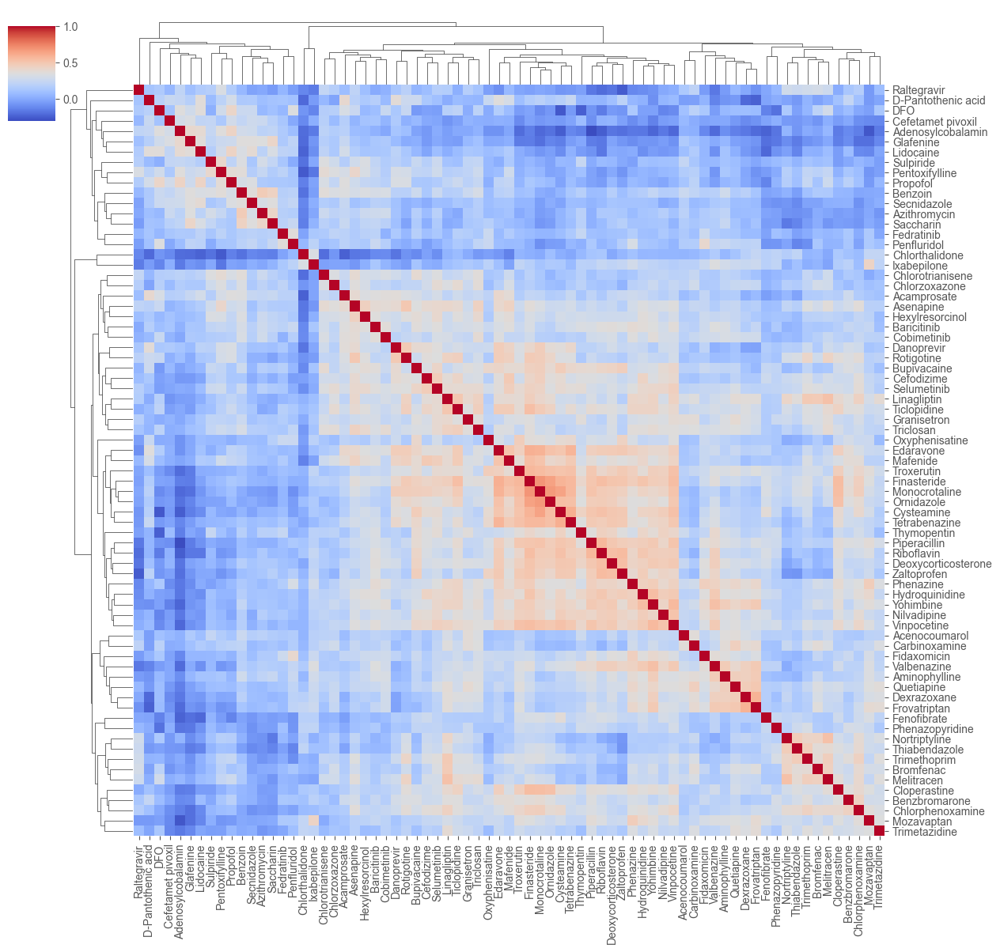

In [438]:
plot_corr_clustered_heatmap(plot_df = corr_spearman,title_name = " ")

In [172]:
# plot_corr_clustered_heatmap(plot_df = corr_pearson,title_name = "correlation of drugs_pearson")

In [173]:
# multi_hm_df = DatasetNormalizeDf.standardscaler(heatmap_multi.T)
# multi_hm_df.T 

In [174]:
# meta = heatmap_meta
# pro = heatmap_pro
# meta.columns = [str(item) for item in range(meta.shape[1])]

# dual = pd.concat([meta,pro], axis=1)

# list_name =  ['no'] * meta.shape[1]+['yes']* pro.shape[1]

# plot network

In [119]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

In [149]:
# plot joint-plot to check the correlation of selected two drugs 
def plot_jointplot(drug1 = 'DFO', drug2 ='Acamprosate', df = input_multi_df.T): 
    x_value = df[drug1]
    y_value = df[drug2]
    corre1, p_value1 = pearsonr(x_value, y_value)
    corre2, p_value2 = spearmanr(x_value, y_value)
    g0 = sns.jointplot( x = x_value, y = y_value,
                    # xlim = (13,26), ylim = (13,26),
                        kind="reg", 
                    # truncate=False,
                        color="purple", height=6)
    g0.ax_joint.grid(True)
    g0.fig.set_size_inches(5.3, 5) 
    g0.ax_joint.tick_params(labelsize=22)
    g0.set_axis_labels(drug1, drug2, fontsize=24)
    print(f"Spearman correlation: {corre2}, p-value: {p_value2}\n",
          f"Pearman correlation: {corre1}, p-value: {p_value1}")
    plt.savefig(f'{figure_save_path}/{drug1+drug2}.svg',bbox_inches='tight',dpi = 1000)
    plt.show()

In [121]:
# cor_matrix_df = corr_df.loc[selected_drugs,selected_drugs]

In [122]:
def plot_network_drugs(cor_matrix_df = corr_pearson, 
                       threshold_pos = 0.5, 
                       threshold_neg = -0.5,
                       title_name = "corr_network_drugs",fig_size=(15, 15)): 
    # # filter low corr
    # cor_matrix_filtered = cor_matrix_df.where(abs(cor_matrix_df) >= threshold)
    # Step 1: Filter correlations based on threshold
    cor_matrix_filtered = cor_matrix_df.where((cor_matrix_df >= threshold_pos) | (cor_matrix_df <= threshold_neg))
    # remove self-correlated
    np.fill_diagonal(cor_matrix_filtered.values, 0)
    
    # Step 3: create edge list
    cor_df = cor_matrix_filtered.stack().reset_index()
    cor_df.columns = ['from', 'to', 'correlation']
    # 过滤掉相关性为0的边
    cor_df = cor_df[cor_df['correlation'] != 0]
    # 如果相关矩阵对称，只保留一半的边
    cor_df = cor_df[cor_df['from'] < cor_df['to']]
    
    # 查看边列表（可选）
    # print(cor_df.head())
    # Step 4: create network
    G = nx.from_pandas_edgelist(cor_df, 'from', 'to', edge_attr='correlation')
    
    # Step 5: visualize 
    # define layout
    plt.figure(figsize=fig_size)  # Use the fig_size parameter
    pos = nx.spring_layout(G, k=0.1, iterations=30, seed=42)  
    # define color and width 
    edges = G.edges(data=True)
    edge_colors = []
    edge_widths = []
    for u, v, data in edges:
        corr = data['correlation']
        if corr > 0:
            edge_colors.append('purple')  # 正相关为紫色
        else:
            edge_colors.append('red')    # 负相关为灰色
        # 根据相关性的绝对值调整边宽度，乘以一个因子以增强可视化效果
        edge_widths.append(abs(corr)*15)
    
    nx.draw_networkx_nodes(G, pos,
                           node_size=1600,
                           node_color='lightblue',
                           edgecolors='black',
                           linewidths=0.9)
    nx.draw_networkx_edges(G, pos,
                           edge_color=edge_colors,
                           width=edge_widths,
                           alpha=0.7)
    nx.draw_networkx_labels(G, pos,
                            font_size=16,
                            font_family='Arial')
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='purple', lw=2, label='positive_corr'),
        Line2D([0], [0], color='red', lw=2, label='negative_corr')
    ]
    # plt.legend(handles=legend_elements, loc='upper right')
    
    plt.title(title_name, fontsize=20)
    # remove x axis and y axis
    plt.axis('off')
    plt.tight_layout()
    # plt.subplots_adjust(left=0.1, right=0.9, top=0.8, bottom=0.1)
    # plt.tight_layout()
    plt.show()

In [124]:
# make a dataframe of edges for cytoscape visualization 

# cor_matrix_df = corr_pearson.copy()
cor_matrix_df = corr_pearson.copy()
# Step 1: Filter correlcorr_pearson_moleations based on threshold
threshold_pos = 0.3
threshold_neg = -0.3
cor_matrix_filtered = cor_matrix_df.where((cor_matrix_df >= threshold_pos) | (cor_matrix_df <= threshold_neg))
# remove self-correlated
np.fill_diagonal(cor_matrix_filtered.values, 0)

# Step 3: create edge list
cor_df = cor_matrix_filtered.stack().reset_index()
cor_df.columns = ['source', 'target', 'correlation']
# 过滤掉相关性为0的边
cor_df = cor_df[cor_df['correlation'] != 0]
# 如果相关矩阵对称，只保留一半的边
cor_df = cor_df[cor_df['source'] < cor_df['target']]
# cor_df.to_csv(f'{file_save_path}\edges_molecules.csv')

In [125]:
plot_network_drugs(cor_matrix_df = corr_pearson_mole, 
                       threshold_pos = 0.85, 
                       threshold_neg = -0.99,
                       title_name = "corr_network_drugs",fig_size=(15, 15))

NameError: name 'corr_pearson_mole' is not defined

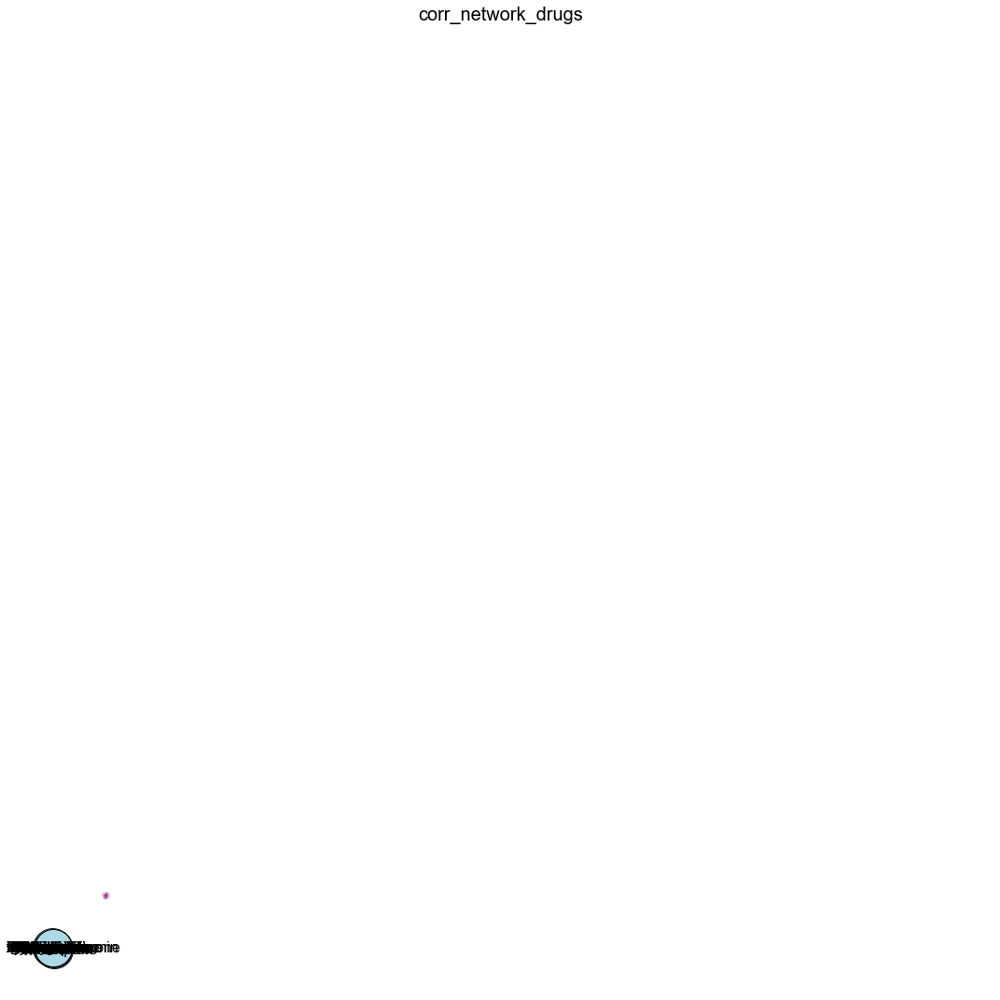

In [126]:
plot_network_drugs(cor_matrix_df = corr_spearman, 
                       threshold_pos = 0.5, 
                       threshold_neg = -0.3,
                       title_name = "corr_network_drugs",fig_size=(15, 15))

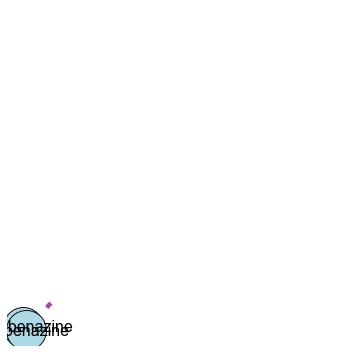

In [127]:
# selected_drugs = cluster4.index

selected_drugs = ['Valbenazine','Tetrabenazine']   # tinibs 

# selected_drugs = ['Valbenazine','Tetrabenazine','Asenapine','Rotigotine','Quetiapine','Sulpiride','Penfluridol','Nortriptyline','Melitracen']  # 神经系统药物
# selected_drugs = ['Piperacillin','Cefodizime','Fidaxomicin','Ornidazole','Secnidazole','Trimethoprim','Triclosan']
# selected_drugs = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib','Valbenazine','Tetrabenazine'] #相似pathways
# selected_drugs = ['Ornidazole', 'Secnidazole', 'Piperacillin', 'Cefetamet pivoxil', 'Fidaxomicin', 'Trimethoprim']  # 抗菌抗感染药物
# selected_drugs = ['Azithromycin', 'Bromfenac', 'Zaltoprofen']
# selected_drugs = ['Ornidazole', 'Secnidazole']
# selected_drugs = ['Cobimetinib', 'Selumetinib']   # tinibs 
# selected_drugs = ['Chlorthalidone','Hydroquinidine','Nilvadipine','Pentoxifylline','Vinpocetine']  # 心血管系统药物 cardiovascular system 
# selected_drugs = ['Lidocaine','Bupivacaine']
# selected_drugs = ['Fenofibrate','Linagliptin','Trimetazidine']
# selected_drugs = ['Edaravone', 'Troxerutin','Dexrazoxane']   
# selected_drugs = ['Azithromycin','Piperacillin','Cefetamet pivoxil','Cefodizime','Fidaxomicin','Ornidazole','Secnidazole','Trimethoprim','Triclosan',]
# selected_drugs = ['Cefodizime','Fidaxomicin','Triclosan']   # antiviral
# selected_drugs = list(set(high_p_values['Drug 1']))
selected_cor_matrix_df = corr_pearson.loc[selected_drugs,selected_drugs]
plot_network_drugs(cor_matrix_df = selected_cor_matrix_df, 
                   threshold_pos = 0.3,
                   threshold_neg = -0.2,
                   title_name = " ", 
                   fig_size=(5, 5))

In [69]:
corr_pearson_mole.iloc[269:,:269].stack().nlargest(40)  

RS27A  2-hydroxycinnamic acid                      0.678599
       isoquinolone                                0.673724
1433B  isoquinolone                                0.673178
ACADM  tg(16:0/16:0/18:0); [m+nh4]+ c53h106n1o6    0.671578
1433B  6-quinolinol                                0.671517
       2-hydroxyquinoline                          0.668232
       8-hydroxyquinoline                          0.668232
RS27A  chromone                                    0.666564
SRRM2  tg(13:0/15:0/15:0); [m+nh4]+ c46h92n1o6     0.666077
1433B  4-hydroxyquinoline                          0.659643
       spermidine                                  0.658378
VDAC1  isoquinolone                                0.654100
1433B  3-formylindole                              0.652248
RS27A  1-amino-1-cyclopentanecarboxylic acid       0.648498
       pipecolic acid                              0.647474
VDAC1  2-hydroxycinnamic acid                      0.646141
SRRM2  tg(16:0/16:0/18:0); [m+nh4]+ c53h

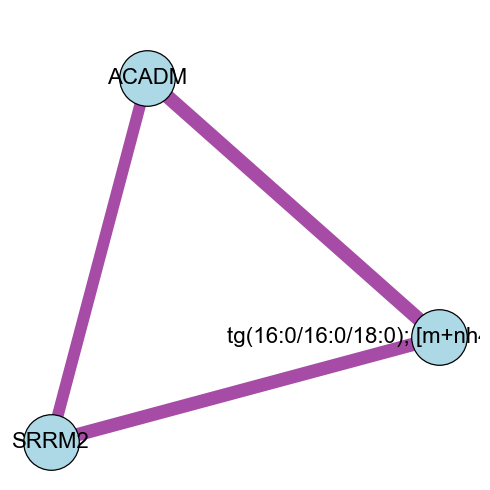

In [72]:
#  plot molecule cluster

# selected_molecules = ['TBB3','TBB5','TBB2B','TBB4B']
selected_molecules = ['ACADM' , 'tg(16:0/16:0/18:0); [m+nh4]+ c53h106n1o6','SRRM2',]
# selected_molecules = ['VDAC1',  'spermidine' ]
selected_mol_cor_matrix_df = corr_pearson_mole.loc[selected_molecules,selected_molecules]
plot_network_drugs(cor_matrix_df = selected_mol_cor_matrix_df, 
                   threshold_pos = 0.5,
                   threshold_neg = -0.5,
                   title_name = " ", 
                   fig_size=(5, 5))



Spearman correlation: 0.6125509070714552, p-value: 8.444549349834695e-09
 Pearman correlation: 0.6715777448225259, p-value: 7.85354678861273e-11


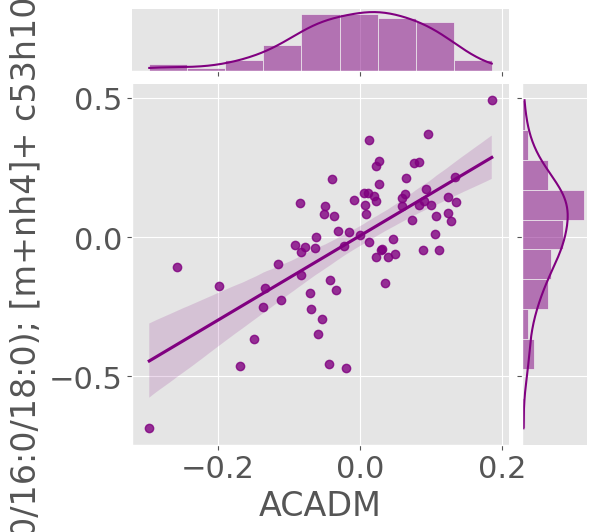

In [73]:
plot_jointplot(drug1 = 'ACADM', drug2 = 'tg(16:0/16:0/18:0); [m+nh4]+ c53h106n1o6', df = input_multi_df.T)

In [203]:
# input_multi_df[input_multi_df.index.str.contains("AT")]

In [46]:
def select_by_index(df, index_name = None):
    """
    Input a DataFrame and select a subset by index names.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    index_name (str): The string to filter index names by.

    Returns:
    pd.DataFrame: A DataFrame containing rows where the index contains the specified name.
    """
    return df[df.index.str.contains(index_name)]
def select_by_columns(df, column_contains = None):
    """
    Input a DataFrame and select columns based on partial or exact matches.
    Parameters:
    df (pd.DataFrame): The input DataFrame.
    column_contains (str, optional): Substring to match in column names.
    Returns:
    pd.DataFrame: A DataFrame containing only the selected columns.
    """
    if column_contains:
        # Select columns containing the substring
        matching_columns = [col for col in df.columns if column_contains in col]
    if not matching_columns:
        raise ValueError("No matching columns found in the DataFrame.")
    return df[matching_columns]

In [205]:
zscore_input_multi_df = input_multi_df.apply(zscore, axis=1)

In [206]:
zscore_input_multi_df

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
1-aminocyclopropane-1-carboxylic acid,-0.185275,0.541765,-0.317619,-0.109681,0.416501,-0.169224,-1.601199,0.677131,0.444975,-0.923858,...,0.479197,0.082330,0.151766,-0.288580,-0.995299,0.514677,-0.741335,0.915235,-0.734582,2.332759
1-aminocyclopropanecarboxylate,-0.597580,-0.205409,0.313341,-2.168973,0.001604,0.453962,1.360434,0.641810,-0.041209,-0.004712,...,0.848005,-0.132718,-0.125104,-1.277404,-0.999637,-0.298498,0.559162,0.134232,0.361004,1.526674
proline,2.434702,-0.089368,0.542968,1.782994,-0.264688,1.445119,0.123602,0.787662,0.016438,0.187183,...,-0.205481,1.124511,0.965012,-0.829263,0.426534,-0.880105,-0.005746,-0.117919,-1.239069,-0.626974
indoline,3.413920,-0.232442,-0.131512,2.305716,-0.738466,-0.004199,-0.370144,-0.509378,0.976127,0.186908,...,-1.452909,0.204908,-0.259048,0.260980,0.773127,-1.069110,-1.702078,-1.114806,-1.627207,-1.002013
"2,6-xylidine",2.926784,0.382954,0.707862,1.833260,0.287639,0.574116,0.026066,-1.591914,0.233150,1.371745,...,-1.266089,-0.827649,0.283208,-0.220003,-0.934405,-0.592019,-1.541932,-0.475405,-1.599260,-1.171594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,-0.107324,0.929548,-0.488875,1.147960,-1.053930,1.231274,0.496767,0.008340,-1.454975,1.062566,...,-1.089837,0.936067,1.265857,0.450938,-0.103520,-0.350358,-0.490608,0.168793,0.624128,-0.099580
SRSF6,-1.638499,-0.522860,0.191477,0.266848,-0.938271,0.548526,1.328030,0.472676,0.215757,0.573594,...,-0.454467,-0.344939,0.285626,1.291825,1.054418,-2.203247,0.180811,0.690643,0.732180,-1.203686
SEP11,-0.524708,-0.320646,-1.282343,0.345714,-0.998282,0.507850,1.582535,0.230156,-0.388512,0.750044,...,0.543941,0.297305,-0.921714,-1.444793,0.263164,-1.055435,-1.533823,-0.188467,-2.013059,-1.215731
HBG2,0.949606,1.422622,-0.619167,-0.398071,-1.000987,-0.619452,1.059922,0.792797,0.530567,-0.339098,...,0.330237,-0.706318,-1.222986,-0.778433,-2.394797,-1.068495,0.404024,-1.084128,-0.336814,1.259914


In [207]:
ff = zscore_input_multi_df.loc[:, selected_drugs]
ff[ff.index.str.contains("CDK|HSP|MAP")]

,Cobimetinib,Selumetinib,Baricitinib,Fedratinib
SMAP,-0.324694,0.318850,-0.385145,-0.561644
CDK1,-1.205467,-0.856034,-0.997609,2.646200
HSP7C,-0.112274,-0.175136,0.299604,-0.916461
MAP4,0.545182,1.510848,0.154177,0.772866
HSP74,0.143218,-0.918171,1.665096,0.713454
MAP2,-1.926547,1.349149,-1.465695,-1.857580
CHSP1,-0.638900,0.889653,-1.123505,2.097294


In [253]:

from adjustText import adjust_text
def plot_scatter_genes(ef = ff.T , gene1 = 'CDK1' , gene2 = 'HSP74'):
    fig = plt.figure(figsize=(5.3, 5))
    sns.scatterplot(data=ef, x=gene1, y=gene2, s=150)
    # Label each point with the index
    texts = []
    for i in range(len(ef)):
        text = plt.text(x=ef[gene1].iloc[i], 
                        y=ef[gene2].iloc[i], 
                        s=ef.index[i],  # Use the index as label
                        fontsize=16)
        texts.append(text)
    
    # Adjust text to avoid overlap
    adjust_text(texts, 
                arrowprops=dict(arrowstyle="->", color='gray', lw=0.5))
    plt.xlim(-3, 3)  
    plt.ylim(-3, 3)
    plt.xlabel(gene1, fontsize = 22)
    plt.ylabel(gene2, fontsize = 22)
    plt.xticks(fontsize=20,  fontfamily='Arial')  # Adjust as needed
    plt.yticks(fontsize=20,  fontfamily='Arial')  # Adjust as needed
    plt.show()

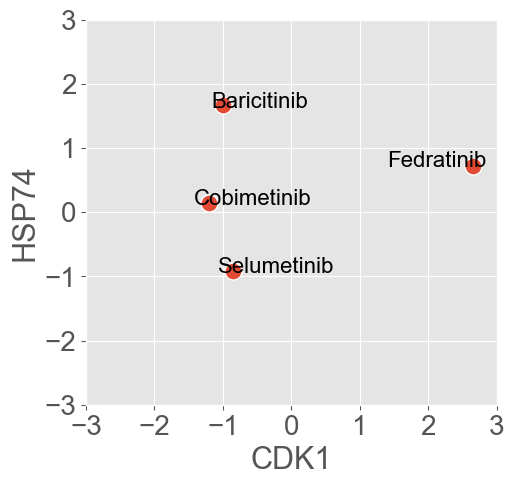

In [254]:
plot_scatter_genes(ef = ff.T , gene1 = 'CDK1' , gene2 = 'HSP74')

In [469]:
# list(set(high_p_values['Drug 1']))

In [279]:
# plot_network_drugs(cor_matrix_df = corr_spearman, threshold = 0.5,title_name = "spearman_corr_network_drugs")

In [153]:

# plot_jointplot(drug1 = 'Asenapine', drug2 = 'Rotigotine', df = input_multi_df.T)

Spearman correlation: 0.33938692122012243, p-value: 6.726566215995172e-36
 Pearman correlation: 0.5257429539379999, p-value: 5.941845808249198e-92


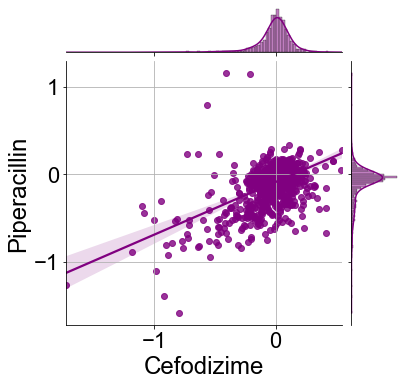

In [241]:
plot_jointplot(drug1 = "Cefodizime", drug2 ="Piperacillin", df = input_multi_df)

Spearman correlation: 0.4805496601993352, p-value: 5.513977770266687e-75
 Pearman correlation: 0.5656522979296296, p-value: 3.1616152418735163e-109


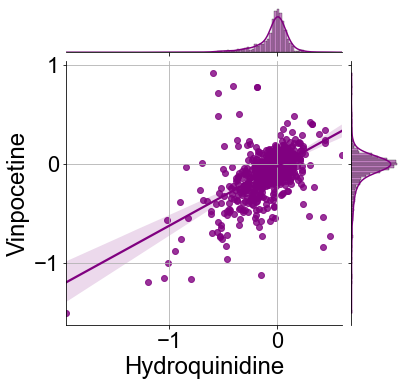

In [242]:
plot_jointplot(drug1 = 'Hydroquinidine', drug2 ='Vinpocetine', df = input_multi_df)

Spearman correlation: 0.4619555122527109, p-value: 1.0380126217754361e-68
 Pearman correlation: 0.6155912755515324, p-value: 1.827433663333078e-134


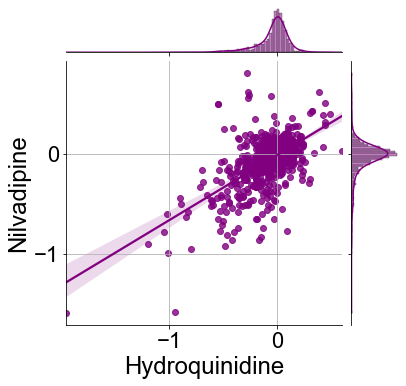

In [175]:
plot_jointplot(drug1 = 'Hydroquinidine', drug2 ='Nilvadipine', df = input_multi_df)

Spearman correlation: 0.5123579157877937, p-value: 1.1687169236187139e-86
 Pearman correlation: 0.625952621653208, p-value: 2.7632340147865943e-140


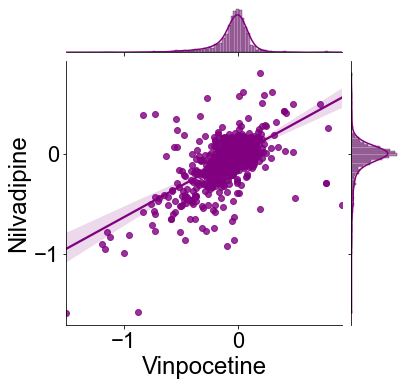

In [128]:
plot_jointplot(drug1 = 'Vinpocetine', drug2 ='Nilvadipine', df = input_multi_df)

Spearman correlation: 0.12598097922111107, p-value: 6.107860811072393e-06
 Pearman correlation: 0.06679887392827227, p-value: 0.016796167082530154


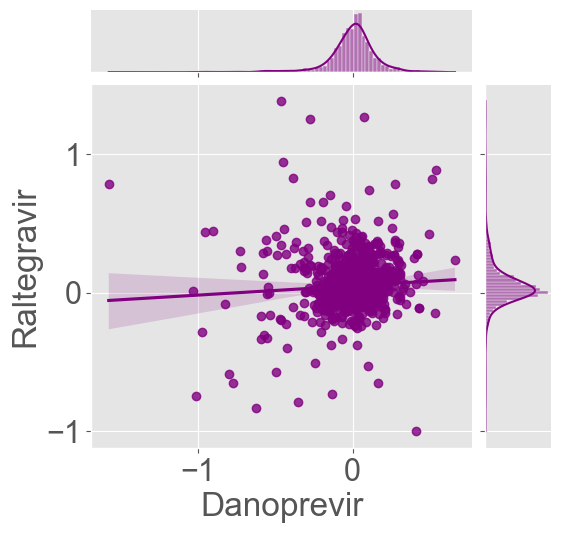

In [470]:
plot_jointplot(drug1 = 'Danoprevir', drug2 ='Raltegravir', df = input_multi_df)

Spearman correlation: 0.060250625726856834, p-value: 0.031061207420816358
 Pearman correlation: 0.19068059833654824, p-value: 5.933888677977083e-12


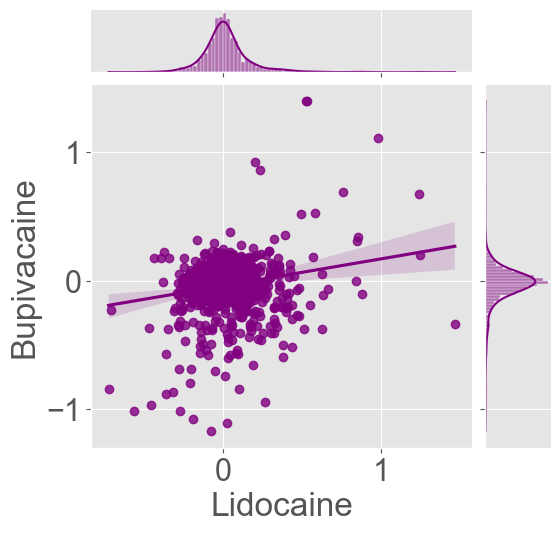

In [471]:
plot_jointplot(drug1 = 'Lidocaine', drug2 ='Bupivacaine', df = input_multi_df)

Spearman correlation: 0.47045197245152887, p-value: 1.5740159782115732e-71
 Pearman correlation: 0.5849105537148325, p-value: 1.9290121677113952e-118


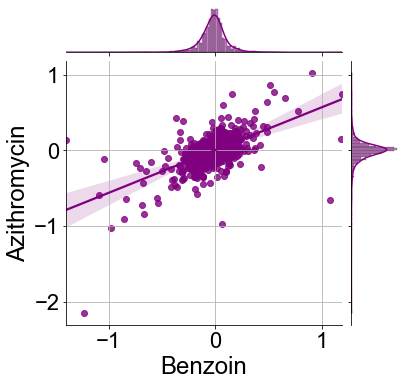

In [183]:
plot_jointplot(drug1 = 'Benzoin', drug2 ='Azithromycin', df = input_multi_df)

In [222]:
# plot_jointplot(drug1 = 'Benzoin', drug2 ='Azithromycin', df = DatasetNormalizeDf.standardscaler(heatmap_meta.T).T)

Spearman correlation: 0.5999141837017464, p-value: 1.1008215817392257e-27
 Pearman correlation: 0.5199174730442497, p-value: 4.9743039989424624e-20


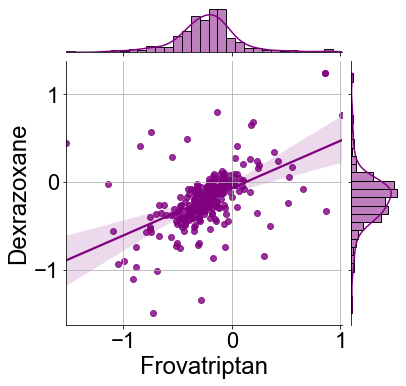

In [182]:
plot_jointplot(drug1 = 'Frovatriptan', drug2 ='Dexrazoxane', df = log_meta_updown)

Spearman correlation: 0.32805361700666, p-value: 1.6090874451744985e-33
 Pearman correlation: 0.40941034392567893, p-value: 6.044187146074016e-53


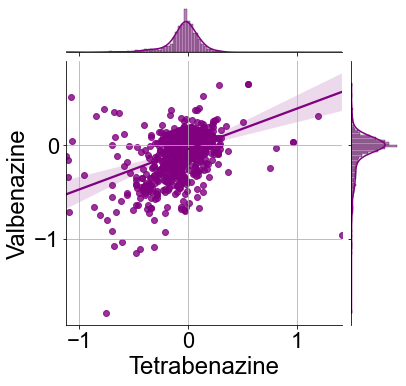

In [176]:
plot_jointplot(drug1 = 'Tetrabenazine', drug2 ='Valbenazine', df = input_multi_df)     # 结构相似

Spearman correlation: 0.20315066956622033, p-value: 2.127122607319616e-13
 Pearman correlation: 0.32150841318908635, p-value: 3.4295975312393644e-32


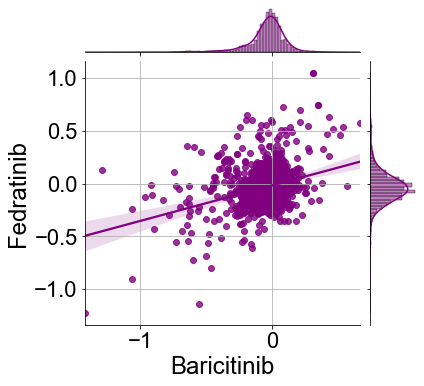

In [177]:
plot_jointplot(drug1 = 'Baricitinib', drug2 ='Fedratinib', df = input_multi_df)

# 'Baricitinib'

Spearman correlation: 0.36635207016065563, p-value: 5.7077510229032696e-42
 Pearman correlation: 0.42898455488794396, p-value: 1.701765826745737e-58


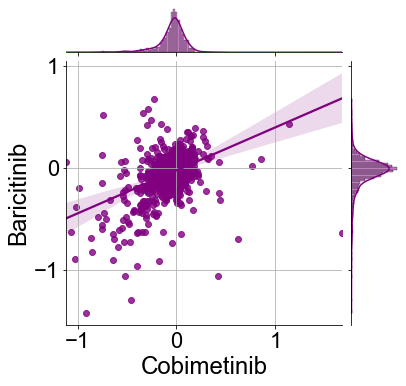

In [187]:
plot_jointplot(drug1 = 'Cobimetinib', drug2 ='Baricitinib', df = input_multi_df)

Spearman correlation: 0.3155097230898076, p-value: 5.301799835173907e-31
 Pearman correlation: 0.3679924880884118, p-value: 2.33264980560464e-42


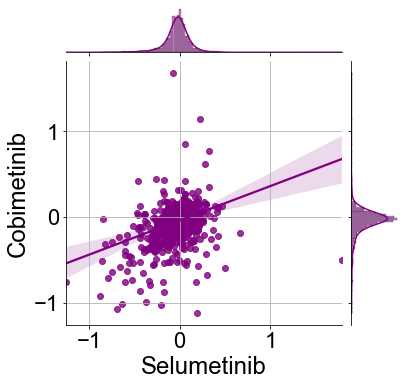

In [185]:
plot_jointplot(drug1 = 'Selumetinib', drug2 ='Cobimetinib', df = input_multi_df)

Spearman correlation: 0.012402008044876709, p-value: 0.6574296186836259
 Pearman correlation: 0.07871278625611343, p-value: 0.004819780939567811


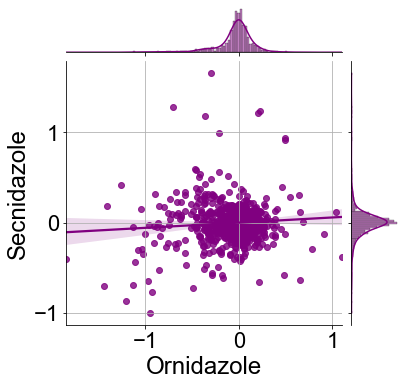

In [186]:
plot_jointplot(drug1 = 'Ornidazole', drug2 ='Secnidazole', df = input_multi_df)

Spearman correlation: 0.12598097922111107, p-value: 6.107860811072393e-06
 Pearman correlation: 0.06679887397429436, p-value: 0.01679616700699247


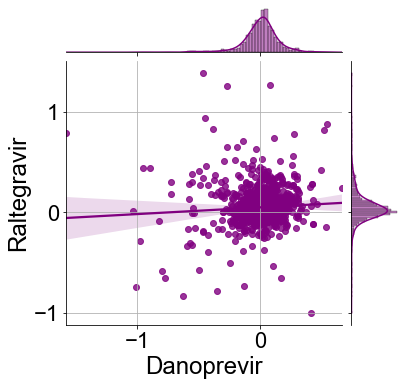

In [180]:
plot_jointplot(drug1 = 'Danoprevir', drug2 ='Raltegravir', df = input_multi_df)

Spearman correlation: 0.22909106849743488, p-value: 1.023219284021557e-16
 Pearman correlation: 0.2228005117101717, p-value: 7.139869773516014e-16


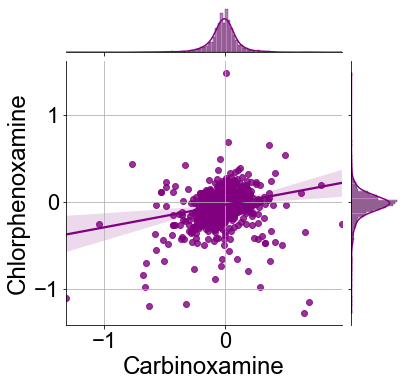

In [181]:
plot_jointplot(drug1 = 'Carbinoxamine', drug2 ='Chlorphenoxamine', df = input_multi_df)

In [225]:
# plot_jointplot(drug1 = 'Frovatriptan', drug2 ='Dexrazoxane', df = DatasetNormalizeDf.standardscaler(heatmap_pro.T).T)

In [358]:
# plot_clusterheatmap(multi_hm_df , low=-2, high=2)

In [ ]:
# 蛋白组学和代谢组学的差异分析

# calculate drugs similarity according to their structures 

In [35]:
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.DataStructs import FingerprintSimilarity
from rdkit.ML.Cluster import Butina
from rdkit.Chem import rdMolDescriptors
from rdkit import DataStructs
import pubchempy as pcp

In [36]:
drugnames = input_multi_df.columns.to_list()
drugnames[0] = 'Deferoxamine'
len(drugnames)

73

In [37]:
drug_names = drugnames
# Function to get SMILES from drug names
def get_smiles_from_names(drug_names):
    smiles_dict = {}
    for name in drug_names:
        try:
            compounds = pcp.get_compounds(name, 'name')
            if compounds:  # Check if any compounds were found
                smiles = compounds[0].to_dict(properties=['canonical_smiles'])['canonical_smiles']
                smiles_dict[name] = smiles
            else:
                print(f"No compounds found for {name}")
        except Exception as e:
            print(f"Could not find SMILES for {name}: {e}")
    return smiles_dict

# Get SMILES for the drugs
drugs_smiles = get_smiles_from_names(drug_names)

# Check retrieved SMILES
print("Retrieved SMILES:")
print(drugs_smiles)

# Convert SMILES to RDKit Mol objects if SMILES were found
drugs_mols = {name: Chem.MolFromSmiles(smiles) for name, smiles in drugs_smiles.items() if smiles}

# Generate fingerprints for each drug using MorganGenerator
fingerprints = {}
for name, mol in drugs_mols.items():
    if mol:  # Ensure the molecule was created successfully
        generator = rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2)
        fingerprints[name] = generator

# Calculate the Tanimoto similarity
similarity_matrix = pd.DataFrame(index=drugs_smiles.keys(), columns=drugs_smiles.keys())

for drug1 in drugs_smiles.keys():
    for drug2 in drugs_smiles.keys():
        if drug1 == drug2:
            similarity_matrix.loc[drug1, drug2] = 1.0  # Similarity with itself
        else:
            if drug1 in fingerprints and drug2 in fingerprints:
                similarity = DataStructs.TanimotoSimilarity(fingerprints[drug1], fingerprints[drug2])
                similarity_matrix.loc[drug1, drug2] = similarity

print("Tanimoto Similarity Matrix:")
print(similarity_matrix)

Retrieved SMILES:
{'Deferoxamine': 'CC(=O)N(CCCCCNC(=O)CCC(=O)N(CCCCCNC(=O)CCC(=O)N(CCCCCN)O)O)O', 'Acamprosate': 'CC(=O)NCCCS(=O)(=O)O', 'Acenocoumarol': 'CC(=O)CC(C1=CC=C(C=C1)[N+](=O)[O-])C2=C(C3=CC=CC=C3OC2=O)O', 'Adenosylcobalamin': 'CC1=CC2=C(C=C1C)N(C=N2)C3C(C(C(O3)CO)OP(=O)([O-])OC(C)CNC(=O)CCC4(C(C5C6(C(C(C(=N6)C(=C7C(C(C(=N7)C=C8C(C(C(=N8)C(=C4[N-]5)C)CCC(=O)N)(C)C)CCC(=O)N)(C)CC(=O)N)C)CCC(=O)N)(C)CC(=O)N)C)CC(=O)N)C)O.[CH2-]C1C(C(C(O1)N2C=NC3=C(N=CN=C32)N)O)O.[Co]', 'Aminophylline': 'CN1C2=C(C(=O)N(C1=O)C)NC=N2.CN1C2=C(C(=O)N(C1=O)C)NC=N2.C(CN)N', 'Asenapine': 'CN1CC2C(C1)C3=C(C=CC(=C3)Cl)OC4=CC=CC=C24', 'Azithromycin': 'CCC1C(C(C(N(CC(CC(C(C(C(C(C(=O)O1)C)OC2CC(C(C(O2)C)O)(C)OC)C)OC3C(C(CC(O3)C)N(C)C)O)(C)O)C)C)C)O)(C)O', 'Baricitinib': 'CCS(=O)(=O)N1CC(C1)(CC#N)N2C=C(C=N2)C3=C4C=CNC4=NC=N3', 'Benzbromarone': 'CCC1=C(C2=CC=CC=C2O1)C(=O)C3=CC(=C(C(=C3)Br)O)Br', 'Benzoin': 'C1=CC=C(C=C1)C(C(=O)C2=CC=CC=C2)O', 'Bromfenac': 'C1=CC(=C(C(=C1)C(=O)C2=CC=C(C=C2)Br)N)CC(=O)O', 'Bup

[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerator
[18:53:08] DEPRECATION WARNING: please use MorganGenerat

Tanimoto Similarity Matrix:
                  Deferoxamine Acamprosate Acenocoumarol Adenosylcobalamin  \
Deferoxamine               1.0     0.26087      0.093333          0.072727   
Acamprosate            0.26087         1.0      0.096774          0.058442   
Acenocoumarol         0.093333    0.096774           1.0          0.074713   
Adenosylcobalamin     0.072727    0.058442      0.074713               1.0   
Aminophylline         0.098361        0.06      0.084507          0.068323   
...                        ...         ...           ...               ...   
Troxerutin            0.039604     0.05814      0.138614           0.09375   
Valbenazine           0.070588    0.069444       0.10989          0.076923   
Vinpocetine           0.070588    0.069444      0.147727          0.076923   
Yohimbine             0.058824    0.070423      0.123596          0.059783   
Zaltoprofen           0.070423    0.068966      0.194444          0.064706   

                  Aminophylline Ase

In [38]:
# Stack the similarity matrix
pairs = similarity_matrix.stack()

# Create a DataFrame from the stacked Series
tanimoto_pairs_df = pairs.reset_index()
tanimoto_pairs_df.columns = ['Drug 1', 'Drug 2', 'Similarity']

# Remove self-correlation pairs
tanimoto_pairs_df = tanimoto_pairs_df[tanimoto_pairs_df['Drug 1'] != tanimoto_pairs_df['Drug 2']]

# Sort the drug names to ensure pairs are in a consistent order
tanimoto_pairs_df[['Drug 1', 'Drug 2']] = np.sort(tanimoto_pairs_df[['Drug 1', 'Drug 2']], axis=1)

# Remove duplicates
tanimoto_pairs_df = tanimoto_pairs_df.drop_duplicates()

In [39]:
def get_one_on_one_pairs_from_matrix(input_matrix = corr_pearson): 
    '''function used to make one on one pairs(2D) from a high dimention matrix(n*n)'''
    # Stack the similarity matrix
    pairs = input_matrix.stack()
    # Create a DataFrame from the stacked Series
    pairs_df = pairs.reset_index()
    pairs_df.columns = ['Drug 1', 'Drug 2', 'Similarity']
    # Remove self-correlation pairs
    pairs_df = pairs_df[pairs_df['Drug 1'] != pairs_df['Drug 2']]
    # Sort the drug names to ensure pairs are in a consistent order
    pairs_df[['Drug 1', 'Drug 2']] = np.sort(pairs_df[['Drug 1', 'Drug 2']], axis=1)
    # Remove duplicates
    pairs_df = pairs_df.drop_duplicates()
    return pairs_df

In [70]:
def plot_scatter_joint(x_value=[1, 2], y_value=[1, 2], kind = 'hex',
                       x_label='a', y_label='b',
                       xlim=(-0.4, 0.8), ylim=(-0.4, 0.8),
                       xticks=None, yticks=None,
                       save_name = "scatter_plot"):
    corre1, p_value1 = pearsonr(x_value, y_value)
    corre2, p_value2 = spearmanr(x_value, y_value)
    # Create jointplot
    gg = sns.jointplot(
        x=x_value, y=y_value,
        kind= kind, color="#a2d2ff",
        marginal_ticks = False,
        # palette = 'viridis',
        height=6)
    gg.ax_joint.set_xlim(xlim)
    gg.ax_joint.set_ylim(ylim)
    if xticks is not None:
        gg.ax_joint.set_xticks(xticks)
    if yticks is not None:
        gg.ax_joint.set_yticks(yticks)

    gg.fig.set_size_inches(6.3, 6)
    gg.ax_joint.tick_params(labelsize=22)
    gg.set_axis_labels(x_label, y_label, fontsize=22)
    print(f"Spearman correlation: {corre2}, p-value: {p_value2}\n",
          f"Pearson correlation: {corre1}, p-value: {p_value1}")
    plt.savefig(f'{figure_save_path}/{save_name}.svg', dpi=1000, bbox_inches='tight')
    plt.show()


Spearman correlation: 0.9082732173646549, p-value: 0.0
 Pearson correlation: 0.9158433125623472, p-value: 0.0


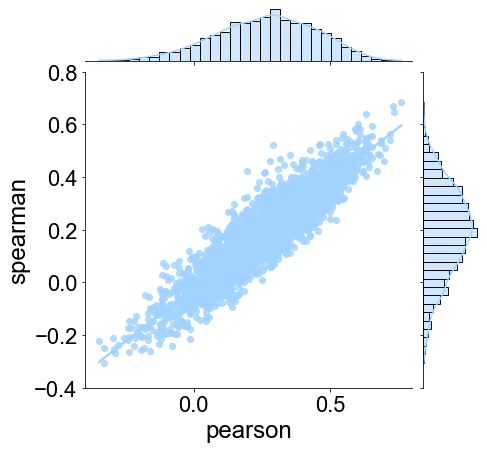

In [68]:
plot_scatter_joint(x_value=get_one_on_one_pairs_from_matrix(input_matrix = corr_pearson).Similarity, 
                   y_value=get_one_on_one_pairs_from_matrix(input_matrix = corr_spearman).Similarity, 
                   kind = 'reg',
                   x_label='pearson', y_label='spearman',
                   xlim=(-0.4, 0.8), ylim=(-0.4, 0.8),
                   xticks=None, yticks=None,
                   save_name = "scatter_plot_spearman_pearson")

In [43]:
get_one_on_one_pairs_from_matrix(input_matrix = corr_pearson).sort_values(by='Similarity',ascending=False).iloc[:26,:]

,Drug 1,Drug 2,Similarity
2231,Finasteride,Monocrotaline,0.760611
2235,Finasteride,Ornidazole,0.734138
3038,Monocrotaline,Ornidazole,0.731483
2626,Hydroquinidine,Yohimbine,0.719753
3778,Piperacillin,Riboflavin,0.718296
3793,Piperacillin,Vinpocetine,0.701618
4086,Riboflavin,Yohimbine,0.695242
2254,Finasteride,Ticlopidine,0.687427
2245,Finasteride,Riboflavin,0.686988
5108,Valbenazine,Yohimbine,0.686284


In [743]:
# get_one_on_one_pairs_from_matrix(input_matrix = corr_spearman).sort_values(by='Similarity',ascending=False).iloc[:20,:]

In [44]:
tanimoto_pairs_df = get_one_on_one_pairs_from_matrix(input_matrix = similarity_matrix)

In [45]:
# get_one_on_one_pairs_from_matrix(input_matrix = corr_pearson)

In [46]:
corr_drugpairs_pro = get_one_on_one_pairs_from_matrix(input_matrix = log_pro_updown.corr(method='pearson'))
corr_drugpairs_meta = get_one_on_one_pairs_from_matrix(input_matrix = log_meta_updown.corr(method='pearson'))

In [47]:
corr_drugpairs_pro 

,Drug 1,Drug 2,Similarity
1,Acamprosate,DFO,0.382276
2,Acenocoumarol,DFO,0.196038
3,Adenosylcobalamin,DFO,0.312836
4,Aminophylline,DFO,0.295275
5,Asenapine,DFO,0.289247
...,...,...,...
5108,Valbenazine,Yohimbine,0.350685
5109,Valbenazine,Zaltoprofen,0.144776
5181,Vinpocetine,Yohimbine,0.340290
5182,Vinpocetine,Zaltoprofen,0.234568


In [48]:
tanimoto_pairs_df['proteome_corr']  = corr_drugpairs_pro.Similarity
tanimoto_pairs_df['metabolome_corr'] = corr_drugpairs_meta.Similarity
tanimoto_pairs_df

,Drug 1,Drug 2,Similarity,proteome_corr,metabolome_corr
1,Acamprosate,Deferoxamine,0.26087,0.382276,0.366980
2,Acenocoumarol,Deferoxamine,0.093333,0.196038,0.134233
3,Adenosylcobalamin,Deferoxamine,0.072727,0.312836,0.393826
4,Aminophylline,Deferoxamine,0.098361,0.295275,-0.190417
5,Asenapine,Deferoxamine,0.014493,0.289247,0.451176
...,...,...,...,...,...
5108,Valbenazine,Yohimbine,0.238636,0.350685,0.551855
5109,Valbenazine,Zaltoprofen,0.130952,0.144776,0.490186
5181,Vinpocetine,Yohimbine,0.238636,0.340290,0.530879
5182,Vinpocetine,Zaltoprofen,0.117647,0.234568,0.465728


In [49]:
stacked_df = pd.melt(tanimoto_pairs_df, 
                     id_vars=['Drug 1','Drug 2','Similarity'], 
                     value_vars=['proteome_corr', 'metabolome_corr'], 
                     var_name='Source', value_name='Corr_Values')

In [59]:
# stacked_df
stacked_df["Similarity"] = pd.to_numeric(stacked_df["Similarity"], errors="coerce")

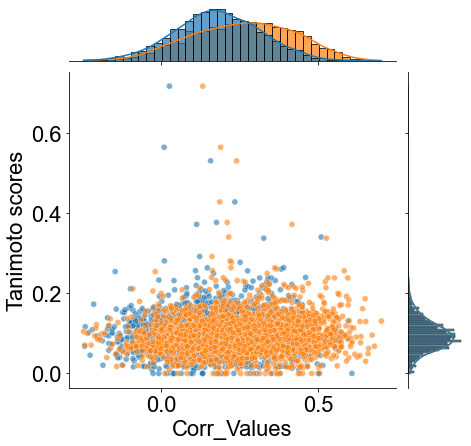

In [133]:
# Create a JointGrid
plt.rcParams['font.family'] = 'Arial'

gc = sns.JointGrid(data=stacked_df, x='Corr_Values', y='Similarity', hue='Source', marginal_ticks=False)

# Add scatter plot to the joint area with transparency
sns.scatterplot(data=stacked_df, x='Corr_Values', y='Similarity', hue='Source', alpha=0.6, ax=gc.ax_joint)  # Adjust alpha for transparency

# Add histograms to the marginal areas
sns.histplot(data=stacked_df, x='Corr_Values', hue='Source', ax=gc.ax_marg_x, alpha=0.7, kde=True)
sns.histplot(data=stacked_df, y='Similarity', hue='Source', ax=gc.ax_marg_y, alpha=0.7, kde=True)
# Remove the legend
gc.ax_joint.legend_.remove()  # Remove legend from the joint plot
gc.ax_marg_x.legend_.remove()  # Remove legend from the marginal x-axis
gc.ax_marg_y.legend_.remove()
# Customize legend and axis labels
gc.ax_joint.tick_params(labelsize=22)
gc.set_axis_labels('Corr_Values', 'Tanimoto scores', fontsize=22)
# gc.ax_joint.legend(fontsize=14)
gc.fig.set_size_inches(6.3, 6)
plt.savefig(f'{figure_save_path}/Tanimoto_scores_correlation.svg', dpi=1000, bbox_inches='tight')
plt.show()


Spearman correlation: 0.47997918214598595, p-value: 1.5534899370471764e-151
 Pearson correlation: 0.5008645073134932, p-value: 6.15517933655059e-167


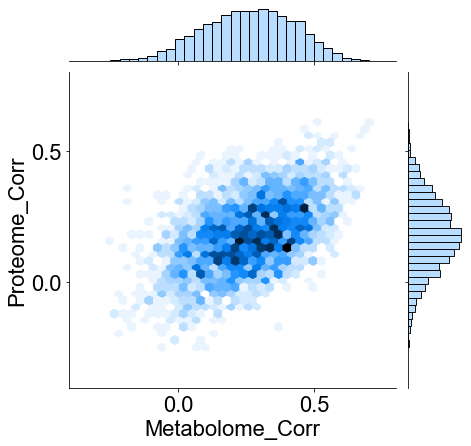

In [73]:
plot_scatter_joint(x_value = get_one_on_one_pairs_from_matrix(input_matrix = log_meta_updown.corr(method='pearson')).Similarity, 
                   y_value = get_one_on_one_pairs_from_matrix(input_matrix = log_pro_updown.corr(method='pearson')).Similarity,
                   kind='hex',
                   x_label = 'Metabolome_Corr', 
                   y_label = 'Proteome_Corr',
                   xlim=(-0.4, 0.8), ylim=(-0.4, 0.8),
                   xticks=[ 0, 0.5], yticks=[ 0, 0.5],
                   save_name = "scatter_plot_metabolome_proteome_corr")

In [484]:
tanimoto_pairs_df[tanimoto_pairs_df['Similarity'] > 0.3]

,Drug 1,Drug 2,Similarity
840,Bupivacaine,Lidocaine,0.372549
892,Carbinoxamine,Chlorphenoxamine,0.428571
895,Carbinoxamine,Cloperastine,0.377358
963,Cefetamet pivoxil,Cefodizime,0.565217
1782,Deoxycorticosterone,Finasteride,0.338028
2964,Melitracen,Nortriptyline,0.340909
3343,Ornidazole,Secnidazole,0.717949
4522,Tetrabenazine,Valbenazine,0.53125


In [500]:
corr_pearson = corr_pearson.rename(columns = {'DFO': 'Deferoxamine'})
corr_pearson = corr_pearson.rename(index = {'DFO': 'Deferoxamine'})
corr_spearman = corr_spearman.rename(columns = {'DFO': 'Deferoxamine'})
corr_spearman = corr_spearman.rename(index = {'DFO': 'Deferoxamine'})

In [501]:
# def calculate_similarity


# Stack the similarity matrix
pairs2 = corr_pearson.stack()
# pairs3 = corr_spearman.stack()

# Create a DataFrame from the stacked Series
tanimoto_pairs_df2 = pairs2.reset_index()
tanimoto_pairs_df2.columns = ['Drug 1', 'Drug 2', 'Similarity']

# Remove self-correlation pairs
tanimoto_pairs_df2 = tanimoto_pairs_df2[tanimoto_pairs_df2['Drug 1'] != tanimoto_pairs_df2['Drug 2']]

# Sort the drug names to ensure pairs are in a consistent order
tanimoto_pairs_df2[['Drug 1', 'Drug 2']] = np.sort(tanimoto_pairs_df2[['Drug 1', 'Drug 2']], axis=1)

# Remove duplicates
tanimoto_pairs_df2 = tanimoto_pairs_df2.drop_duplicates()

In [491]:
# tanimoto_pairs_df

In [492]:
# tanimoto_pairs_df2

In [502]:
# tanimoto_pairs_df['pearson_R'] = tanimoto_pairs_df2.Similarity.tolist()
tanimoto_pairs_df['spearman_R'] = tanimoto_pairs_df2.Similarity.tolist()

In [503]:
tanimoto_pairs_df[tanimoto_pairs_df['Similarity'] > 0.3]

,Drug 1,Drug 2,Similarity,pearson_R,spearman_R
840,Bupivacaine,Lidocaine,0.372549,0.190681,0.060251
892,Carbinoxamine,Chlorphenoxamine,0.428571,0.222801,0.229091
895,Carbinoxamine,Cloperastine,0.377358,0.226278,0.162235
963,Cefetamet pivoxil,Cefodizime,0.565217,0.082182,0.000773
1782,Deoxycorticosterone,Finasteride,0.338028,0.624579,0.507624
2964,Melitracen,Nortriptyline,0.340909,0.290598,0.522246
3343,Ornidazole,Secnidazole,0.717949,0.078713,0.012402
4522,Tetrabenazine,Valbenazine,0.53125,0.409410,0.328054


In [493]:
high_p_values = tanimoto_pairs_df[tanimoto_pairs_df['pearson_R'] > 0.7]

In [506]:
tanimoto_pairs_df[tanimoto_pairs_df['Similarity'] > 0.4]

,Drug 1,Drug 2,Similarity,pearson_R,spearman_R
892,Carbinoxamine,Chlorphenoxamine,0.428571,0.222801,0.229091
963,Cefetamet pivoxil,Cefodizime,0.565217,0.082182,0.000773
3343,Ornidazole,Secnidazole,0.717949,0.078713,0.012402
4522,Tetrabenazine,Valbenazine,0.53125,0.409410,0.328054


In [515]:
tanimoto_pairs_df2

,Drug 1,Drug 2,Similarity
1,Acamprosate,Deferoxamine,0.314198
2,Acenocoumarol,Deferoxamine,0.102450
3,Adenosylcobalamin,Deferoxamine,0.349621
4,Aminophylline,Deferoxamine,0.064192
5,Asenapine,Deferoxamine,0.252468
...,...,...,...
5108,Valbenazine,Yohimbine,0.527766
5109,Valbenazine,Zaltoprofen,0.424169
5181,Vinpocetine,Yohimbine,0.552122
5182,Vinpocetine,Zaltoprofen,0.411465


In [499]:
# high_p_values

In [495]:
list(set(high_p_values['Drug 1']))

['Finasteride', 'Piperacillin', 'Monocrotaline', 'Hydroquinidine']

Spearman correlation: 0.09054355987610166, p-value: 3.3359633761756196e-06
 Pearson correlation: 0.0746958591707233, p-value: 0.00012672205418696967


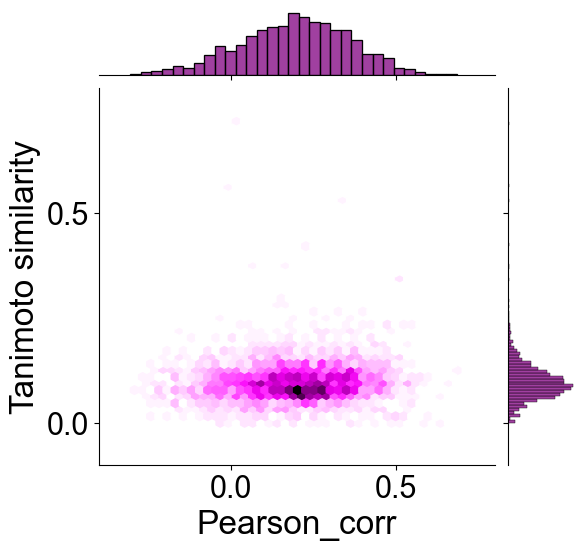

In [513]:
plot_scatter_joint(x_value=tanimoto_pairs_df2.Similarity.to_list(), 
                   y_value=tanimoto_pairs_df.Similarity.to_list(),
                   x_label='Pearson_corr', y_label='Tanimoto similarity',
                   xlim=(-0.4, 0.8), ylim=(-0.1, 0.8),
                   xticks=[ 0, 0.5], yticks=[ 0, 0.5])

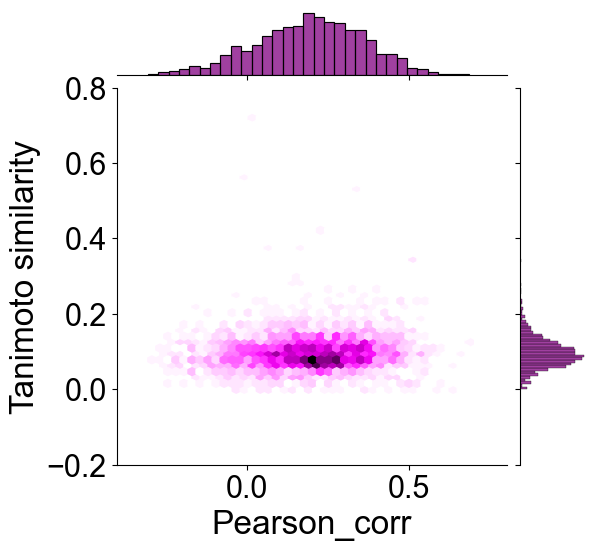

In [510]:
g1= sns.jointplot( x = tanimoto_pairs_df2.Similarity.to_list(), y = tanimoto_pairs_df.Similarity.to_list(),
                   xlim=(-0.4, 0.8), ylim=(-0.2, 0.8),
                   # xticks=[ 0, 0.5], yticks=[ 0, 0.5],
                   kind="hex", 
                    # truncate=False,
                   color="purple", height=6)
g1.fig.set_size_inches(5.3, 5) 
g1.ax_joint.tick_params(labelsize=22)
g1.set_axis_labels('Pearson_corr','Tanimoto similarity', fontsize=24)
plt.show()

# multiomic molecules network

In [20]:
pearson_corr_mols  = input_multi_df.T.corr(method='pearson')
spearman_corr_mols = input_multi_df.T.corr(method='spearman')

NameError: name 'input_multi_df' is not defined

In [379]:
pearson_corr_mols

,1-aminocyclopropane-1-carboxylic acid,1-aminocyclopropanecarboxylate,proline,indoline,"2,6-xylidine","2,4,6-trimethylpyridine",pipecolic acid,indole-3-carbinol,creatine,n-acetyl-alanine,...,RAB1B,H2A1C,CALM3,H12,GNAS1,SUMO4,SRSF6,SEP11,HBG2,H2B1L
1-aminocyclopropane-1-carboxylic acid,1.000000,0.424527,-0.158908,-0.200016,-0.267786,-0.249140,-0.122757,-0.263388,-0.330949,-0.322912,...,0.062399,-0.093197,-0.361902,0.084179,0.076633,-0.136107,-0.326014,-0.110439,0.258904,0.176088
1-aminocyclopropanecarboxylate,0.424527,1.000000,-0.217458,-0.449701,-0.435508,-0.426969,-0.420419,-0.361109,-0.494511,-0.488148,...,0.096674,-0.029861,-0.207031,-0.098617,-0.013182,-0.267059,-0.159433,-0.021173,0.318313,0.181440
proline,-0.158908,-0.217458,1.000000,0.557090,0.400616,0.570446,0.613701,0.614994,0.055669,0.057539,...,0.062010,-0.134401,0.235298,-0.048782,-0.075370,0.186675,-0.024478,0.032284,0.091805,0.238529
indoline,-0.200016,-0.449701,0.557090,1.000000,0.615093,0.667787,0.780000,0.545172,0.441904,0.440043,...,-0.140883,-0.076043,0.368977,-0.174050,0.023053,0.055776,0.090283,0.161687,0.022863,0.172359
"2,6-xylidine",-0.267786,-0.435508,0.400616,0.615093,1.000000,0.790783,0.718342,0.635923,0.086480,0.084004,...,0.111993,0.002189,0.141284,-0.201163,-0.122263,-0.083778,-0.146246,0.037926,0.187997,0.170483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,-0.136107,-0.267059,0.186675,0.055776,-0.083778,0.051709,0.128488,0.063355,0.347372,0.353910,...,-0.193802,-0.251544,0.055829,0.411109,0.094960,1.000000,0.284297,0.359057,-0.374642,0.028699
SRSF6,-0.326014,-0.159433,-0.024478,0.090283,-0.146246,-0.030588,-0.090531,-0.131810,0.413868,0.407858,...,-0.206211,0.077852,0.087409,0.119177,-0.084232,0.284297,1.000000,0.273323,-0.352929,-0.068340
SEP11,-0.110439,-0.021173,0.032284,0.161687,0.037926,0.187796,0.115713,-0.029515,0.207766,0.214938,...,-0.381289,-0.092089,0.147435,0.167658,-0.071231,0.359057,0.273323,1.000000,0.055833,-0.050222
HBG2,0.258904,0.318313,0.091805,0.022863,0.187997,0.291575,0.181411,0.071773,-0.426317,-0.431217,...,0.328127,-0.012384,-0.228932,-0.200742,-0.165923,-0.374642,-0.352929,0.055833,1.000000,0.114511


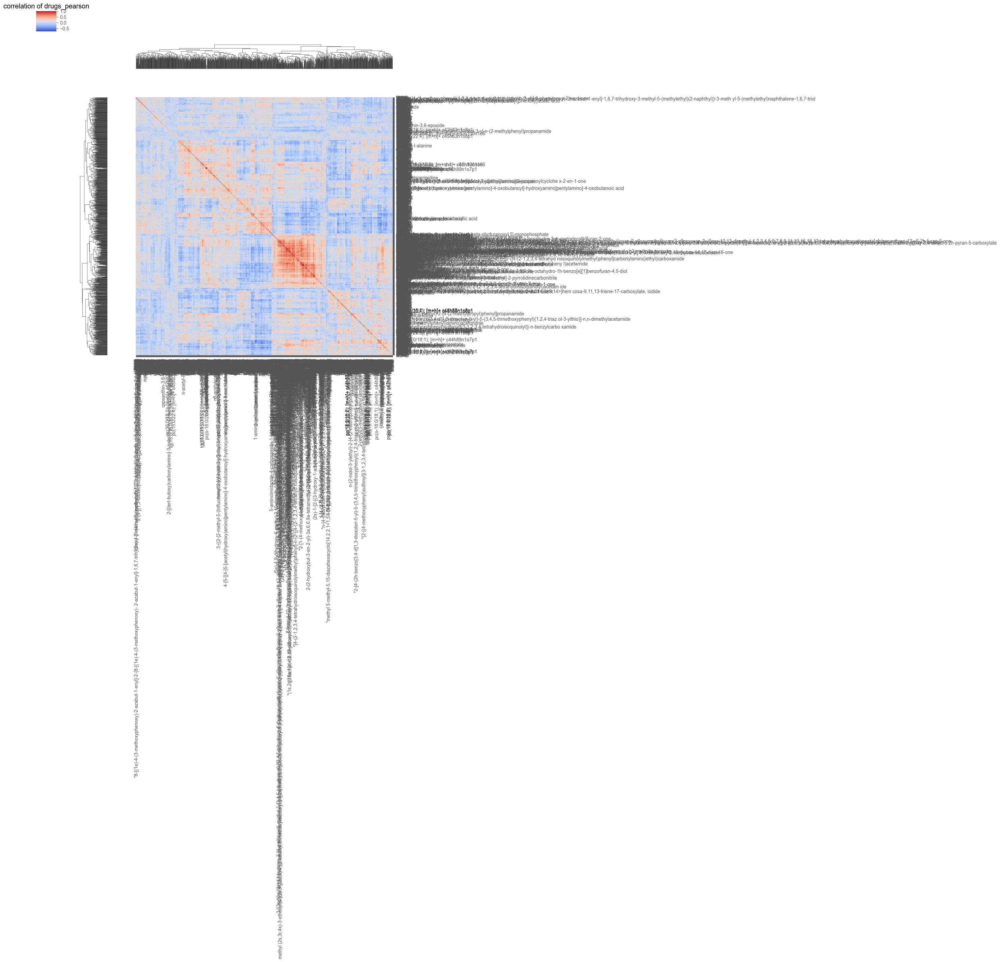

In [381]:
plot_corr_clustered_heatmap(plot_df = pearson_corr_mols,title_name = "correlation of drugs_pearson")

In [ ]:
plot_corr_clustered_heatmap(plot_df = spearman_corr_mols,title_name = "correlation of drugs_spearman")

In [33]:
log_pro_updown.loc['FBLL1'].std()

0.17037022366981922

In [34]:
log_pro_updown.loc['DX39A'].std()

0.04494930936878757

In [35]:
log_pro_updown.loc['BACH'].std()

0.054995654578418804

#  KEGG enrichment analysis of proteome and metabolome

In [218]:
import gseapy as gp
enr_pro = gp.enrichr(gene_list= log_pro_updown.index[2:].tolist(), 
                 gene_sets='KEGG_2021_Human', 
                 organism='Human',  
                 outdir='enrichr_results'  
                )

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


In [219]:
pathway_pro = enr_pro.results
pathway_pro.to_csv(f'{pro_file_read_path}/proteome_KEGG_enrichment.csv')

In [220]:
top_pathways = pathway_pro.iloc[:15,:]

In [221]:
top_pathways['Genes'] = top_pathways['Genes'].apply(lambda x: x.split(';'))
top_pathways

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Spliceosome,32/150,2.973977e-12,7.048325e-10,0,0,5.232956,138.888507,"[DDX5, RBM25, SF3B2, SF3B3, RBM8A, DDX46, SF3B..."
1,KEGG_2021_Human,DNA replication,9/36,5.639712e-05,6.683059e-03,0,0,6.314685,61.777150,"[RFC5, FEN1, PCNA, MCM7, MCM3, MCM4, MCM5, MCM..."
2,KEGG_2021_Human,Non-homologous end-joining,5/13,2.977996e-04,2.352617e-02,0,0,11.804726,95.843631,"[FEN1, XRCC6, MRE11, PRKDC, XRCC5]"
3,KEGG_2021_Human,Pentose phosphate pathway,7/30,6.004109e-04,3.557434e-02,0,0,5.755299,42.692214,"[PRPS2, PRPS1, G6PD, ALDOC, ALDOA, TKT, PGM1]"
4,KEGG_2021_Human,RNA transport,20/186,1.191635e-03,5.648352e-02,0,0,2.290860,15.423054,"[RBM8A, FUS, FMR1, SUMO4, FXR2, XPO1, XPOT, EI..."
5,KEGG_2021_Human,Proteasome,8/46,1.939740e-03,7.661974e-02,0,0,3.981931,24.867959,"[PSMD8, PSMD7, PSMD4, PSMD2, PSME3, PSMD3, PSM..."
6,KEGG_2021_Human,Glycolysis / Gluconeogenesis,8/67,1.920536e-02,6.502387e-01,0,0,2.561792,10.125650,"[LDHB, LDHA, ALDH2, PGAM1, PGK1, ALDOC, ALDOA,..."
7,KEGG_2021_Human,Base excision repair,5/33,2.381156e-02,7.054174e-01,0,0,3.369225,12.592763,"[FEN1, PCNA, PARP1, APEX1, HMGB1]"
8,KEGG_2021_Human,Parkinson disease,19/249,4.858413e-02,9.999960e-01,0,0,1.563813,4.729689,"[TRAP1, PARK7, COX5B, SDHA, SDHB, PSMD8, UCHL1..."
9,KEGG_2021_Human,Cell cycle,11/124,4.918992e-02,9.999960e-01,0,0,1.839423,5.540466,"[HDAC2, PCNA, MCM7, PRKDC, CDK1, MCM3, MCM4, M..."


In [ ]:
top_pathways

In [194]:
# 鉴定到的代谢物参与的代谢通路

df_meta_pathways = pd.read_excel(f'{meta_file_read_path}\metabolome names and pathways.xlsx',sheet_name = "Sheet1")
df_meta_pathways

,names,KEGG ID
0,1-aminocyclopropane-1-carboxylic acid,C01234
1,1-aminocyclopropanecarboxylate,C01234
2,proline,C00148
3,indoline,NaN
4,"2,6-xylidine",C11004
...,...,...
334,n1-acetylspermine,C02567
335,"""4-hydroxy-5,7-dimethyl-3-benzylhydroquinolin-...",NaN
336,2-amino-2-methylpropanoic acid,C03665
337,3-aminoisobutanoic acid,C05145


In [195]:
filtered_df_meta_pathways = df_meta_pathways[df_meta_pathways["KEGG ID"].notna()]
metabolites_list = filtered_df_meta_pathways['KEGG ID'].tolist()
# metabolites_list

In [196]:
# filtered_df_meta_pathways.to_csv(f'{meta_file_read_path}/metabolone_KEGG_IDS.csv')

In [197]:
# enr_metabolome = gp.enrichr(
#     gene_list=metabolites_list,
#     gene_sets='KEGG_2019_Human', # Adjust to appropriate gene set
#     organism='Human',
#     outdir='enrichr_results' ,
#     cutoff= None 
# )

In [198]:
# enr_metabolome.results

# make compound to pathway mapping for metabolome

In [53]:
# Metabolome data enrichment
import requests

def get_pathways_from_compound_id(kegg_id):
    url = f"http://rest.kegg.jp/link/pathway/{kegg_id}"
    response = requests.get(url)
    if response.status_code == 200:
        if response.text.strip() == "":
            return []
        pathways = []
        for line in response.text.strip().split('\n'):
            parts = line.split('\t')
            if len(parts) == 2:
                pathway_id = parts[1]
                # get pathway name
                pathway_info = get_pathway_description(pathway_id)
                pathways.append((pathway_id, pathway_info))
        return pathways
    else:
        # print(f"ERROR: Unable to get pathways for {kegg_id} (Status Code: {response.status_code})")
        return []

In [54]:
from bioservices import KEGG
kegg = KEGG()
from urllib.parse import quote
import requests

In [56]:
# 获取该物种的所有通路
pathways = kegg.list("pathway", 'hsa')

# 将字符串解析为字典
pathways_dict = {}
for line in pathways.strip().split("\n"):
    if line:
        pid, pname = line.split("\t")
        pathway_id = pid # 例如 'mmu00010'  
        pathway_name = pname
        pathways_dict[pathway_id] = pathway_name
print(f"共获取到 {len(pathways_dict)} 个通路。")

共获取到 362 个通路。


In [57]:
def get_compounds_in_pathway(kegg_instance, pathway_id):
    """
    从KEGG通路信息中提取化合物ID。

    参数:
        kegg_instance (bioservices.KEGG): KEGG服务实例。
        pathway_id (str): 通路ID，例如 'mmu00010'。

    返回:
        list: 包含该通路中所有化合物ID的列表。
    """
    try:
        pathway_info = kegg_instance.get(pathway_id)
        compounds = []
        compound_section = False  # 标记是否处于COMPOUND部分

        for line in pathway_info.split('\n'):
            line = line.strip()
            if line.startswith('COMPOUND'):
                compound_section = True
                # 提取第一行的化合物ID
                parts = line.split()
                for part in parts[1:]:
                    if part.startswith('C'):
                        compounds.append(part)
            elif compound_section:
                # 检查是否为缩进行（继续的化合物行）
                if line.startswith('C'):
                    parts = line.split()
                    compound_id = parts[0]
                    compounds.append(compound_id)
                else:
                    # if not a compound ID starts with C, end it
                    break
        return compounds
    except Exception as e:
        print(f"获取通路 {pathway_id} 失败: {e}")
        return []

In [58]:
import time
# 构建通路到化合物的映射
pathway_to_compounds = {}
total_pathways = len(pathways_dict)
for idx, (pid, pname) in enumerate(pathways_dict.items(), 1):
    compounds = get_compounds_in_pathway(kegg, pid)
    pathway_to_compounds[pid] = compounds
    if idx % 50 == 0 or idx == total_pathways:
        print(f"已处理 {idx}/{total_pathways} 个通路。")
    time.sleep(1)  # 添加延时，避免触发API限制

已处理 50/362 个通路。
已处理 100/362 个通路。
已处理 150/362 个通路。
已处理 200/362 个通路。
已处理 250/362 个通路。
已处理 300/362 个通路。
已处理 350/362 个通路。
已处理 362/362 个通路。


In [61]:
# change dict to DataFrame and save it
data_final = []
for pathway_id, compounds in pathway_to_compounds.items():
    for compound in compounds:
        data_final.append({'Pathway_ID': pathway_id, 'Compound_ID': compound})

df_pathway = pd.DataFrame(data_final)
df_pathway["Pathway_Name"] = df_pathway['Pathway_ID'].map(pathways_dict)
# 保存到 CSV 文件
df_pathway.to_csv(f'{meta_file_read_path}/pathway_to_compounds_human.csv', index=False, encoding='utf-8')

In [210]:
def group_columns(df, group_by_col, columns_to_group, sort_by_col=None, ascending=True):
    """
    Groups a DataFrame by a specified column, aggregates other columns into lists,
    and optionally sorts by the length of the lists in a specified column.

    Parameters:
    - df: pandas.DataFrame, the DataFrame to operate on
    - group_by_col: str, the column name to group by
    - columns_to_group: list of str, the column names to aggregate
    - sort_by_col: str, optional, the column name to sort by the length of its lists
    - ascending: bool, optional, whether to sort in ascending order (default is True)

    Returns:
    - grouped_df: pandas.DataFrame, the grouped and optionally sorted DataFrame
    """
    # Create aggregation dictionary
    agg_dict = {col: list for col in columns_to_group}
    
    # Group and aggregate
    grouped_df = df.groupby(group_by_col).agg(agg_dict).reset_index()
    
    # Sort by the length of lists in the specified column
    if sort_by_col and sort_by_col in grouped_df:
        grouped_df = grouped_df.assign(
            list_length=grouped_df[sort_by_col].apply(len)
        ).sort_values(by="list_length", ascending=ascending).drop(columns="list_length")
    
    return grouped_df

In [222]:
# Example usage
heihei_df = group_columns(
    df_pathway,
    group_by_col='Pathway_Name',
    columns_to_group=['Compound_ID', 'Pathway_ID'],
    sort_by_col='Compound_ID', ascending=False
)

NameError: name 'df_pathway' is not defined

In [351]:
heihei_df

,Pathway_Name,Compound_ID,Pathway_ID
205,Porphyrin metabolism - Homo sapiens (human),"[C00025, C00032, C00037, C00188, C00194, C0043...","[hsa00860, hsa00860, hsa00860, hsa00860, hsa00..."
0,ABC transporters - Homo sapiens (human),"[C00009, C00025, C00031, C00032, C00034, C0003...","[hsa02010, hsa02010, hsa02010, hsa02010, hsa02..."
156,Metabolism of xenobiotics by cytochrome P450 -...,"[C00745, C00829, C02617, C03012, C06205, C0675...","[hsa00980, hsa00980, hsa00980, hsa00980, hsa00..."
14,Amino sugar and nucleotide sugar metabolism - ...,"[C00029, C00031, C00043, C00052, C00085, C0009...","[hsa00520, hsa00520, hsa00520, hsa00520, hsa00..."
244,Steroid hormone biosynthesis - Homo sapiens (h...,"[C00187, Cholesterol, C00280, C00410, C00468, ...","[hsa00140, hsa00140, hsa00140, hsa00140, hsa00..."
...,...,...,...
155,Melanoma - Homo sapiens (human),[C05981],[hsa05218]
153,Measles - Homo sapiens (human),[C05981],[hsa05162]
3,Acute myeloid leukemia - Homo sapiens (human),[C05981],[hsa05221]
219,RIG-I-like receptor signaling pathway - Homo s...,[C00046],[hsa04622]


# Read the metabolite KEGG ID to pathway mapping and apply to SMAD dataset

In [191]:
dfdf_compound_to_pathway_metabolome = pd.read_csv(f'{meta_file_read_path}/pathway_to_compounds_human.csv')

In [192]:
dfdf_compound_to_pathway_metabolome['Pathway_Name'] = [item.split(" -")[0] for item in dfdf_compound_to_pathway_metabolome['Pathway_Name'].tolist()]
dfdf_compound_to_pathway_metabolome

,Pathway_ID,Compound_ID,Pathway_Name
0,hsa00010,C00022,Glycolysis / Gluconeogenesis
1,hsa00010,C00024,Glycolysis / Gluconeogenesis
2,hsa00010,C00031,Glycolysis / Gluconeogenesis
3,hsa00010,C00033,Glycolysis / Gluconeogenesis
4,hsa00010,C00036,Glycolysis / Gluconeogenesis
...,...,...,...
6041,hsa04934,C01245,Cushing syndrome
6042,hsa04934,C01953,Cushing syndrome
6043,hsa04934,C05138,Cushing syndrome
6044,hsa04934,C05488,Cushing syndrome


In [199]:
filtered_df_meta_pathways

,names,KEGG ID
0,1-aminocyclopropane-1-carboxylic acid,C01234
1,1-aminocyclopropanecarboxylate,C01234
2,proline,C00148
4,"2,6-xylidine",C11004
6,pipecolic acid,C00408
...,...,...
330,salmeterol,C07241
334,n1-acetylspermine,C02567
336,2-amino-2-methylpropanoic acid,C03665
337,3-aminoisobutanoic acid,C05145


In [200]:
# filtered_df_meta_pathways.loc[filtered_df_meta_pathways['KEGG ID'] == 'C00157']

In [201]:
my_compounds = filtered_df_meta_pathways['KEGG ID'].tolist()

df_your_compounds = dfdf_compound_to_pathway_metabolome[dfdf_compound_to_pathway_metabolome['Compound_ID'].isin(my_compounds)]

In [212]:
group_columns(dfdf_compound_to_pathway_metabolome,
              group_by_col='Pathway_Name',
              columns_to_group=['Compound_ID', 'Pathway_ID'],
              sort_by_col='Compound_ID', ascending=False
                                          )

,Pathway_Name,Compound_ID,Pathway_ID
45,Chemical carcinogenesis,"[C00027, C03012, C03621, C03622, C06268, C0654...","[hsa05204, hsa05204, hsa05204, hsa05204, hsa05..."
199,Porphyrin metabolism,"[C00025, C00032, C00037, C00188, C00194, C0043...","[hsa00860, hsa00860, hsa00860, hsa00860, hsa00..."
68,Drug metabolism,"[C01471, C01516, C05011, C06174, C06754, C0686...","[hsa00982, hsa00982, hsa00982, hsa00982, hsa00..."
0,ABC transporters,"[C00009, C00025, C00031, C00032, C00034, C0003...","[hsa02010, hsa02010, hsa02010, hsa02010, hsa02..."
150,Metabolism of xenobiotics by cytochrome P450,"[C00745, C00829, C02617, C03012, C06205, C0675...","[hsa00980, hsa00980, hsa00980, hsa00980, hsa00..."
...,...,...,...
147,Measles,[C05981],[hsa05162]
149,Melanoma,[C05981],[hsa05218]
213,RIG-I-like receptor signaling pathway,[C00046],[hsa04622]
3,Acute myeloid leukemia,[C05981],[hsa05221]


In [684]:
df_your_compounds.loc[df_your_compounds['Compound_ID'] == 'C00157']

,Pathway_ID,Compound_ID,Pathway_Name
1159,hsa00564,C00157,Glycerophospholipid metabolism
1269,hsa00590,C00157,Arachidonic acid metabolism
1348,hsa00591,C00157,Linoleic acid metabolism
1377,hsa00592,C00157,alpha-Linolenic acid metabolism
4900,hsa04981,C00157,Folate transport and metabolism
5104,hsa04723,C00157,Retrograde endocannabinoid signaling
5511,hsa05231,C00157,Choline metabolism in cancer


In [213]:
sorted_metabo_pathways  =   group_columns(
                                 df_your_compounds,
                                 group_by_col='Pathway_Name',
                                 columns_to_group=['Compound_ID', 'Pathway_ID'],
                                 sort_by_col='Compound_ID', ascending=False
                                          )
meta_top_pathways = sorted_metabo_pathways.iloc[:25,:]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'ABC transporters'),
  Text(0, 1, 'Protein digestion and absorption'),
  Text(0, 2, 'D-Amino acid metabolism'),
  Text(0, 3, 'Aminoacyl-tRNA biosynthesis'),
  Text(0, 4, 'Central carbon metabolism in cancer'),
  Text(0, 5, 'Arginine and proline metabolism'),
  Text(0, 6, 'Glycerophospholipid metabolism'),
  Text(0, 7, 'Lysine degradation'),
  Text(0, 8, 'Mineral absorption'),
  Text(0, 9, 'Glycine, serine and threonine metabolism')])

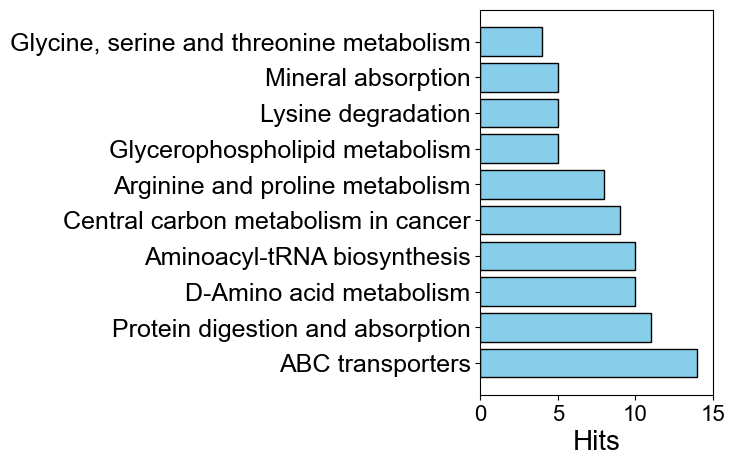

In [707]:
plt.figure(figsize=(3, 5)) 

plt.barh(meta_top_pathways['Pathway_Name'].tolist()[:10], 
        [len(item) for item in meta_top_pathways['Compound_ID'].tolist()][:10], 
        color='skyblue', edgecolor='black')
plt.xlabel('Hits',fontsize = 20)
plt.xticks(ticks=range(0, 16, 5), fontsize = 16)
plt.yticks(fontsize = 18)
# plt.ylabel('Categories')

In [361]:
sorted_metabo_pathways[sorted_metabo_pathways['Pathway_Name'].str.contains('lipid', na=False)]

,Pathway_Name,Compound_ID,Pathway_ID
57,Glycerophospholipid metabolism - Homo sapiens ...,"[C00157, C00350, C00588, C00670, C01233]","[hsa00564, hsa00564, hsa00564, hsa00564, hsa00..."
121,Sphingolipid signaling pathway - Homo sapiens ...,"[C00165, C00550]","[hsa04071, hsa04071]"
43,Ether lipid metabolism - Homo sapiens (human),"[C00670, C01233]","[hsa00565, hsa00565]"
120,Sphingolipid metabolism - Homo sapiens (human),[C00550],[hsa00600]


In [273]:
# df_your_compounds.Pathway_Name

In [333]:
# 统计每个通路中您的化合物数量
pathway_counts = df_your_compounds['Pathway_ID'].value_counts().reset_index()
pathway_counts.columns = ['Pathway_ID', 'Your_Compound_Count']

print("您的化合物在各通路中的分布：")
print(pathway_counts.head())

您的化合物在各通路中的分布：
  Pathway_ID  Your_Compound_Count
0   hsa02010                   14
1   hsa04974                   11
2   hsa00970                   10
3   hsa00470                   10
4   hsa05230                    9


In [203]:
new_map_dict_meta = dict(zip(filtered_df_meta_pathways['names'], filtered_df_meta_pathways['KEGG ID']))

In [204]:
log_meta_updown2 = log_meta_updown.rename(index=new_map_dict_meta )

In [205]:
log_meta_updown2

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
C01234,0.246573,0.603693,0.181567,0.283705,0.542164,0.254458,-0.448922,0.670184,0.556150,-0.116215,...,0.572960,0.378020,0.412127,0.195831,-0.151307,0.590388,-0.026561,0.787140,-0.023244,1.483422
C01234,-0.103425,0.066514,0.291304,-0.784358,0.156219,0.352240,0.745042,0.433640,0.137667,0.153482,...,0.522990,0.098014,0.101313,-0.398014,-0.277649,0.026176,0.397826,0.213691,0.311958,0.817078
C00148,0.834857,-0.143302,0.101749,0.582299,-0.211243,0.451362,-0.060769,0.196576,-0.102298,-0.036129,...,-0.188299,0.327116,0.265305,-0.430034,0.056627,-0.449737,-0.110895,-0.154366,-0.588848,-0.351641
indoline,0.457173,-0.109066,-0.093393,0.285082,-0.187646,-0.073622,-0.130449,-0.152071,0.078611,-0.043945,...,-0.298591,-0.041150,-0.113197,-0.032443,0.047088,-0.238991,-0.337284,-0.246087,-0.325657,-0.228572
C11004,0.757345,0.125193,0.205934,0.485600,0.101506,0.172697,0.036505,-0.365570,0.087966,0.370911,...,-0.284601,-0.175647,0.100405,-0.024644,-0.202176,-0.117092,-0.353149,-0.088113,-0.367396,-0.261119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n-formyl-methionine,0.087204,0.689187,-0.243916,0.412194,-0.232288,0.213945,-0.142699,-0.363447,0.181430,-0.104820,...,-0.288644,0.213200,-0.199949,-0.019320,0.005779,-0.337346,-0.222878,-0.231956,-0.380562,1.050228
C02567,0.268294,-0.019858,-0.050758,-0.024510,-0.045145,-0.189191,-0.257402,-0.126641,-0.298071,-0.128580,...,-0.215842,-0.260271,-0.220559,-0.279026,-0.117447,-0.306495,-0.382001,-0.254715,-0.307840,-0.267668
C03665,-0.419934,0.191618,-0.078746,-0.283429,0.383220,-0.119823,-0.128113,0.349927,0.729647,-0.231832,...,0.490621,0.025946,-0.093798,0.280708,0.656534,0.697732,0.033756,0.775276,0.096508,0.644408
C05145,-0.422599,0.192490,-0.078860,-0.279896,0.381874,-0.118230,-0.127384,0.346742,0.731536,-0.229726,...,0.492957,0.027389,-0.092596,0.281044,0.659076,0.698731,0.036211,0.776316,0.097402,0.646162


# plot heatmap for speacific proteins/metabolites or pathways 

In [236]:
def plot_clusterheatmap2(dfheatmap, low=-2, high=2, figure_size = (21, 9)):
    '''This is a function to plot clustered heatmap for a input dataframe'''

    # Define custom color map
    colors = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998"]
    n_bins = 10  # Number of bins in the color map
    cmap_name = "custom_diverging"
    # custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)
    custom_cmap = "viridis"
    # Create the heatmap with the custom color map
    plt.rcParams['font.family'] = 'Arial'
        # Create the heatmap with the custom color map, figure size, and hidden dendrograms
    ax = sns.clustermap(dfheatmap, annot=False, cmap=custom_cmap,cbar=True, vmin=low, vmax=high,
                        figsize = figure_size,  # Set the figure size here
                        row_cluster=True,  # Enable row clustering
                        col_cluster=False,  # Enable column clustering
                        dendrogram_ratio=(.1, .1),  # Minimize the dendrogram size
                        tree_kws={'linewidths': 1}, # Make dendrogram lines invisible
                        cbar_pos=(-0.05, 0.76, 0.025, 0.20))
    # Customize the color bar ticks and labels
    cbar = ax.ax_heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize = 20) 
    
    ax.ax_heatmap.set_yticklabels(ax.ax_heatmap.get_yticklabels(), rotation=360, fontsize=16) 
    ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xticklabels(), rotation=90, fontsize=20)  # Customize x-tick labels
 # Customize y-tick labels
    ax.ax_heatmap.tick_params(axis='x', which='both', length=0)
    # plt.savefig(f'{figure_save_path}/_clustered_heatmap.svg', dpi=800, bbox_inches='tight')
    # plt.tight_layout()
    plt.show()

In [207]:
from itertools import chain
def choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'Cell cycle',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib']):

    '''This is a function to make a dataframe for certain drug groups and a select pathway name,
    input is a dataframe that with raw values of column as drug names and index as molecules'''

    # drug_names =['Valbenazine','Tetrabenazine'] 
    genes_selected = list(chain.from_iterable(top_pathways.loc[top_pathways['Term'] == pathway_name, 'Genes'].tolist()))
    return mole_data_df.loc[genes_selected,drug_names]

def choose_specific_metabolites_pathways_drugs_out(mole_data_df = log_meta_updown2.apply(zscore, axis=1),
                                                pathway_name = 'ABC transporters - Homo sapiens (human)',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib']):

    '''This is a function to make a dataframe for certain drug groups and a select pathway name,
    input is a dataframe that with raw values of column as drug names and index as molecules'''

    # drug_names =['Valbenazine','Tetrabenazine'] 
    metabolites_selected = list(chain.from_iterable(meta_top_pathways.loc[meta_top_pathways['Pathway_Name'] == pathway_name, 'Compound_ID'].tolist()))
    return mole_data_df.loc[metabolites_selected,drug_names]

In [214]:
choose_specific_metabolites_pathways_drugs_out(mole_data_df = log_meta_updown2.apply(zscore, axis=1),
                                                pathway_name = 'Glycerophospholipid metabolism',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib'])

,Cobimetinib,Selumetinib,Baricitinib,Fedratinib
C00157,-1.926721,-0.705785,-0.358709,1.219978
C00157,-0.120284,1.171827,-0.414952,1.304011
C00157,-1.067216,3.051410,-0.514267,0.992299
C00157,1.952634,1.020400,0.395323,1.011651
C00157,-0.610775,0.084472,-0.144914,0.680061
C00157,-0.555885,0.605575,0.831840,-0.151871
C00157,-0.682252,-0.893475,-0.775634,-0.334205
C00157,-1.041807,0.549954,-0.228436,1.894267
C00157,-1.060335,0.149120,-0.196423,1.765453
C00157,1.416687,0.447757,0.356408,0.710222


In [223]:
# select a certain pathway or drug groups that interested and plot all proteins in this pathway

xuanze1 = choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'DNA replication',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib'])

xuanze2 = choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'Cell cycle',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib'])

xuanze3 = choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'Cell cycle',
                                                drug_names = ['Fenofibrate', 'Linagliptin','Trimetazidine'])

In [224]:
xuanze = pd.concat([xuanze1,xuanze2])
ttop = xuanze[~xuanze.index.duplicated(keep='first')]


In [225]:
# top_pathways

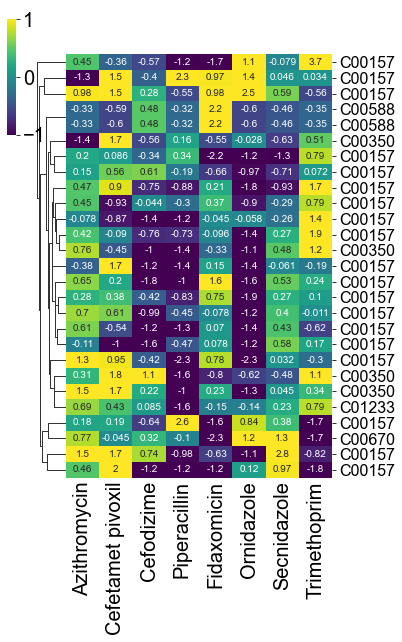

In [245]:
plot_clusterheatmap2(choose_specific_metabolites_pathways_drugs_out(mole_data_df = log_meta_updown2.apply(zscore, axis=1),
                                                pathway_name = 'Glycerophospholipid metabolism',
                                                drug_names = ["Azithromycin","Cefetamet pivoxil","Cefodizime","Piperacillin",
                      "Fidaxomicin","Ornidazole","Secnidazole","Trimethoprim"]
                                                                ), 
                     low=-1, high=1,  
                     figure_size = (5, 8))

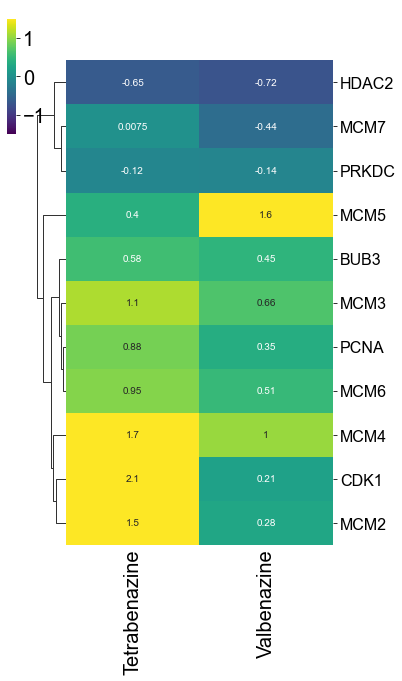

In [244]:
plot_clusterheatmap2(choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'Cell cycle',
                                                drug_names = ['Tetrabenazine','Valbenazine']), 
                     low=-1.5, high=1.5, 
                     figure_size = (5, 8))

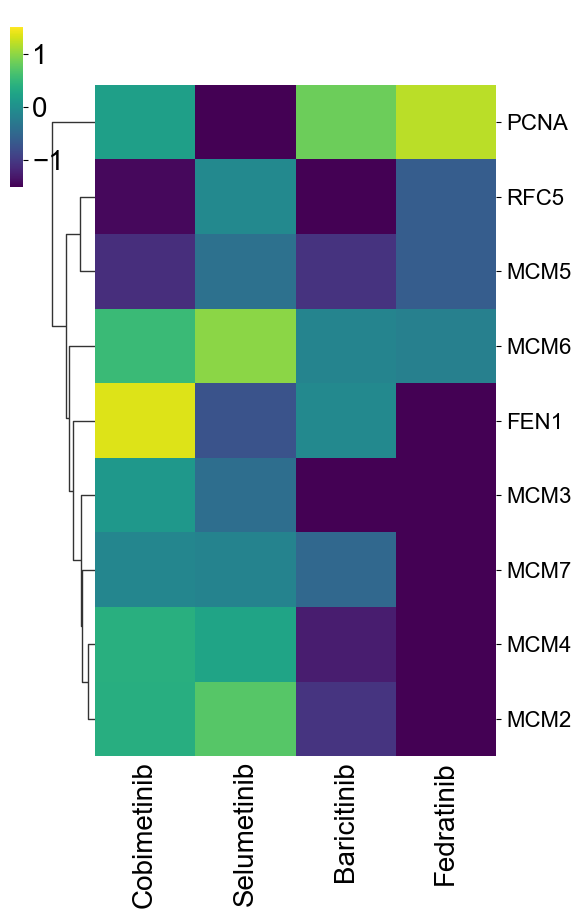

In [362]:
plot_clusterheatmap2(choose_specific_proteins_pathways_drugs_out(mole_data_df = updown_multi.apply(zscore, axis=1),
                                                pathway_name = 'DNA replication',
                                                drug_names = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib']
                                                                )
                     , 
                     low=-1.5, high=1.5, 
                     figure_size = (5, 8))

In [49]:
# log_pro_updown.apply(zscore, axis=1)

In [481]:
# log_pro_updown.apply(zscore, axis=1).iloc[3,:].hist()

In [230]:
df_expression = log_pro_updown.apply(zscore, axis=1)
# df_expression = log_pro_updown
df_pathways = top_pathways

df_result = pd.DataFrame(columns=df_expression.columns)

for i, row in df_pathways.iterrows():
    pathway_genes = row['Genes']
    df_genes = df_expression.loc[pathway_genes]
    df_sum = df_genes.sum()
    df_result.loc[row['Term']] = df_sum
    # df_mean = df_genes.mean()
    # df_result.loc[row['Term']] = df_mean
# df_result
# df_result = df_result.apply(zscore, axis=1)
# df_result = df_result.apply(lambda x: x / np.abs(x).max(), axis=1)
df_result

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
Spliceosome,17.431578,-1.877444,-5.761333,4.857012,-9.533490,18.216881,7.200103,2.493602,-17.600239,-0.580483,...,-3.337163,8.742048,-1.457015,-2.255242,13.749267,-6.146155,10.213608,-5.779463,7.477919,-0.962311
DNA replication,-8.630207,-4.834909,-2.156045,-3.850405,4.121372,0.900916,-2.037665,-7.308098,-7.222459,-3.277421,...,1.393199,-2.948524,-4.279454,-3.824273,2.943443,7.993630,2.898743,-2.067557,3.957764,4.136269
Non-homologous end-joining,-0.329654,-1.871034,2.198156,0.473707,-0.266565,-0.635405,0.929785,-3.169502,-2.903757,-2.027222,...,-0.171190,-1.806989,0.682118,0.532716,0.900562,0.983608,-0.575260,-5.356943,0.186965,-2.234377
Pentose phosphate pathway,2.408477,1.017446,1.248992,-1.598757,-3.519709,0.623181,6.321736,2.236590,-3.138028,-0.943541,...,-1.186808,1.186609,0.265922,-2.468336,3.174935,-2.645005,1.343002,0.458357,-1.216772,-1.776757
RNA transport,6.962195,-5.852204,-3.575635,-2.628986,-6.660814,11.323329,-2.548204,2.062596,-19.574476,-0.554446,...,-8.902381,1.741308,7.087884,-3.064611,-1.534864,3.148764,5.433632,-1.296283,-0.756930,-8.044906
Proteasome,-7.641140,-4.752588,2.709089,-1.407537,1.002264,-0.129018,1.385023,-0.905804,-4.736702,-4.640699,...,3.865952,-1.181225,0.059199,-7.522290,-9.504070,0.822404,3.854915,4.164144,4.097965,6.126919
Glycolysis / Gluconeogenesis,1.510410,-0.092951,-2.915017,-3.177126,-0.968817,5.761935,-0.779790,-3.985380,-8.411128,0.562452,...,1.292693,1.297137,-1.308250,-2.885484,5.772981,4.493456,2.536474,1.689552,4.104854,-0.997823
Base excision repair,1.118387,1.819220,0.902233,4.683367,-1.968624,1.351754,-1.047243,-0.128878,-5.370446,0.641254,...,-1.772426,-3.669612,-1.661222,-0.524997,2.881044,2.947032,-1.808859,-0.653694,1.006410,-0.966551
Parkinson disease,-6.097152,-8.693939,1.547223,-1.629171,-2.468344,10.470732,1.169944,-7.318928,-12.732707,-2.277741,...,3.039372,2.646593,0.908564,-7.044380,-2.706822,-3.038813,-0.143763,2.529961,3.671888,-0.080252
Cell cycle,-9.539811,-6.429126,-5.356808,-5.235813,6.311976,3.662439,0.402679,-6.529122,-10.972583,0.082360,...,1.909756,-1.003551,-1.865054,-4.203078,-1.124321,8.063435,3.801074,-0.684704,5.257056,-0.633356


In [228]:
df_expression_meta = log_meta_updown2.apply(zscore, axis=1)
# df_expression = log_pro_updown
df_pathways_meta = meta_top_pathways.iloc[:15,:]

df_result_meta = pd.DataFrame(columns=df_expression_meta.columns)

for i, row in df_pathways_meta.iterrows():
    pathway_genes_meta = row['Compound_ID']
    df_genes_meta = df_expression_meta.loc[pathway_genes_meta]
    df_sum_meta = df_genes_meta.sum()
    df_result_meta.loc[row['Pathway_Name']] = df_sum_meta
df_result_meta

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
ABC transporters,29.626876,5.333244,6.289791,19.712850,-8.607891,5.730274,0.929261,-4.914343,2.117501,5.174370,...,-6.549609,5.749501,8.157132,-4.161816,6.526418,-11.559956,-15.724073,-8.782721,-17.188489,-10.867817
Protein digestion and absorption,23.161145,5.166268,4.834392,13.116787,-5.780660,5.908630,1.917007,-1.610616,3.883701,4.021172,...,-4.243681,1.511706,3.722544,-0.718511,4.382403,-8.532899,-12.158770,-7.063939,-11.853458,-8.388290
D-Amino acid metabolism,22.324184,4.836775,5.119072,13.309366,-5.352365,5.215411,-0.268223,-0.706299,2.220754,3.083977,...,-3.512157,4.939870,4.652229,0.303194,8.627433,-6.553047,-11.735745,-7.803681,-12.269893,-6.976743
Aminoacyl-tRNA biosynthesis,23.185401,4.462035,5.090177,13.212594,-5.673654,5.796444,4.223976,-2.202499,2.803070,4.315975,...,-3.271509,1.385701,4.168216,-2.149996,3.972114,-8.960363,-12.352842,-7.230804,-13.274928,-9.807929
Central carbon metabolism in cancer,20.187909,3.711128,4.857763,12.293434,-5.235773,5.505624,4.782882,-1.259038,1.864769,4.113152,...,-2.136558,0.726032,3.130444,-3.154503,4.106510,-8.159057,-9.897388,-6.447017,-11.845983,-9.027691
Arginine and proline metabolism,18.188642,3.452855,1.011115,13.446331,-4.547891,1.845222,1.605013,-3.189713,-1.574081,3.750396,...,-2.300550,4.941475,2.843620,1.639684,5.844857,-1.667195,-8.830304,-6.749526,-10.805267,-8.510473
Glycerophospholipid metabolism,-17.274510,-1.303963,1.339226,18.127396,12.964473,-5.246809,8.992693,-4.504233,0.738878,5.556571,...,7.762832,-14.240068,-2.928275,1.671789,6.500325,0.518033,4.724611,-2.019425,-3.945219,-9.285835
Lysine degradation,12.378626,3.722174,-1.516096,6.574340,-3.058716,1.962544,-1.364159,-2.009479,0.716274,1.965734,...,-3.807064,1.681749,1.163135,0.783678,0.129634,-0.963657,-7.843907,-3.609768,-3.505567,-2.156161
Mineral absorption,15.156257,1.842999,5.329350,7.382132,-3.507049,3.073298,3.607295,1.399515,-0.463785,4.123698,...,-1.644009,-0.299242,1.281033,-3.913955,4.776152,-8.277602,-4.219215,-3.110330,-6.617270,-3.403153
"Glycine, serine and threonine metabolism",10.707887,1.649393,1.095361,3.572277,-1.134805,0.917032,3.430742,-2.684075,-2.805843,4.286291,...,-1.617975,0.318425,-0.328760,2.051818,0.428435,-1.284404,-3.704733,-1.153041,-2.920340,-3.565661


In [231]:
df_result_multi = pd.concat([df_result_meta,df_result],axis=0)
df_result_multi

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
ABC transporters,29.626876,5.333244,6.289791,19.712850,-8.607891,5.730274,0.929261,-4.914343,2.117501,5.174370,...,-6.549609,5.749501,8.157132,-4.161816,6.526418,-11.559956,-15.724073,-8.782721,-17.188489,-10.867817
Protein digestion and absorption,23.161145,5.166268,4.834392,13.116787,-5.780660,5.908630,1.917007,-1.610616,3.883701,4.021172,...,-4.243681,1.511706,3.722544,-0.718511,4.382403,-8.532899,-12.158770,-7.063939,-11.853458,-8.388290
D-Amino acid metabolism,22.324184,4.836775,5.119072,13.309366,-5.352365,5.215411,-0.268223,-0.706299,2.220754,3.083977,...,-3.512157,4.939870,4.652229,0.303194,8.627433,-6.553047,-11.735745,-7.803681,-12.269893,-6.976743
Aminoacyl-tRNA biosynthesis,23.185401,4.462035,5.090177,13.212594,-5.673654,5.796444,4.223976,-2.202499,2.803070,4.315975,...,-3.271509,1.385701,4.168216,-2.149996,3.972114,-8.960363,-12.352842,-7.230804,-13.274928,-9.807929
Central carbon metabolism in cancer,20.187909,3.711128,4.857763,12.293434,-5.235773,5.505624,4.782882,-1.259038,1.864769,4.113152,...,-2.136558,0.726032,3.130444,-3.154503,4.106510,-8.159057,-9.897388,-6.447017,-11.845983,-9.027691
Arginine and proline metabolism,18.188642,3.452855,1.011115,13.446331,-4.547891,1.845222,1.605013,-3.189713,-1.574081,3.750396,...,-2.300550,4.941475,2.843620,1.639684,5.844857,-1.667195,-8.830304,-6.749526,-10.805267,-8.510473
Glycerophospholipid metabolism,-17.274510,-1.303963,1.339226,18.127396,12.964473,-5.246809,8.992693,-4.504233,0.738878,5.556571,...,7.762832,-14.240068,-2.928275,1.671789,6.500325,0.518033,4.724611,-2.019425,-3.945219,-9.285835
Lysine degradation,12.378626,3.722174,-1.516096,6.574340,-3.058716,1.962544,-1.364159,-2.009479,0.716274,1.965734,...,-3.807064,1.681749,1.163135,0.783678,0.129634,-0.963657,-7.843907,-3.609768,-3.505567,-2.156161
Mineral absorption,15.156257,1.842999,5.329350,7.382132,-3.507049,3.073298,3.607295,1.399515,-0.463785,4.123698,...,-1.644009,-0.299242,1.281033,-3.913955,4.776152,-8.277602,-4.219215,-3.110330,-6.617270,-3.403153
"Glycine, serine and threonine metabolism",10.707887,1.649393,1.095361,3.572277,-1.134805,0.917032,3.430742,-2.684075,-2.805843,4.286291,...,-1.617975,0.318425,-0.328760,2.051818,0.428435,-1.284404,-3.704733,-1.153041,-2.920340,-3.565661


In [248]:
df_result_multi.index

Index(['ABC transporters', 'Protein digestion and absorption',
       'D-Amino acid metabolism', 'Aminoacyl-tRNA biosynthesis',
       'Central carbon metabolism in cancer',
       'Arginine and proline metabolism', 'Glycerophospholipid metabolism',
       'Lysine degradation', 'Mineral absorption',
       'Glycine, serine and threonine metabolism', 'Phenylalanine metabolism',
       'Choline metabolism in cancer', 'Retrograde endocannabinoid signaling',
       'Bile secretion', 'Pyrimidine metabolism', 'Spliceosome',
       'DNA replication', 'Non-homologous end-joining',
       'Pentose phosphate pathway', 'RNA transport', 'Proteasome',
       'Glycolysis / Gluconeogenesis', 'Base excision repair',
       'Parkinson disease', 'Cell cycle', 'Renal cell carcinoma',
       'Citrate cycle (TCA cycle)', 'Steroid biosynthesis',
       'Protein processing in endoplasmic reticulum',
       'Ribosome biogenesis in eukaryotes'],
      dtype='object')

In [247]:
df_result_multi.T.to_csv(f'{file_read_path}\df_result_multi_pathways_drugs.csv')

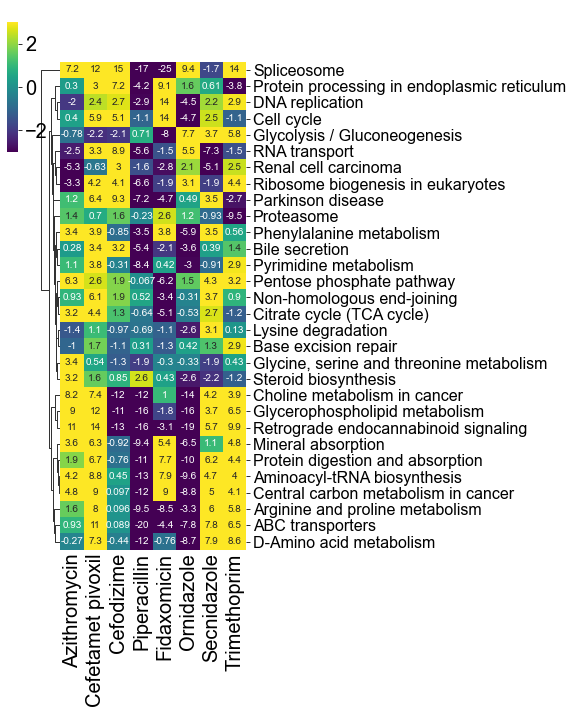

In [239]:
# drug_lists_heatmap = ['Chlorthalidone','Hydroquinidine','Nilvadipine','Pentoxifylline','Vinpocetine'] 
# drug_lists_heatmap = ['Hydroquinidine','Nilvadipine','Vinpocetine'] 
# drug_lists_heatmap = ['Trimetazidine','Linagliptin','Fenofibrate']
# drug_lists_heatmap = ['Cobimetinib', 'Selumetinib','Baricitinib', 'Fedratinib']
# drug_lists_heatmap = ['Valbenazine','Tetrabenazine']
# drug_lists_heatmap = list(df_result_multi.columns)
drug_lists_heatmap = ["Azithromycin","Cefetamet pivoxil","Cefodizime","Piperacillin",
                      "Fidaxomicin","Ornidazole","Secnidazole","Trimethoprim"]

# drug_lists_heatmap = ['Azithromycin','Piperacillin','Cefetamet pivoxil','Cefodizime','Fidaxomicin','Ornidazole','Secnidazole','Trimethoprim','Triclosan',]
# drug_lists_heatmap = ['Lidocaine','Bupivacaine']
# drug_lists_heatmap = ['Yohimbine','Riboflavin','Piperacillin','Hydroquinidine','Valbenazine']
# drug_lists_heatmap = ['Carbinoxamine',	'Chlorphenoxamine']
# select_drugs_for_heatmap = df_result.loc[:, drug_lists_heatmap]
select_drugs_for_heatmap = df_result_multi.loc[:, drug_lists_heatmap]
plot_clusterheatmap2(select_drugs_for_heatmap, low=-3, high=3,figure_size = (6, 9))

In [ ]:
# next step,  build function for jointplot of any select molecules across all drugs

# clustering analysis

In [31]:
def optimise_k_means(data,max_k):
    means=[]
    inertias=[]
    for k in range(1,max_k):
        kmeans=KMeans(n_clusters=k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)
    fig=plt.subplots(figsize=(10,5))
    plt.plot(means,inertias)
    plt.xlabel('number of clusters')
    plt.ylabel('inertia')
    plt.show()

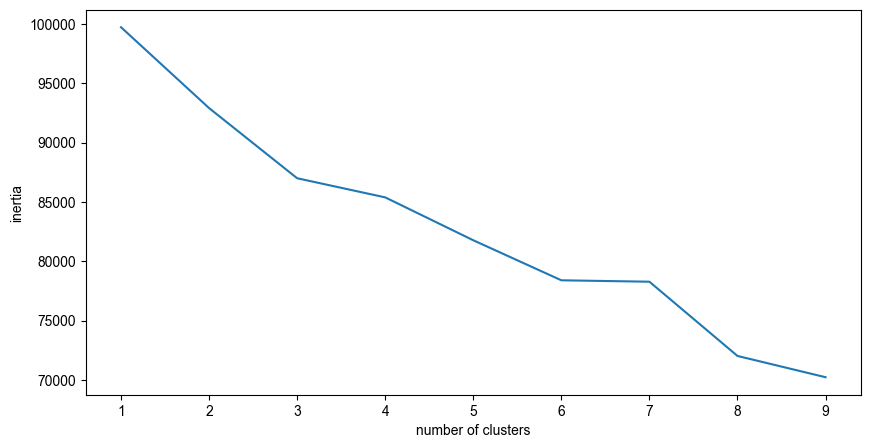

In [32]:
optimise_k_means(multi_hm_df,10)

In [34]:
kmean_df = multi_hm_df 

kmeans=KMeans(n_clusters=4,random_state=26)
kmeans.fit(kmean_df)

kmean_df['kmeans']=kmeans.labels_
kmean_df

,0,1,2,3,4,5,6,7,8,9,...,H2A1C,CALM3,H12,GNAS1,SUMO4,SRSF6,SEP11,HBG2,H2B1L,kmeans
DFO,-0.726048,2.132182,2.132182,3.029935,3.030446,3.119271,3.011129,4.582389,4.266695,4.576217,...,0.233669,0.416248,-2.977887,0.803466,0.139270,-2.291159,-0.140664,1.015484,1.337646,2
Acamprosate,0.205498,-0.460505,-0.460505,-0.069497,-0.070666,0.260887,0.805121,0.703751,0.596500,0.754953,...,1.798060,-0.708186,0.720977,-0.069137,0.883156,-0.726550,-0.417983,1.391986,0.142421,2
Acenocoumarol,-0.605921,0.378469,0.378469,-0.082405,-0.082645,0.611005,0.405461,-0.396861,-0.456427,-0.365363,...,-1.477469,0.511567,-0.683114,0.626527,-0.435191,0.150437,-1.319875,-0.570602,1.732988,3
Adenosylcobalamin,-0.396566,1.863384,1.863384,1.863853,1.863391,2.273244,1.775585,1.300003,1.314701,1.232062,...,0.110574,0.337924,-0.951219,-0.728504,1.164443,-0.273526,0.201295,-0.418260,0.583742,2
Aminophylline,0.053522,-0.431801,-0.431801,-0.851519,-0.851447,-0.008418,-0.752547,-0.794681,-0.848222,-0.769656,...,-0.497334,-0.216722,0.240325,-0.826706,-1.180443,-1.038919,-1.288257,-0.996529,-0.764923,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Troxerutin,0.256464,-0.465497,-0.465497,-0.921213,-0.922245,-0.740697,-1.240129,-0.707605,-0.772199,-0.791377,...,0.800942,0.085950,1.765054,2.720661,-0.319048,-1.783597,-1.014519,-0.993697,-0.995982,3
Valbenazine,-0.507178,-0.720219,-0.720219,-1.223947,-1.221594,-0.773604,-0.937071,-1.704805,-1.717884,-1.722825,...,-0.799952,0.036204,-1.495912,-0.594155,-0.589128,-0.445726,-1.583011,0.307940,-1.321579,3
Vinpocetine,0.962519,-1.112213,-1.112213,-0.820409,-0.818133,-0.922477,-0.701658,-0.398381,0.364556,-0.421102,...,-0.764779,0.572863,-0.792191,-0.391010,0.121393,0.520175,-0.288311,-1.039907,0.054532,3
Yohimbine,-0.672800,-0.751955,-0.751955,-1.268992,-1.266589,-0.994085,-0.914233,-1.216538,-1.243513,-1.220091,...,-0.250186,0.383994,-0.213941,0.118457,0.541737,0.920315,-1.602668,-0.369578,-0.845207,3


In [35]:
ji = kmean_df.sort_values(by='kmeans')

In [37]:
df = ji

# cluster9=df.loc[df['kmeans']==9]
# cluster8=df.loc[df['kmeans']==8]
# cluster7=df.loc[df['kmeans']==7]
# cluster6=df.loc[df['kmeans']==6]
# cluster5=df.loc[df['kmeans']==5]
# cluster4=df.loc[df['kmeans']==4]
cluster3=df.loc[df['kmeans']==3]
cluster2=df.loc[df['kmeans']==2]
cluster1=df.loc[df['kmeans']==1]
cluster0=df.loc[df['kmeans']==0]

In [38]:
cluster3.index

Index(['Quetiapine', 'Piperacillin', 'Thymopentin', 'Tetrabenazine',
       'Trimetazidine', 'Troxerutin', 'Valbenazine', 'Vinpocetine',
       'Riboflavin', 'Phenazopyridine', 'Ixabepilone', 'Penfluridol',
       'Acenocoumarol', 'Aminophylline', 'Baricitinib', 'Benzbromarone',
       'Carbinoxamine maleate salt', 'Chlorthalidone', 'Cysteamine',
       'Deoxycorticosterone acetate', 'Dexrazoxane', 'Fedratinib',
       'Fenofibrate', 'Fidaxomicin', 'Frovatriptan', 'Granisetron',
       'Hydroquinidine', 'Yohimbine', 'Mozavaptan', 'Nilvadipine',
       'Oxyphenisatine', 'Phenazine', 'Zaltoprofen'],
      dtype='object')

In [39]:
cluster2.index

Index(['Saccharin', 'Secnidazole', 'Hexylresorcinol', 'Lidocaine', 'Glafenine',
       'DFO', 'Pentoxifylline', 'Chlorotrianisene', 'Cefetamet pivoxil',
       'Bupivacaine', 'Benzoin', 'Azithromycin', 'Propofol',
       'Adenosylcobalamin', 'Acamprosate', 'Sulpiride', 'Cobimetinib'],
      dtype='object')

In [40]:
cluster0.index

Index(['Danoprevir', 'D-Pantothenic acid', 'Edaravone'], dtype='object')

In [41]:
cluster1.index

Index(['Monocrotaline', 'Thiabendazole', 'Finasteride', 'Ticlopidine',
       'Melitracen', 'Cloperastine', 'Chlorzoxazone', 'Triclosan',
       'Chlorphenoxamine', 'Cefodizime', 'Selumetinib', 'Bromfenac',
       'Trimethoprim', 'Ornidazole', 'Rotigotine', 'Asenapine', 'Raltegravir',
       'Linagliptin', 'Mafenide', 'Nortriptyline'],
      dtype='object')

In [42]:
# data = cluster5

# plt.figure(figsize=(10, 4), edgecolor='#04253a')
# plt.rcParams['font.family'] = 'Arial'
# for i in range(data.shape[0]):
#     plt.plot(range(data.shape[1]-1), data.iloc[i,:-1])  
#     #plt.title(title, fontsize=24)
# plt.xlabel('Treatment', fontsize=24)
# plt.ylabel('Score', fontsize=24)
# plt.xticks(fontsize=20)
# plt.yticks(fontsize=22)

In [43]:
cluster_data = {'drug_Cluster 1': cluster0,
                'drug_Cluster 2': cluster1,
                'drug_Cluster 3': cluster2,
                'drug_Cluster 4': cluster3,}
#                 'drug_Cluster 5': cluster4,
#                 'drug_Cluster 6': cluster5,
#                 'drug_Cluster 7': cluster6,
#                 'drug_Cluster 8': cluster7,
#                 'drug_Cluster 9': cluster8,}

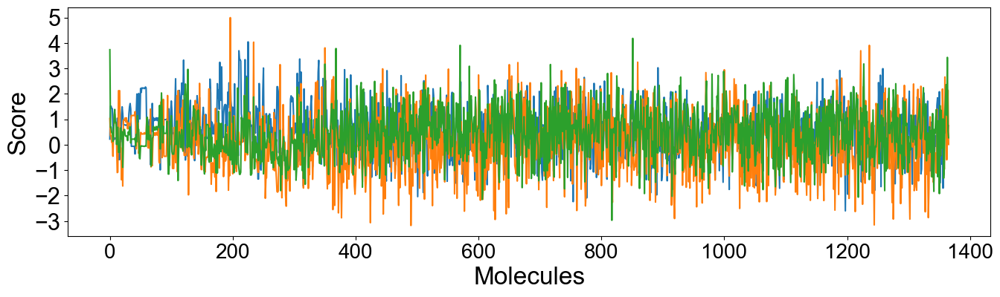

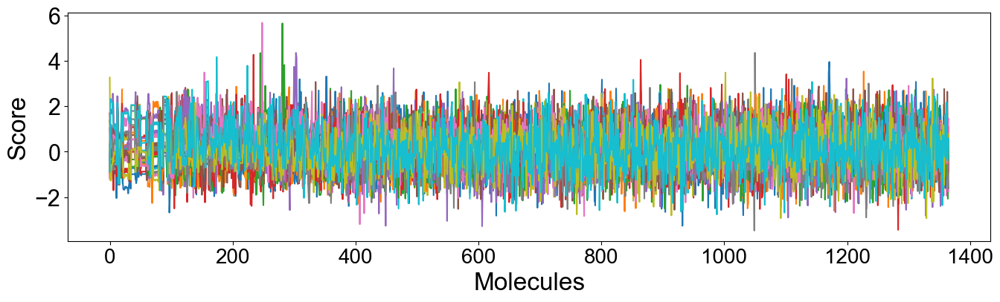

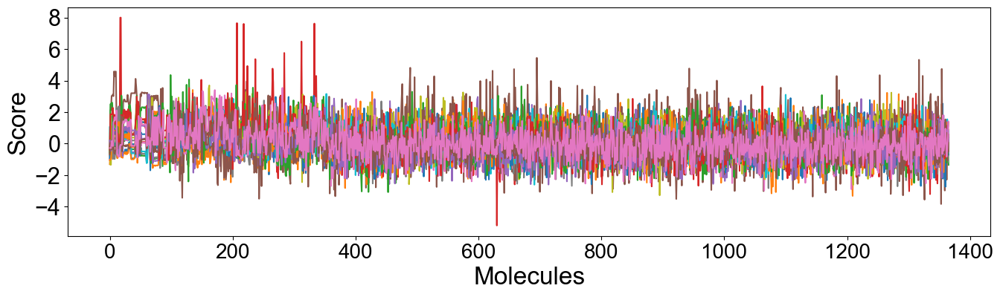

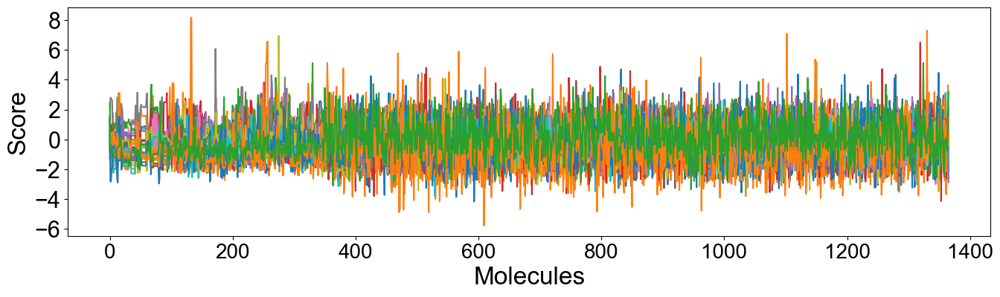

In [384]:
for title, data in cluster_data.items():
    plt.figure(figsize=(16, 4), edgecolor='#04253a')
    plt.rcParams['font.family'] = 'Arial'
    for i in range(data.shape[0]):
        plt.plot(range(data.shape[1]-1), data.iloc[i,:-1])  
        #plt.title(title, fontsize=24)
    plt.xlabel('Molecules', fontsize=24)
    plt.ylabel('Score', fontsize=24)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=22)
#     plt.legend()
#     plt.savefig(r'D:\\project7_SMAD\\figure_3_macro_clustering_analysis\\SI_figures\\{}.svg'.format(title),dpi=800,bbox_inches='tight')
    plt.show()

In [ ]:
df = ji

cluster3=df.loc[df['kmeans']==3]
cluster2=df.loc[df['kmeans']==2]
cluster1=df.loc[df['kmeans']==1]
cluster0=df.loc[df['kmeans']==0]

# Create a dictionary of cluster names and corresponding data
cluster_data = {'drug_Cluster 1': sigpro_stdrow.loc[list(sig_cluster0.index)],
                'drug_Cluster 2': sigpro_stdrow.loc[list(sig_cluster1.index)],
                'drug_Cluster 3': sigpro_stdrow.loc[list(sig_cluster2.index)],
                'drug_Cluster 4': sigpro_stdrow.loc[list(sig_cluster3.index)],}
                #'Cluster 5': sigpro_stdrow.loc[list(sig_cluster4.index)]}

# Loop over the dictionary items to plot the data for each cluster
for title, data in cluster_data.items():
    plt.figure(figsize=(6, 5), edgecolor='#04253a')
    plt.rcParams['font.family'] = 'Arial'
    for i in range(len(data)):
        plt.plot(x, data.iloc[i, :3])  
    #plt.title(title, fontsize=24)
    plt.xlabel('Treatment', fontsize=24)
    plt.ylabel('Score', fontsize=24)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=22)
#     plt.savefig(r'D:\\project7_SMAD\\figure_3_macro_clustering_analysis\\SI_figures\\{}.svg'.format(title),dpi=800,bbox_inches='tight')
    plt.show()

In [58]:
pro_mean = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_mean.csv',index_col = 0)

meta_mean = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_mean.csv',index_col = 0)

In [61]:
# pro_mean

In [62]:
# meta_mean

In [94]:
# pro_all = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_scaled_for_chord.csv',index_col = 0)

# meta_all = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_scaled_for_chord.csv',index_col = 0)

#  heatmap _ clustered_ all_ with _duplicates 

In [149]:
meta_all = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_up_down_scaled.csv',index_col = 0).T
pro_all  = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_up_down_scaled.csv',index_col = 0).T

In [150]:
# DatasetNormalizeDf.standardscaler(df_meta)

In [151]:
# DatasetNormalizeDf.standardscaler(df_pro)

In [152]:
meta_all.columns = [str(item) for item in range(meta_all.shape[1])]

all_dual = pd.concat([meta_all,pro_all], axis=1)

list_name =  ['no'] * meta_all.shape[1]+['yes']* pro_all.shape[1]

In [153]:
len(list_name)

1519

In [154]:
all_dual.T

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
0,-0.692692,0.481974,-0.443984,-0.336520,0.259366,-0.206484,-1.038616,0.818983,0.113689,-0.898844,...,0.240468,-0.495356,-0.093257,-0.491762,-0.941181,0.276824,-0.568886,0.842581,-0.699466,2.877844
1,-0.686562,-0.341802,-0.160574,-1.589803,-0.171199,0.381562,1.638669,0.658416,-0.265531,-0.136224,...,0.891344,-0.466697,-0.434121,-1.244786,-1.043638,-0.422390,0.557852,0.046274,0.413876,1.834564
2,2.970358,-0.062831,0.454830,1.768677,-0.411856,1.805514,0.307265,0.959437,-0.230617,0.110862,...,-0.219515,0.926846,0.786699,-0.943041,0.054173,-0.907903,0.188267,-0.001483,-1.076976,-0.457208
3,3.790890,-0.107755,-0.449430,2.174696,-0.656319,-0.082493,-0.324043,-0.436053,1.454932,0.161753,...,-1.352745,-0.194360,-0.529529,-0.016167,0.568274,-1.013419,-1.533918,-0.922109,-1.453629,-0.879550
4,3.790890,-0.107755,-0.449430,2.174696,-0.656319,-0.082493,-0.324043,-0.436053,1.454932,0.161753,...,-1.352745,-0.194360,-0.529529,-0.016167,0.568274,-1.013419,-1.533918,-0.922109,-1.453629,-0.879550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SUMO4,0.139270,0.883156,-0.435191,1.164443,-1.180443,1.062382,0.439580,0.002667,-1.233094,0.871436,...,-1.099053,0.719595,1.065244,0.345754,-0.164903,-0.319048,-0.589128,0.121393,0.541737,0.093402
SRSF6,-2.291159,-0.726550,0.150437,-0.273526,-1.038919,0.373302,1.142281,0.393206,0.472177,0.258343,...,-0.307866,-0.111621,-0.064245,1.128222,1.485820,-1.783597,-0.445726,0.520175,0.920315,-0.604263
SEP11,-0.140664,-0.417983,-1.319875,0.201295,-1.288257,0.363219,1.354738,0.540491,-0.194186,0.457809,...,0.194999,-0.108732,-1.200854,-1.220134,0.371361,-1.014519,-1.583011,-0.288311,-1.602668,-0.773247
HBG2,1.015484,1.391986,-0.570602,-0.418260,-0.996529,-0.682445,1.009468,0.731390,0.522725,-0.427264,...,0.242540,-0.764577,-1.201378,-0.798863,-2.072207,-0.993697,0.307940,-1.039907,-0.369578,1.320742


In [155]:
category_colors = {
    'Analgesics/Anesthetics': 'green',
    'Miscellaneous': 'orange',
    'Nutritional Supplements': 'blue',
    'Antihistamines/Antiallergics':'#f4acb7' ,
    'Antibiotics/Antimicrobials': 'purple',
    'Cardiovascular Agents': 'brown',
    'Anticancer Agents': 'red',
    'CNS Agents': 'gray',
    'Immunomodulators': '#606c38',
    'Gastrointestinal Agents': 'cyan'
}

In [156]:
# dict(zip(merged_df2.index, merged_df2['cato']))

In [157]:
# merged_df2

In [158]:
drug_type_dict = dict(zip(merged_df2.index, merged_df2['cato']))

In [159]:
drug_cato_list = ["Miscellaneous"] + [drug_type_dict[drug] for drug in all_dual.index if drug in drug_type_dict]

In [160]:
# pd.Series(drug_cato_list).map(category_colors).tolist()

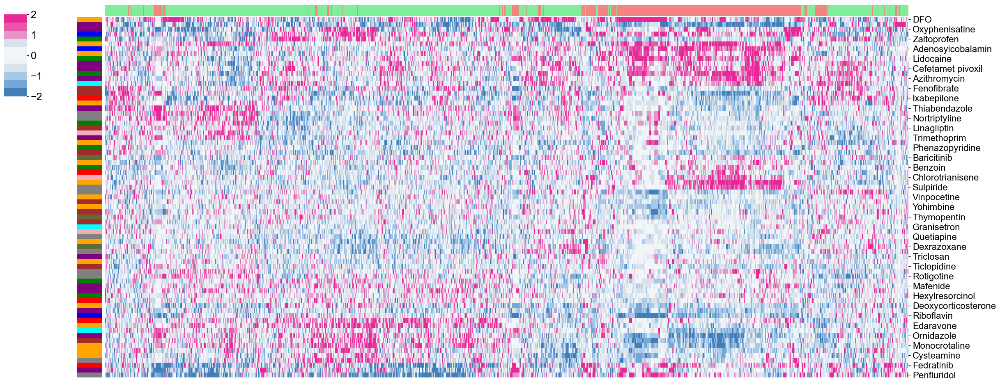

In [171]:
colors = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998"]
n_bins = 10  # Number of bins in the color map
cmap_name = "custom_diverging"
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

color_dict = {"yes": '#80ed99', "no": '#f28482'} 
category_colors = {
    'Analgesics/Anesthetics': 'green',
    'Miscellaneous': 'orange',
    'Nutritional Supplements': 'blue',
    'Antihistamines/Antiallergics':'#f4acb7' ,
    'Antibiotics/Antimicrobials': 'purple',
    'Cardiovascular Agents': 'brown',
    'Anticancer Agents': 'red',
    'CNS Agents': 'gray',
    'Immunomodulators': '#606c38',
    'Gastrointestinal Agents': 'cyan'
}

col_colors = pd.Series(list_name).map(color_dict).tolist()
row_colors = pd.Series(drug_cato_list).map(category_colors).tolist()
colors_transposed = dict(zip(all_dual.T.index, col_colors))
row_colors_transposed = dict(zip(all_dual.index, row_colors))
# Create the heatmap with the custom color map
plt.rcParams['font.family'] = 'Arial'
 # Create the heatmap with the custom color map, figure size, and hidden dendrograms
g = sns.clustermap(all_dual, annot=False, cmap=custom_cmap, vmin=-2, vmax=2,
                   col_colors=all_dual.T.index.map(colors_transposed),
                   row_colors= all_dual.index.map(row_colors_transposed),
                        figsize=(22, 10),  # Set the figure size here
                        row_cluster=True,  # Enable row clustering
                        col_cluster=True,  # Enable column clustering
                        dendrogram_ratio=(.001, .001),  # Minimize the dendrogram size
                        tree_kws={'linewidths': 0},
                        fmt=".3f",
                        cbar_pos=(-0.07, 0.76, 0.025, 0.20))  # Make dendrogram lines invisible
# Set tick label size
# g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(),rotation=90, fontsize=16)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize=16)
# g.ax_heatmap.set_yticklabels([])
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.tick_params(axis='x', which='both', length=0)
g.ax_row_dendrogram.set_position([0.12, 0.12, 0.20, 0.65])  # [x, y, width, height]
cbar = g.cax
for label in cbar.get_yticklabels():
    label.set_size(18)  # 设置字体大小为16   
plt.show()

# UMAP analysis

In [181]:
rawdf_meta = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_after_Normalization imputation BC and index rename.csv',index_col = 0)

In [182]:
rawdf_pro = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_after_Normalization imputation BC and index rename.csv',index_col = 0)

In [201]:
# rawdf_meta

In [185]:
combine = pd.concat([rawdf_meta,rawdf_pro], axis=0)

In [196]:
import umap

# Function to determine label
def get_label(index):
    for name in namestrings:
        if name in index:
            return name
    return 'others'
def plot_umap(df, namestring = ['1'], figuretitle = 'UMAP'):
    plt.rcParams['font.family'] = 'Arial'
    reducer = umap.UMAP(n_neighbors=15, n_components=2, random_state=42)

    embedding = reducer.fit_transform(df)   
    # Step 3: Create a new DataFrame for UMAP results
    umap_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'], index=df.index)
    
    # Step 4: Add non-numeric labels to the new DataFrame
#     umap_df['Label'] = df.index.map(lambda x: namestring1 if namestring1 in x else
#                                               namestring2 if namestring2 in x else
#                                               namestring3 if namestring3 in x else 'others')
    umap_df['Label'] = df.index.map(get_label)

    # Step 5: Plot using the new DataFrame
    #palette = {namestring: 'red', 'others': 'grey'}
    #palette = color_dict
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue='Label', data=umap_df, s=60, alpha=0.8, legend=True)
    plt.title(figuretitle,fontsize=20)
    plt.xlabel('UMAP 1',fontsize=20)
    plt.ylabel('UMAP 2',fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()

In [199]:
def plot_umap2(df, namestring = ['1'], figuretitle = 'UMAP'):
    plt.rcParams['font.family'] = 'Arial'
    reducer = umap.UMAP(n_neighbors=15, n_components=2, random_state=42)
    scaler = StandardScaler()
    # Fit and transform the data according to rows
    df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
    embedding = reducer.fit_transform(df_scaled)   
    # Step 3: Create a new DataFrame for UMAP results
    umap_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'], index=df.index)
    
    # Step 4: Add non-numeric labels to the new DataFrame
#     umap_df['Label'] = df.index.map(lambda x: namestring1 if namestring1 in x else
#                                               namestring2 if namestring2 in x else
#                                               namestring3 if namestring3 in x else 'others')
    umap_df['Label'] = df.index.map(get_label)

    # Step 5: Plot using the new DataFrame
    #palette = {namestring: 'red', 'others': 'grey'}
    #palette = color_dict
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue='Label', data=umap_df, s=40, alpha=0.8, legend=True)
    plt.title(figuretitle,fontsize=20)
    plt.xlabel('UMAP 1',fontsize=20)
    plt.ylabel('UMAP 2',fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
#     plt.savefig(f'{figure_save_path}/{figuretitle}.svg',dpi=800,bbox_inches='tight')
    plt.show()

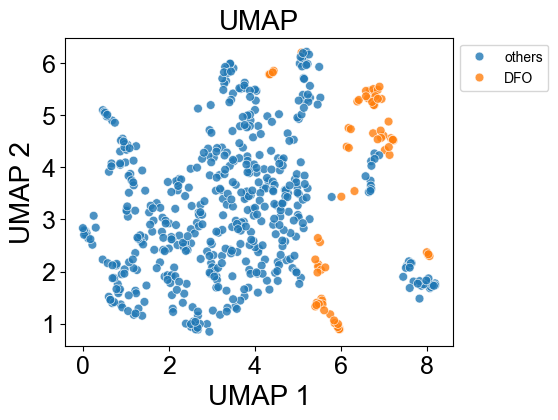

In [200]:
namestrings = ['DFO']

plot_umap2(combine.T, namestring = namestrings, figuretitle = 'UMAP')

In [29]:
pro_all 

,TRYP,ALBU,FBLL1,DX39A,BACH,SMAP,PSD11,PSD12,PGRC1,DFFA,...,RAB1B,H2A1C,CALM3,H12,GNAS1,SUMO4,SRSF6,SEP11,HBG2,H2B1L
DFO,-0.629098,1.560063,-0.052639,2.986600,-3.164628,1.673678,-0.962388,-0.119824,1.473542,1.152320,...,1.312462,0.233669,0.416248,-2.977887,0.803466,0.139270,-2.291159,-0.140664,1.015484,1.337646
Acamprosate,0.624163,0.941379,0.245700,-1.024791,-0.923974,1.185195,-0.413468,1.422591,2.424608,0.889014,...,0.283903,1.798060,-0.708186,0.720977,-0.069137,0.883156,-0.726550,-0.417983,1.391986,0.142421
Acenocoumarol,0.459005,0.081906,0.111738,-0.105770,1.101587,-0.756664,0.879547,-0.309204,-1.000588,1.151491,...,0.073769,-1.477469,0.511567,-0.683114,0.626527,-0.435191,0.150437,-1.319875,-0.570602,1.732988
Adenosylcobalamin,-0.898440,0.512818,-0.248629,-0.060809,-0.567072,0.409324,0.238538,-0.453544,0.197594,-0.291601,...,-0.561696,0.110574,0.337924,-0.951219,-0.728504,1.164443,-0.273526,0.201295,-0.418260,0.583742
Aminophylline,1.330097,0.138553,-1.543070,-0.218265,-0.053726,-0.671589,-0.235491,-0.508910,-0.860037,-1.235006,...,-0.458981,-0.497334,-0.216722,0.240325,-0.826706,-1.180443,-1.038919,-1.288257,-0.996529,-0.764923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Troxerutin,-0.400156,0.052956,-1.302367,-0.335606,0.637187,0.235068,1.626686,1.312949,0.729660,0.391163,...,-0.854547,0.800942,0.085950,1.765054,2.720661,-0.319048,-1.783597,-1.014519,-0.993697,-0.995982
Valbenazine,1.156222,0.000584,0.115570,0.700193,1.224638,-0.079198,0.284084,-0.807369,-0.439838,-0.538900,...,2.820195,-0.799952,0.036204,-1.495912,-0.594155,-0.589128,-0.445726,-1.583011,0.307940,-1.321579
Vinpocetine,0.421070,-1.439986,-0.063386,-0.037180,-0.039251,1.249016,0.462966,-0.302540,0.047322,-1.267917,...,-0.396374,-0.764779,0.572863,-0.792191,-0.391010,0.121393,0.520175,-0.288311,-1.039907,0.054532
Yohimbine,0.469899,0.143227,2.101086,0.082453,-0.195647,-0.504798,-0.550234,-0.591056,-1.125770,-0.122957,...,0.730162,-0.250186,0.383994,-0.213941,0.118457,0.541737,0.920315,-1.602668,-0.369578,-0.845207


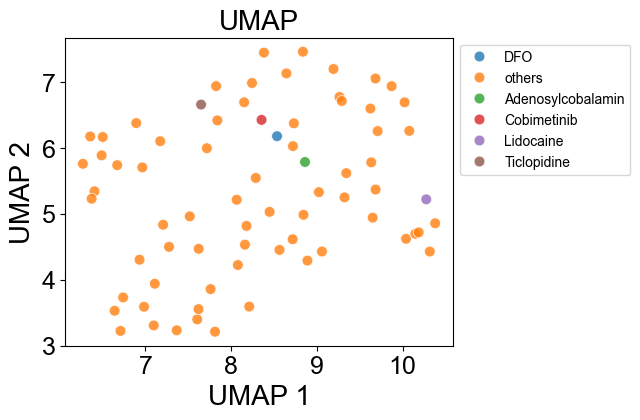

In [40]:
namestrings = ['Cobimetinib', 'Lidocaine', 'Ticlopidine', 'Adenosylcobalamin', 'DFO']

plot_umap(pro_all, namestring = namestrings, figuretitle = 'UMAP')

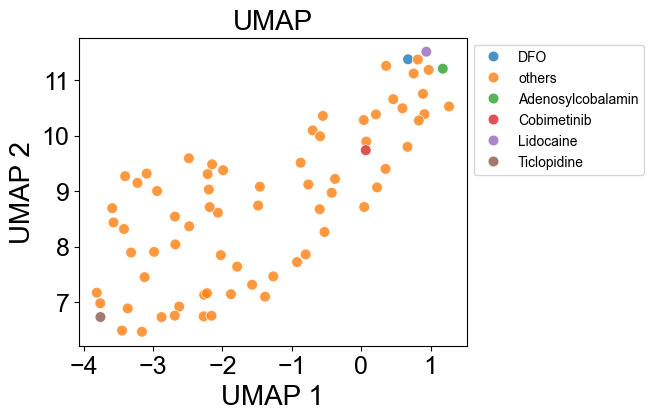

In [41]:
namestrings = ['Cobimetinib', 'Lidocaine', 'Ticlopidine', 'Adenosylcobalamin', 'DFO']

plot_umap(meta_all, namestring = namestrings, figuretitle = 'UMAP')

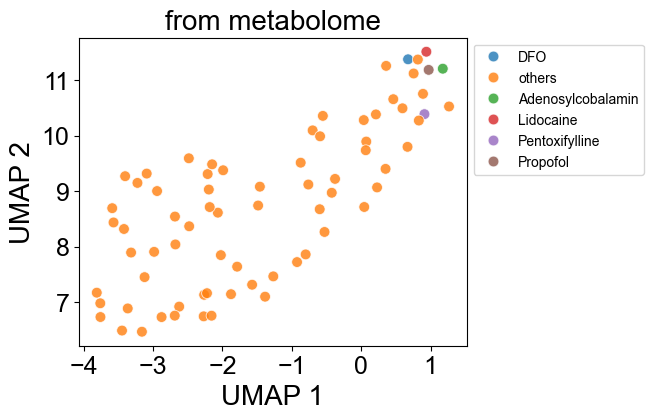

In [47]:
namestrings = ['Adenosylcobalamin', 'Lidocaine', 'Pentoxifylline', 'Propofol', 'DFO']

plot_umap(meta_all, namestring = namestrings, figuretitle = 'from metabolome')


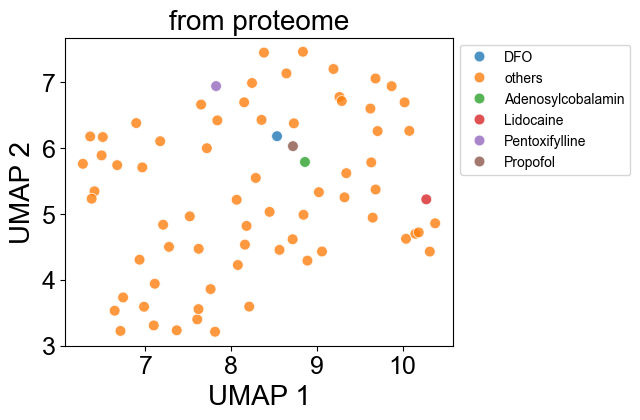

In [48]:


namestrings = ['Adenosylcobalamin', 'Lidocaine', 'Pentoxifylline', 'Propofol', 'DFO']

plot_umap(pro_all, namestring = namestrings, figuretitle = 'from proteome')


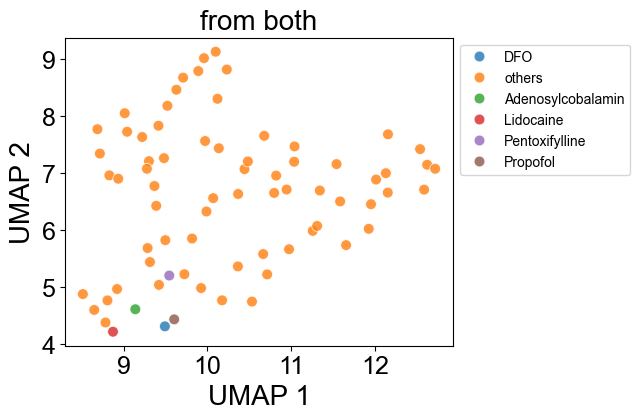

In [49]:
namestrings = ['Adenosylcobalamin', 'Lidocaine', 'Pentoxifylline', 'Propofol', 'DFO']

plot_umap(all_dual, namestring = namestrings, figuretitle = 'from both')

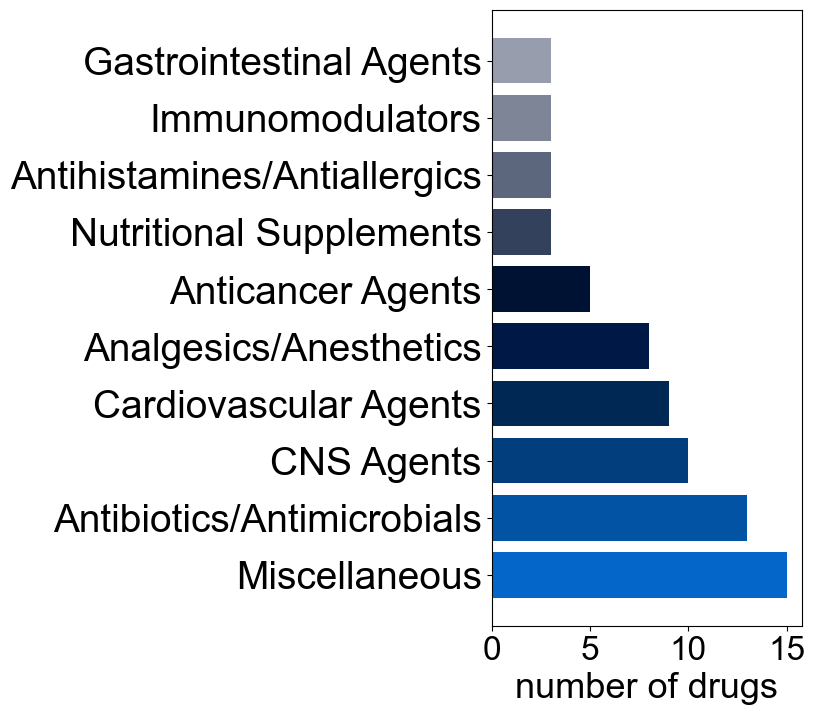

In [287]:
from collections import Counter

plt.figure(figsize=(4, 8))
plt.rcParams['font.family'] = 'Arial'
# Example list
example_list = [item.split('.')[-1] for item in df_drug_cato['cato']]

# Count the occurrences of each element in the list
count = Counter(example_list)

# Get the top 3 most common items
top_items = count.most_common(10)

# Separate the keys and values for plotting
labels, values = zip(*top_items)
# colorss = ["#437EB8", "#8EBBE7", "#D8E2EB", "white", "#D8E2EB", "#EB6CB6", "#E72998",'#0466c8', '#023e7d', '#023e7d']
colorss =["#0466c8","#0353a4","#023e7d","#002855","#001845","#001233","#33415c","#5c677d","#7d8597","#979dac"]
# Create a bar plot
plt.barh(labels, values,color = colorss)
plt.xlabel('number of drugs',fontsize = 26)
# plt.ylabel('number of drugs')
plt.xticks([0, 5, 10,15],fontsize = 24)
plt.yticks(fontsize = 28)
# plt.title('Count of Items in List')
plt.show()



In [5]:
cor_meta = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\metabolome\test\files\metabolome_correlation.csv',index_col = 0)
cor_pro = pd.read_csv(r'C:\Users\jiangy5\Box\SMAD PROJECT\new_druganalysis\proteome\test\files\proteome_correlation.csv',index_col = 0)

In [6]:
cor_meta

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
DFO,1.000000,0.221538,0.322456,0.643012,-0.350737,-0.036194,-0.303921,-0.346883,0.009299,0.204637,...,-0.258913,0.638135,0.356967,0.446642,0.624886,-0.362654,-0.464479,-0.339461,-0.039947,-0.212127
Acamprosate,0.221538,1.000000,0.350130,0.021710,0.271040,0.518193,-0.008943,0.497823,0.697327,0.170793,...,0.124375,0.266864,0.308325,0.541427,0.364332,0.458214,0.220867,0.249925,0.720017,0.499514
Acenocoumarol,0.322456,0.350130,1.000000,0.055426,-0.049087,0.494923,0.355155,0.142315,-0.121814,0.400294,...,0.494944,0.638822,0.728456,0.116412,0.362375,-0.025835,-0.004453,-0.172510,0.285529,0.457655
Adenosylcobalamin,0.643012,0.021710,0.055426,1.000000,-0.489417,-0.663039,-0.852203,-0.815679,-0.211942,-0.370802,...,-0.795328,0.408386,0.320199,0.711452,0.831264,-0.096533,-0.860486,-0.653860,-0.438409,-0.730596
Aminophylline,-0.350737,0.271040,-0.049087,-0.489417,1.000000,0.490410,0.331334,0.658598,0.505103,0.533035,...,0.389509,0.117760,0.148423,-0.106279,-0.324122,0.551529,0.804051,0.841851,0.661043,0.463364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Troxerutin,-0.362654,0.458214,-0.025835,-0.096533,0.551529,0.101979,-0.202174,0.332714,0.645645,0.010066,...,-0.100842,-0.006513,0.062187,0.462479,0.101799,1.000000,0.321454,0.443568,0.520037,0.212393
Valbenazine,-0.464479,0.220867,-0.004453,-0.860486,0.804051,0.747637,0.723547,0.906643,0.480388,0.610296,...,0.730408,-0.084404,-0.089233,-0.456680,-0.647928,0.321454,1.000000,0.911556,0.715217,0.746437
Vinpocetine,-0.339461,0.249925,-0.172510,-0.653860,0.841851,0.569956,0.444163,0.784001,0.627808,0.563942,...,0.475946,0.016332,-0.099443,-0.243017,-0.494081,0.443568,0.911556,1.000000,0.713895,0.548676
Yohimbine,-0.039947,0.720017,0.285529,-0.438409,0.661043,0.802727,0.384705,0.840694,0.813326,0.584612,...,0.485363,0.249122,0.112657,0.207800,0.007751,0.520037,0.715217,0.713895,1.000000,0.784108


In [30]:
p_cor  = cor_pro.sort_values(by='DFO')
m_cor  = cor_meta.sort_values(by='DFO')

In [37]:
p_cor 

,DFO,Acamprosate,Acenocoumarol,Adenosylcobalamin,Aminophylline,Asenapine,Azithromycin,Baricitinib,Benzbromarone,Benzoin,...,Thymopentin,Ticlopidine,Triclosan,Trimetazidine,Trimethoprim,Troxerutin,Valbenazine,Vinpocetine,Yohimbine,Zaltoprofen
Chlorthalidone,-0.472426,-0.351908,-0.059021,-0.365874,-0.297514,-0.164389,-0.186696,-0.299145,-0.054477,-0.650850,...,-0.442784,-0.229327,-0.489946,0.302185,0.202082,-0.593650,-0.508446,-0.048448,-0.662124,0.235888
Ixabepilone,-0.469825,-0.447682,-0.504225,-0.373183,0.612996,-0.051969,-0.500392,-0.334131,-0.167869,0.045520,...,0.366536,-0.678911,-0.152044,-0.376208,-0.576563,0.153514,0.193053,-0.102616,0.266329,-0.600328
Raltegravir,-0.352647,-0.301863,-0.616767,-0.515171,0.388519,0.426878,-0.468566,-0.272687,-0.471692,0.199792,...,0.429578,-0.517265,0.230057,-0.747292,-0.647173,0.335856,0.591671,-0.128178,0.385841,-0.732299
Tetrabenazine,-0.313403,0.326773,-0.428275,-0.270470,-0.046249,0.161616,-0.502873,-0.457975,0.207794,-0.041730,...,0.118178,-0.182564,0.091602,0.146029,0.227726,0.272439,-0.015075,-0.109415,-0.236371,-0.154541
Frovatriptan,-0.281101,-0.084365,-0.663407,-0.325746,0.548517,0.025629,-0.586949,-0.420089,-0.040438,0.418426,...,0.669881,-0.587171,0.151072,-0.442178,-0.628828,0.455376,0.486813,-0.208057,0.591314,-0.894210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cobimetinib,0.817614,0.477856,0.884327,0.758104,-0.059669,-0.061021,0.829400,0.573068,0.381265,0.374267,...,-0.087826,0.851868,0.341234,0.396688,0.553424,0.125811,-0.068415,0.544081,0.137672,0.760177
Lidocaine,0.824841,0.698445,0.512957,0.596890,0.117838,0.238029,0.497250,0.359057,0.250852,0.524374,...,0.245194,0.776319,0.746104,0.041125,0.457797,0.543414,0.499797,0.492329,0.403216,0.389381
Ticlopidine,0.830164,0.544539,0.794698,0.654577,-0.076344,0.242174,0.725428,0.513027,0.178019,0.220597,...,-0.134908,1.000000,0.532549,0.293128,0.611308,0.126172,0.205248,0.564615,0.095963,0.727114
Adenosylcobalamin,0.838968,0.558432,0.621212,1.000000,0.028695,-0.179282,0.550259,0.357733,0.565933,0.507082,...,0.221325,0.654577,0.352441,0.469370,0.510855,0.306010,-0.046784,0.330245,0.353167,0.411432


In [31]:
p_cor.index[-5:]

Index(['Cobimetinib', 'Lidocaine', 'Ticlopidine', 'Adenosylcobalamin', 'DFO'], dtype='object')

In [42]:
m_cor.index[-5:]

Index(['Ticlopidine', 'Adenosylcobalamin', 'Lidocaine', 'Pentoxifylline',
       'Propofol', 'DFO'],
      dtype='object')